Mayhem at DinoFun World: Visitor Movement

James Godkin

In [276]:
import zipfile
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
import matplotlib.animation as animation
from sklearn.cluster import AgglomerativeClustering
# #!pip install hdbscan
# import hdbscan

In [277]:
dataroot = "dataroot/"
!mkdir dataroot 
!wget -P dataroot https://github.com/emmanueliarussi/DataScienceCapstone/raw/master/7_FinalProjects/MayhemDinoFunWorldVisitorMovement/data/task1.zip

mkdir: cannot create directory ‘dataroot’: File exists
--2021-08-20 22:52:35--  https://github.com/emmanueliarussi/DataScienceCapstone/raw/master/7_FinalProjects/MayhemDinoFunWorldVisitorMovement/data/task1.zip
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://media.githubusercontent.com/media/emmanueliarussi/DataScienceCapstone/master/7_FinalProjects/MayhemDinoFunWorldVisitorMovement/data/task1.zip [following]
--2021-08-20 22:52:36--  https://media.githubusercontent.com/media/emmanueliarussi/DataScienceCapstone/master/7_FinalProjects/MayhemDinoFunWorldVisitorMovement/data/task1.zip
Resolving media.githubusercontent.com (media.githubusercontent.com)... 185.199.109.133, 185.199.111.133, 185.199.110.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|185.199.109.133|:443... connected.
HTTP request sent, awaiting response...

In [278]:
# Unzip
with zipfile.ZipFile(dataroot+"task1.zip","r") as zip_ref:
    zip_ref.extractall(dataroot)
print('Done')

Done


In [279]:
guestMoveFri_df = pd.read_csv('/content/dataroot/task1/park-movement-Fri-FIXED-2.0.csv')
guestMoveSat_df = pd.read_csv('/content/dataroot/task1/park-movement-Sat.csv')
guestMoveSun_df = pd.read_csv('/content/dataroot/task1/park-movement-Sun.csv')
print(guestMoveFri_df)
print(guestMoveSat_df)
print(guestMoveSun_df)

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning: Columns (1,3,4) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


                  Timestamp       id      type   X   Y
0        2014-6-06 08:00:16  1591741  check-in  63  99
1        2014-6-06 08:00:16   825652  check-in  63  99
2        2014-6-06 08:00:19   179386  check-in  63  99
3        2014-6-06 08:00:19   531348  check-in  63  99
4        2014-6-06 08:00:31  1483004  check-in   0  67
...                     ...      ...       ...  ..  ..
6010909  2014-6-06 23:26:27    33357  movement  64  98
6010910  2014-6-06 23:26:27  1283679  movement  63  98
6010911  2014-6-06 23:26:34  1809880  movement  63  99
6010912  2014-6-06 23:26:35  1283679  movement  63  99
6010913  2014-6-06 23:26:35    33357  movement  63  99

[6010914 rows x 5 columns]
                  Timestamp       id      type   X   Y
0        2014-6-07 08:00:08  1102394  check-in  99  77
1        2014-6-07 08:00:08  1187304  check-in  63  99
2        2014-6-07 08:00:08  1363700  check-in  99  77
3        2014-6-07 08:00:10  1449032  check-in  63  99
4        2014-6-07 08:00:10   279658 

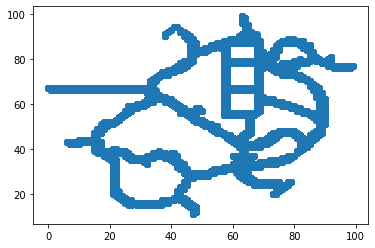

In [280]:
plt.scatter(guestMoveFri_df['X'], guestMoveFri_df['Y'])
plt.show()

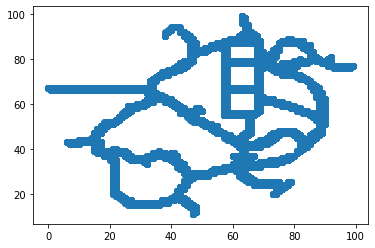

In [281]:
plt.scatter(guestMoveSat_df['X'], guestMoveSat_df['Y'])
plt.show()

In [282]:
# plt.scatter(guestMoveSun_df['X'], guestMoveSun_df['Y'])
# plt.show()

In [283]:
print(guestMoveSun_df.info())
guestMoveSun_df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10932426 entries, 0 to 10932425
Data columns (total 5 columns):
 #   Column     Dtype 
---  ------     ----- 
 0   Timestamp  object
 1   id         object
 2   type       object
 3   X          object
 4   Y          object
dtypes: object(5)
memory usage: 417.0+ MB
None


,Timestamp,id,type,X,Y
count,10932426,10932425,10932425,10932425,10932425
unique,55134,8216,3,201,179
top,2014-6-08 11:02:05,1529852,movement,69,66
freq,850,2920,10801766,360130,375732


In [284]:
print(guestMoveSat_df.info())
guestMoveSat_df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9078623 entries, 0 to 9078622
Data columns (total 5 columns):
 #   Column     Dtype 
---  ------     ----- 
 0   Timestamp  object
 1   id         int64 
 2   type       object
 3   X          int64 
 4   Y          int64 
dtypes: int64(3), object(2)
memory usage: 346.3+ MB
None


,id,X,Y
count,9.078623e+06,9.078623e+06,9.078623e+06
mean,1.052440e+06,5.065925e+01,5.415585e+01
std,6.031683e+05,1.978194e+01,2.023713e+01
min,8.780000e+02,0.000000e+00,1.100000e+01
25%,5.451510e+05,3.400000e+01,3.700000e+01
50%,1.048966e+06,5.200000e+01,5.300000e+01
75%,1.574554e+06,6.600000e+01,7.000000e+01
max,2.096426e+06,9.900000e+01,9.900000e+01


In [285]:
print(guestMoveSat_df.info())
guestMoveSat_df.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9078623 entries, 0 to 9078622
Data columns (total 5 columns):
 #   Column     Dtype 
---  ------     ----- 
 0   Timestamp  object
 1   id         int64 
 2   type       object
 3   X          int64 
 4   Y          int64 
dtypes: int64(3), object(2)
memory usage: 346.3+ MB
None


,id,X,Y
count,9.078623e+06,9.078623e+06,9.078623e+06
mean,1.052440e+06,5.065925e+01,5.415585e+01
std,6.031683e+05,1.978194e+01,2.023713e+01
min,8.780000e+02,0.000000e+00,1.100000e+01
25%,5.451510e+05,3.400000e+01,3.700000e+01
50%,1.048966e+06,5.200000e+01,5.300000e+01
75%,1.574554e+06,6.600000e+01,7.000000e+01
max,2.096426e+06,9.900000e+01,9.900000e+01


In [286]:
# guestMoveSun_df[['id','X','Y']].astype('int64')
# print(guestMoveSun_df.info())
# guestMoveSun_df.describe()

In [287]:
print(guestMoveSun_df.isnull().sum())
guestMoveSun_df[pd.isnull(guestMoveSun_df["X"])]

Timestamp    0
id           1
type         1
X            1
Y            1
dtype: int64


,Timestamp,id,type,X,Y
4332992,2014-6-08 13:14:3,NaN,NaN,NaN,NaN


In [288]:
guestMoveSun_df.loc[4332992, 'type'] = 'ERROR'
guestMoveSun_df = guestMoveSun_df.fillna(-1)
print(guestMoveSun_df.isnull().sum())
guestMoveSun_df[pd.isnull(guestMoveSun_df["X"])]
print(guestMoveSun_df.loc[4332992])

Timestamp    0
id           0
type         0
X            0
Y            0
dtype: int64
Timestamp    2014-6-08 13:14:3
id                          -1
type                     ERROR
X                           -1
Y                           -1
Name: 4332992, dtype: object


In [289]:
# guestMoveSun_df = guestMoveSun_df.astype(str).apply(lambda x: x.str.replace(" ", "") if x.dtype == 'object' else x)
# guestMoveSun_df

In [290]:
#guestMoveSun_df.drop(guestMoveSun_df.tail(10932425).index,inplace=True) # drop last n rows
guestMoveSun_df = guestMoveSun_df[:-1]
guestMoveSun_df[['id','X','Y']] = guestMoveSun_df[['id','X','Y']].astype('int64')
print(guestMoveSun_df)
print(guestMoveSun_df.info())
guestMoveSun_df.describe()

                   Timestamp       id      type   X   Y
0         2014-6-08 08:00:11  1923259  check-in   0  67
1         2014-6-08 08:00:11    39012  check-in   0  67
2         2014-6-08 08:00:11   613364  check-in   0  67
3         2014-6-08 08:00:14   100951  check-in  99  77
4         2014-6-08 08:00:14  1959069  check-in  99  77
...                      ...      ...       ...  ..  ..
10932420  2014-6-08 23:25:13    71913  movement  63  99
10932421  2014-6-08 23:25:13   785325  movement  63  99
10932422  2014-6-08 23:25:13   791077  movement  63  99
10932423  2014-6-08 23:25:13   874286  movement  63  99
10932424  2014-6-08 23:25:13   941561  movement  63  99

[10932425 rows x 5 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10932425 entries, 0 to 10932424
Data columns (total 5 columns):
 #   Column     Dtype 
---  ------     ----- 
 0   Timestamp  object
 1   id         int64 
 2   type       object
 3   X          int64 
 4   Y          int64 
dtypes: int64(3), object

,id,X,Y
count,1.093242e+07,1.093242e+07,1.093242e+07
mean,1.053626e+06,5.051827e+01,5.413520e+01
std,6.044434e+05,1.976258e+01,2.031702e+01
min,-1.000000e+00,-1.000000e+00,-1.000000e+00
25%,5.300790e+05,3.400000e+01,3.700000e+01
50%,1.056414e+06,5.100000e+01,5.300000e+01
75%,1.577372e+06,6.600000e+01,7.000000e+01
max,2.096426e+06,9.900000e+01,9.900000e+01


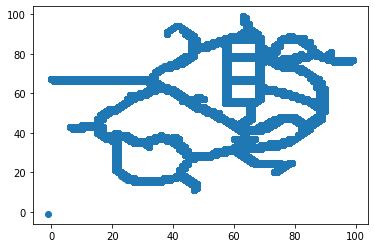

In [291]:
plt.scatter(guestMoveSun_df['X'], guestMoveSun_df['Y'])
plt.show()

In [292]:
guestMoveFri_df['Timestamp']= pd.to_datetime(guestMoveFri_df['Timestamp'])
guestMoveFri_df

,Timestamp,id,type,X,Y
0,2014-06-06 08:00:16,1591741,check-in,63,99
1,2014-06-06 08:00:16,825652,check-in,63,99
2,2014-06-06 08:00:19,179386,check-in,63,99
3,2014-06-06 08:00:19,531348,check-in,63,99
4,2014-06-06 08:00:31,1483004,check-in,0,67
...,...,...,...,...,...
6010909,2014-06-06 23:26:27,33357,movement,64,98
6010910,2014-06-06 23:26:27,1283679,movement,63,98
6010911,2014-06-06 23:26:34,1809880,movement,63,99
6010912,2014-06-06 23:26:35,1283679,movement,63,99


In [293]:
print(guestMoveFri_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6010914 entries, 0 to 6010913
Data columns (total 5 columns):
 #   Column     Dtype         
---  ------     -----         
 0   Timestamp  datetime64[ns]
 1   id         int64         
 2   type       object        
 3   X          int64         
 4   Y          int64         
dtypes: datetime64[ns](1), int64(3), object(1)
memory usage: 229.3+ MB
None


In [294]:
guestMoveSat_df['Timestamp']= pd.to_datetime(guestMoveSat_df['Timestamp'])
guestMoveSun_df['Timestamp']= pd.to_datetime(guestMoveSun_df['Timestamp'])
print(guestMoveSat_df.info())
print(guestMoveSun_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9078623 entries, 0 to 9078622
Data columns (total 5 columns):
 #   Column     Dtype         
---  ------     -----         
 0   Timestamp  datetime64[ns]
 1   id         int64         
 2   type       object        
 3   X          int64         
 4   Y          int64         
dtypes: datetime64[ns](1), int64(3), object(1)
memory usage: 346.3+ MB
None
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10932425 entries, 0 to 10932424
Data columns (total 5 columns):
 #   Column     Dtype         
---  ------     -----         
 0   Timestamp  datetime64[ns]
 1   id         int64         
 2   type       object        
 3   X          int64         
 4   Y          int64         
dtypes: datetime64[ns](1), int64(3), object(1)
memory usage: 417.0+ MB
None


In [295]:
#checkingMisTime = (guestMoveSun_df['Timestamp'] > '2014-6-08 13:14:02') & (guestMoveSun_df['Timestamp'] <= '2014-6-08 13:14:03')
#pd.set_option('display.max_rows', 10)
#guestMoveSun_df.loc[[4332991,4332992,4332993]]
#4332992 is an error in the data and is removed
guestMoveSun_df = guestMoveSun_df.drop(4332992)
# guestMoveSun_df.loc[4332992]

In [296]:
guestMoveSun_df

,Timestamp,id,type,X,Y
0,2014-06-08 08:00:11,1923259,check-in,0,67
1,2014-06-08 08:00:11,39012,check-in,0,67
2,2014-06-08 08:00:11,613364,check-in,0,67
3,2014-06-08 08:00:14,100951,check-in,99,77
4,2014-06-08 08:00:14,1959069,check-in,99,77
...,...,...,...,...,...
10932420,2014-06-08 23:25:13,71913,movement,63,99
10932421,2014-06-08 23:25:13,785325,movement,63,99
10932422,2014-06-08 23:25:13,791077,movement,63,99
10932423,2014-06-08 23:25:13,874286,movement,63,99


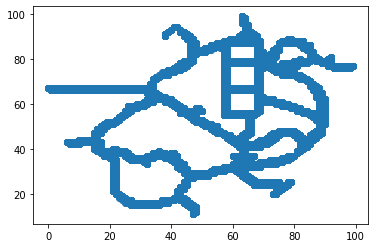

In [297]:
plt.scatter(guestMoveSun_df['X'], guestMoveSun_df['Y'])
plt.show()

In [298]:
guestMoveFri_df.groupby(['Timestamp', 'type']).agg({'id':'count'}).reset_index().rename(columns={'id':'count'})

,Timestamp,type,count
0,2014-06-06 08:00:16,check-in,2
1,2014-06-06 08:00:19,check-in,2
2,2014-06-06 08:00:31,check-in,2
3,2014-06-06 08:00:38,check-in,2
4,2014-06-06 08:00:40,check-in,8
...,...,...,...
82866,2014-06-06 23:26:19,movement,2
82867,2014-06-06 23:26:26,movement,1
82868,2014-06-06 23:26:27,movement,2
82869,2014-06-06 23:26:34,movement,1


In [299]:
guestCountFri=guestMoveFri_df.groupby([pd.Grouper(key='Timestamp', freq='30min'),'type']).agg({'id': 'count'})
guestCountFri = guestCountFri.reset_index()
drop_date = guestCountFri['Timestamp'].apply(lambda x: x.time())
guestCountFri['Timestamp'] = drop_date
guestCountFri['day'] = 'Friday'
guestCountFri_checkin = guestCountFri.loc[guestCountFri['type'] == 'check-in']
guestCountFri_checkin = guestCountFri_checkin.drop(columns='type')
guestCountFri_move = guestCountFri.loc[guestCountFri['type'] == 'movement']
guestCountFri_move = guestCountFri_move.drop(columns='type')
print(guestCountFri_checkin)
print(guestCountFri_move)

   Timestamp    id     day
0   08:00:00  2515  Friday
2   08:30:00  4670  Friday
4   09:00:00  3861  Friday
6   09:30:00  4088  Friday
8   10:00:00  3333  Friday
10  10:30:00  3190  Friday
12  11:00:00  3790  Friday
14  11:30:00  3558  Friday
16  12:00:00  3740  Friday
18  12:30:00  3587  Friday
20  13:00:00  3451  Friday
22  13:30:00  3149  Friday
24  14:00:00  3329  Friday
26  14:30:00  3416  Friday
28  15:00:00  2690  Friday
30  15:30:00  2512  Friday
32  16:00:00  3387  Friday
34  16:30:00  3071  Friday
36  17:00:00  3096  Friday
38  17:30:00  2922  Friday
40  18:00:00  3008  Friday
42  18:30:00  2587  Friday
44  19:00:00  2132  Friday
46  19:30:00  1953  Friday
48  20:00:00  1624  Friday
50  20:30:00  1341  Friday
52  21:00:00  1195  Friday
54  21:30:00   761  Friday
56  22:00:00   421  Friday
58  22:30:00    82  Friday
60  23:00:00     3  Friday
   Timestamp      id     day
1   08:00:00  100387  Friday
3   08:30:00  220661  Friday
5   09:00:00  236465  Friday
7   09:30:00  259478

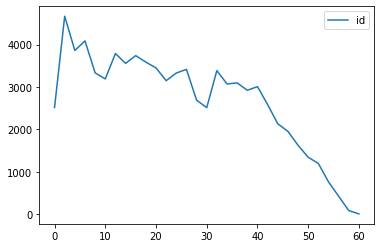

In [300]:
guestCountFri_checkin.plot()

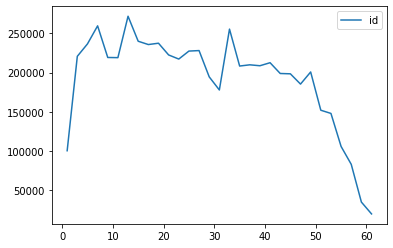

In [301]:
guestCountFri_move.plot()

In [302]:
guestCountSat=guestMoveSat_df.groupby([pd.Grouper(key='Timestamp', freq='30min'),'type']).agg({'id': 'count'})
guestCountSat = guestCountSat.reset_index()
drop_date = guestCountSat['Timestamp'].apply(lambda x: x.time())
guestCountSat['Timestamp'] = drop_date
guestCountSat['day'] = 'Saturday'
guestCountSat_checkin = guestCountSat.loc[guestCountSat['type'] == 'check-in']
guestCountSat_checkin = guestCountSat_checkin.drop(columns='type')
guestCountSat_move = guestCountSat.loc[guestCountSat['type'] == 'movement']
guestCountSat_move = guestCountSat_move.drop(columns='type')
print(guestCountSat_checkin)
print(guestCountSat_move)

   Timestamp    id       day
0   08:00:00  4168  Saturday
2   08:30:00  7475  Saturday
4   09:00:00  6368  Saturday
6   09:30:00  6053  Saturday
8   10:00:00  4376  Saturday
10  10:30:00  4326  Saturday
12  11:00:00  4844  Saturday
14  11:30:00  4620  Saturday
16  12:00:00  4364  Saturday
18  12:30:00  4850  Saturday
20  13:00:00  4737  Saturday
22  13:30:00  4727  Saturday
24  14:00:00  4659  Saturday
26  14:30:00  5028  Saturday
28  15:00:00  3412  Saturday
30  15:30:00  3581  Saturday
32  16:00:00  4836  Saturday
34  16:30:00  4185  Saturday
36  17:00:00  4232  Saturday
38  17:30:00  3916  Saturday
40  18:00:00  3851  Saturday
42  18:30:00  3615  Saturday
44  19:00:00  3174  Saturday
46  19:30:00  2535  Saturday
48  20:00:00  1828  Saturday
50  20:30:00  1833  Saturday
52  21:00:00  1730  Saturday
54  21:30:00  1237  Saturday
56  22:00:00   878  Saturday
58  22:30:00   195  Saturday
60  23:00:00    85  Saturday
   Timestamp      id       day
1   08:00:00  152114  Saturday
3   08:30:

In [303]:
guestCountSun=guestMoveSun_df.groupby([pd.Grouper(key='Timestamp', freq='30min'),'type']).agg({'id': 'count'})
guestCountSun = guestCountSun.reset_index()
drop_date = guestCountSun['Timestamp'].apply(lambda x: x.time())
guestCountSun['Timestamp'] = drop_date
guestCountSun['day'] = 'Sunday'
guestCountSun_checkin = guestCountSun.loc[guestCountSun['type'] == 'check-in']
guestCountSun_checkin = guestCountSun_checkin.drop(columns='type')
guestCountSun_move = guestCountSun.loc[guestCountSun['type'] == 'movement']
guestCountSun_move = guestCountSun_move.drop(columns='type')
print(guestCountSun_checkin)
guestCountSun_move

   Timestamp    id     day
0   08:00:00  5374  Sunday
2   08:30:00  8736  Sunday
4   09:00:00  7079  Sunday
6   09:30:00  6677  Sunday
8   10:00:00  4875  Sunday
10  10:30:00  4703  Sunday
12  11:00:00  5911  Sunday
14  11:30:00  5747  Sunday
16  12:00:00  5503  Sunday
18  12:30:00  5473  Sunday
20  13:00:00  5308  Sunday
22  13:30:00  5285  Sunday
24  14:00:00  5149  Sunday
26  14:30:00  5005  Sunday
28  15:00:00  4740  Sunday
30  15:30:00  4989  Sunday
32  16:00:00  4716  Sunday
34  16:30:00  4409  Sunday
36  17:00:00  4479  Sunday
38  17:30:00  4081  Sunday
40  18:00:00  3878  Sunday
42  18:30:00  3520  Sunday
44  19:00:00  3194  Sunday
46  19:30:00  2685  Sunday
48  20:00:00  2176  Sunday
50  20:30:00  1854  Sunday
52  21:00:00  1808  Sunday
54  21:30:00  1730  Sunday
56  22:00:00  1221  Sunday
58  22:30:00   350  Sunday
60  23:00:00     3  Sunday


,Timestamp,id,day
1,08:00:00,199343,Sunday
3,08:30:00,398214,Sunday
5,09:00:00,450282,Sunday
7,09:30:00,447057,Sunday
9,10:00:00,378551,Sunday
11,10:30:00,372143,Sunday
13,11:00:00,499528,Sunday
15,11:30:00,427389,Sunday
17,12:00:00,456885,Sunday
19,12:30:00,421640,Sunday


**Are there notable differences in the patterns of activity on in the park across the three days? Please describe the notable differences you found**

Yes, there is a difference between Sunday and the other two days. It has the most people of the three days in the park. The morning starts off almost exactly same as all the other days. However, once the crime was discovered check-ins flattened out and became even with Saturday. When it comes to the people moving around the park the only big differences are a large spike in movement when the afternoon show was cancelled. After that it was pretty similar just bigger.

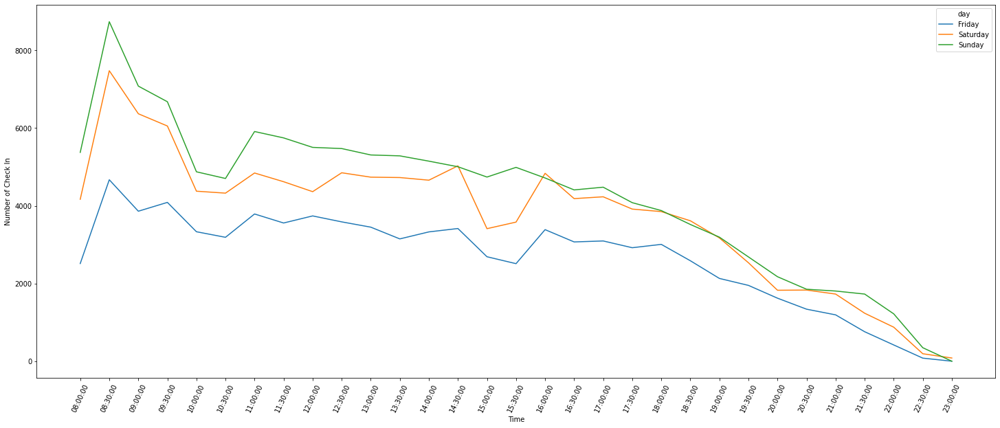

In [304]:
guestCountWeekend_checkin = pd.concat([guestCountFri_checkin, guestCountSat_checkin, guestCountSun_checkin])
#guestCountWeekend_checkin
guestCountWeekend_checkin['Timestamp'] = guestCountWeekend_checkin['Timestamp'].astype('str')
plt.figure(figsize=(25,10))
plt.xticks(rotation=65)
sns.lineplot(x='Timestamp', y='id', hue='day', data=guestCountWeekend_checkin).set(xlabel='Time', ylabel = 'Number of Check In')
plt.show()

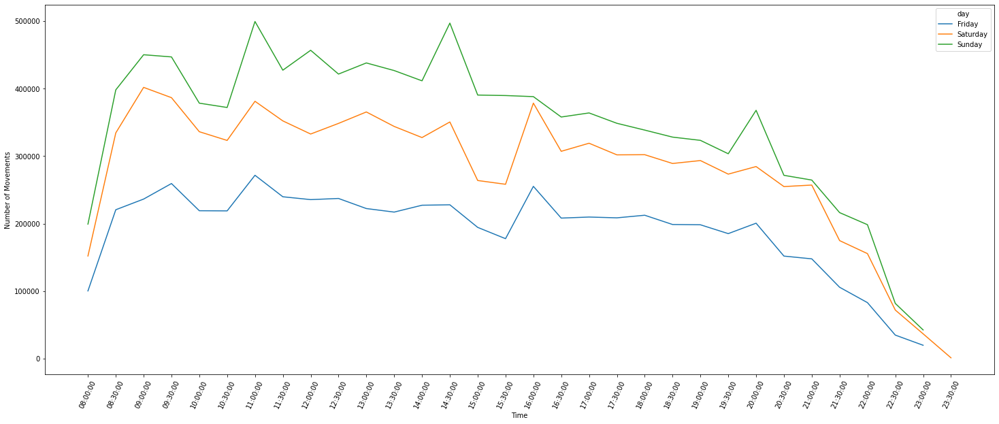

In [305]:
guestCountWeekend_move = pd.concat([guestCountFri_move, guestCountSat_move, guestCountSun_move])
#guestCountWeekend_move
guestCountWeekend_move['Timestamp'] = guestCountWeekend_move['Timestamp'].astype('str')
plt.figure(figsize=(25,10))
plt.xticks(rotation=65)
sns.lineplot(x='Timestamp', y='id', hue='day', data=guestCountWeekend_move).set(xlabel='Time', ylabel = 'Number of Movements')
plt.show()

In [306]:
totalguestMoveFri=guestMoveFri_df['id'].unique()
np.size(totalguestMoveFri)

3557

In [307]:
totalguestMoveFri=guestMoveFri_df.loc[guestMoveFri_df['Timestamp'] > '2014-6-06 9:00:00'][guestMoveFri_df['Timestamp'] <= '2014-6-06 10:30:00']['id'].unique()
print(np.size(totalguestMoveFri))
totalguestMoveFri=guestMoveFri_df.loc[guestMoveFri_df['Timestamp'] > '2014-6-06 14:00:00'][guestMoveFri_df['Timestamp'] <= '2014-6-06 15:30:00']['id'].unique()
print(np.size(totalguestMoveFri))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


3456
3437


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


In [308]:
amFriCheckinShow = guestMoveFri_df.loc[guestMoveFri_df['Timestamp'] > '2014-6-06 9:00:00'][guestMoveFri_df['Timestamp'] <= '2014-6-06 10:30:00'][guestMoveFri_df['type'] == 'check-in'][guestMoveFri_df['X'] == 76][guestMoveFri_df['Y'] == 22]['id']
print(amFriCheckinShow.count())
pmFriCheckinShow = guestMoveFri_df.loc[guestMoveFri_df['Timestamp'] > '2014-6-06 14:00:00'][guestMoveFri_df['Timestamp'] <= '2014-6-06 15:30:00'][guestMoveFri_df['type'] == 'check-in'][guestMoveFri_df['X'] == 76][guestMoveFri_df['Y'] == 22]['id']
print(pmFriCheckinShow.count())

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


514
662


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


In [309]:
totalguestMoveSat=guestMoveSat_df['id'].unique()
np.size(totalguestMoveSat)

6411

In [310]:
totalguestMoveSat=guestMoveSat_df.loc[guestMoveSat_df['Timestamp'] > '2014-6-07 9:00:00'][guestMoveSat_df['Timestamp'] <= '2014-6-07 10:30:00']['id'].unique()
print(np.size(totalguestMoveSat))
totalguestMoveSat=guestMoveSat_df.loc[guestMoveSat_df['Timestamp'] > '2014-6-07 14:00:00'][guestMoveSat_df['Timestamp'] <= '2014-6-07 15:30:00']['id'].unique()
print(np.size(totalguestMoveSat))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


6244


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


6160


In [311]:
amSatCheckinShow = guestMoveSat_df.loc[guestMoveSat_df['Timestamp'] > '2014-6-07 9:00:00'][guestMoveSat_df['Timestamp'] <= '2014-6-07 10:30:00'][guestMoveSat_df['type'] == 'check-in'][guestMoveSat_df['X'] == 76][guestMoveSat_df['Y'] == 22]['id']
print(amSatCheckinShow.count())
pmSatCheckinShow = guestMoveSat_df.loc[guestMoveSat_df['Timestamp'] > '2014-6-07 14:00:00'][guestMoveSat_df['Timestamp'] <= '2014-6-07 15:30:00'][guestMoveSat_df['type'] == 'check-in'][guestMoveSat_df['X'] == 76][guestMoveSat_df['Y'] == 22]['id']
print(pmSatCheckinShow.count())

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


764


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


1254


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


In [312]:
totalguestMoveSun=guestMoveSun_df['id'].unique()
np.size(totalguestMoveSun)

7569

In [313]:
totalguestMoveSun=guestMoveSun_df.loc[guestMoveSun_df['Timestamp'] > '2014-6-08 9:00:00'][guestMoveSun_df['Timestamp'] <= '2014-6-08 10:30:00']['id'].unique()
print(np.size(totalguestMoveSun))
totalguestMoveSun=guestMoveSun_df.loc[guestMoveSun_df['Timestamp'] > '2014-6-08 14:00:00'][guestMoveSun_df['Timestamp'] <= '2014-6-08 15:30:00']['id'].unique()
print(np.size(totalguestMoveSun))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


7461


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


7252


In [314]:
amSunCheckinShow = guestMoveSun_df.loc[guestMoveSun_df['Timestamp'] > '2014-6-08 9:00:00'][guestMoveSun_df['Timestamp'] <= '2014-6-08 10:30:00'][guestMoveSun_df['type'] == 'check-in'][guestMoveSun_df['X'] == 76][guestMoveSun_df['Y'] == 22]['id']
print(amSunCheckinShow.count())
pmSunCheckinShow = guestMoveSun_df.loc[guestMoveSun_df['Timestamp'] > '2014-6-08 14:00:00'][guestMoveSun_df['Timestamp'] <= '2014-6-08 15:30:00'][guestMoveSun_df['type'] == 'check-in'][guestMoveSun_df['X'] == 76][guestMoveSun_df['Y'] == 22]['id']
print(pmSunCheckinShow.count())

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


982


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


0


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


In [315]:
guestMoveWeekend_df = pd.concat([guestMoveFri_df, guestMoveSat_df, guestMoveSun_df]).reset_index(drop=True)
guestMoveWeekend_df

,Timestamp,id,type,X,Y
0,2014-06-06 08:00:16,1591741,check-in,63,99
1,2014-06-06 08:00:16,825652,check-in,63,99
2,2014-06-06 08:00:19,179386,check-in,63,99
3,2014-06-06 08:00:19,531348,check-in,63,99
4,2014-06-06 08:00:31,1483004,check-in,0,67
...,...,...,...,...,...
26021956,2014-06-08 23:25:13,71913,movement,63,99
26021957,2014-06-08 23:25:13,785325,movement,63,99
26021958,2014-06-08 23:25:13,791077,movement,63,99
26021959,2014-06-08 23:25:13,874286,movement,63,99


In [316]:
attractionLocation_df = guestMoveWeekend_df.loc[guestMoveWeekend_df['type'] == 'check-in']
attractionLocation_df = attractionLocation_df[['X', 'Y']]
attractionLocation_df = attractionLocation_df.drop_duplicates().reset_index(drop=True)
attractionLocation_df

,X,Y
0,63,99
1,0,67
2,99,77
3,73,84
4,76,88
5,17,43
6,6,43
7,38,90
8,73,79
9,27,15


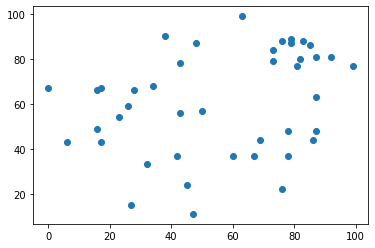

In [317]:
plt.scatter(attractionLocation_df['X'], attractionLocation_df['Y'])
plt.show()

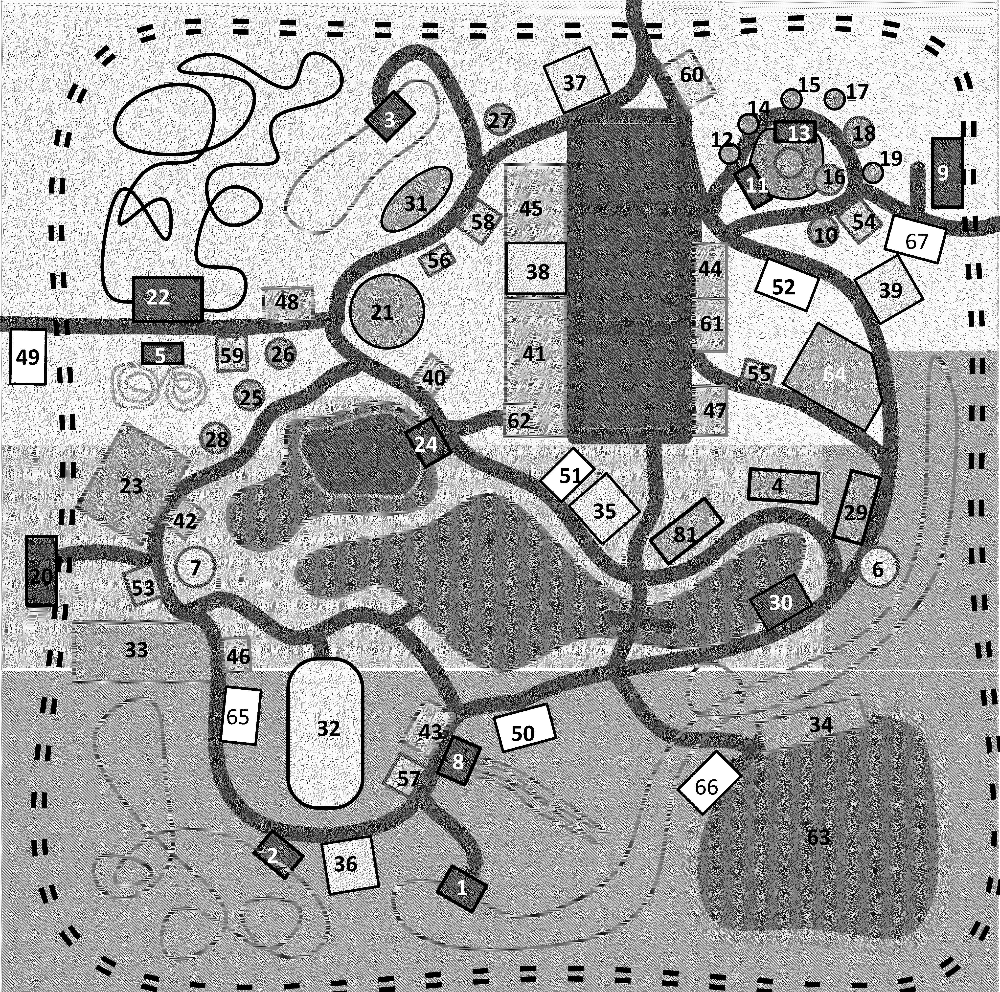

In [318]:
from PIL import Image 
image_file = Image.open('/content/dataroot/task1/Park Map.jpg') # open colour image
image_file = image_file.convert('1') # convert image to black and white
image_file.save('/content/dataroot/task1/parkMapBW.jpg')
image_file

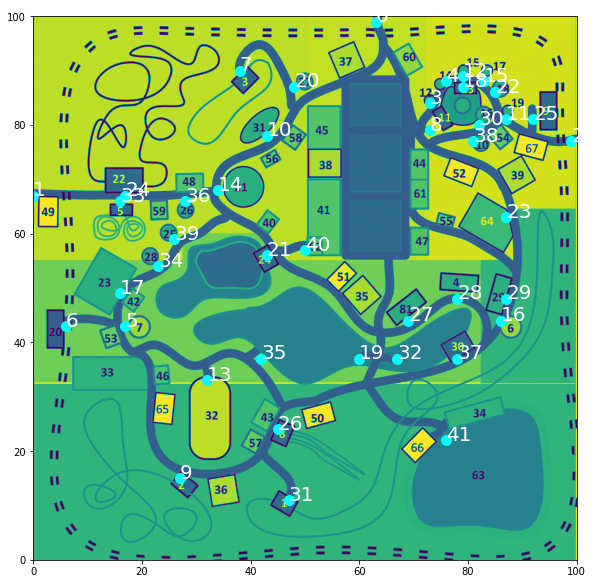

In [319]:
# img = plt.imread('/content/dataroot/task1/Park Map.jpg')
# fig, ax = plt.subplots()
# ax.imshow(img)
plt.figure(figsize=(10,10))
im = plt.imread('/content/dataroot/task1/parkMapBW.jpg')
implot = plt.imshow(im, extent=[0, 100, 0, 100])
plt.scatter(attractionLocation_df['X'], attractionLocation_df['Y'], color='cyan', s=100)
for i in range(len(attractionLocation_df)):
  plt.text(attractionLocation_df['X'][i], attractionLocation_df['Y'][i], i, fontsize=20, color='white')
plt.show()

In [320]:
d = {'Ride_ID': [0, 82, 83, 12, 14, 7, 20, 3, 11, 2, 31, 19, 15, 32, 21, 17, 6, 
                 23, 13, 84, 27, 24, 18, 64, 22, 9, 8, 81, 4, 29, 16, 1, 85, 5,
                 28, 86, 26, 30, 10, 25, 62, 63], 
     'Name': ['Entry Corridor North', 'Entry Corridor West', 'Entry Corridor East',
              'Flying TyrAndrienkos', 'Beelzebufo', 'Firefall', 'Scholtz Express',
              'Auvilotops Express','Sauroma Bumpers', 'Galactosaurus Rage',
              'Raptor Race', 'Stone Cups', 'Enchanted Toadstools', 'Creighton Pavilion',
              'Paleocarrie Carosel', 'Blue Iguanodon', 'Keimosaurus Big Spin', 
              'Rhynasaurus Rampage', 'Cyndinsaurus Asteriod', 'Wet Land Entry 2',
              'Squidosaur',"Kaul's Lost Canyon Escape", 'Wild Jungle Cruise', 
              'SabreTooth Theatre', 'Jurassic Road', 'North Line', 'Atmofear',
              'Flight of the Swingodon', 'TerrorSaur', 'Dykesadactyl Trill',
              'Stegocycles', 'Wrightiraptor Mountain', 'Wet Land Entry 3', 
              'Wendisaurus Chase', 'Eberlesaurus Roundup', 'Wet Land Entry 1',
              'Kristaodon Kaper', 'Ichthyoroberts Rapids', 'Jeredactyl Jump',
              'Maiasaur Madness', 'Liggement Fix-Me-Up', 'Grinosaurus Stage'],
     'Type': ['Door', 'Door', 'Door', 'Kiddie', 'Kiddie', 'Trill', 'Everyone',
              'Trill', 'Kiddie', 'Trill', 'Everyone', 'Kiddie', 'Kiddie', 'Show',
              'Everyone', 'Kiddie', 'Trill', 'Everyone', 'Kiddie', 'Gate', 'Everyone',
              'Everyone', 'Kiddie', 'Show', 'Everyone', 'Kiddie', 'Trill', 'Trill',
              'Trill', 'Everyone', 'Kiddie', 'Trill', 'Gate', 'Trill', 'Everyone',
              'Gate', 'Everyone', 'Everyone', 'Kiddie', 'Everyone', 'Assistance',
              'Show'],}
attraction_df = pd.DataFrame(data=d)
attraction_df

,Ride_ID,Name,Type
0,0,Entry Corridor North,Door
1,82,Entry Corridor West,Door
2,83,Entry Corridor East,Door
3,12,Flying TyrAndrienkos,Kiddie
4,14,Beelzebufo,Kiddie
5,7,Firefall,Trill
6,20,Scholtz Express,Everyone
7,3,Auvilotops Express,Trill
8,11,Sauroma Bumpers,Kiddie
9,2,Galactosaurus Rage,Trill


In [321]:
attraction_df[['X','Y']]=attractionLocation_df[['X', 'Y']]
attraction_df

,Ride_ID,Name,Type,X,Y
0,0,Entry Corridor North,Door,63,99
1,82,Entry Corridor West,Door,0,67
2,83,Entry Corridor East,Door,99,77
3,12,Flying TyrAndrienkos,Kiddie,73,84
4,14,Beelzebufo,Kiddie,76,88
5,7,Firefall,Trill,17,43
6,20,Scholtz Express,Everyone,6,43
7,3,Auvilotops Express,Trill,38,90
8,11,Sauroma Bumpers,Kiddie,73,79
9,2,Galactosaurus Rage,Trill,27,15


In [322]:
guestMoveFri_df.loc[guestMoveFri_df['id'] == 1709971]#[guestMoveFri_df['type'] == 'check-in']

,Timestamp,id,type,X,Y
121,2014-06-06 08:01:30,1709971,check-in,0,67
493,2014-06-06 08:02:20,1709971,movement,1,66
620,2014-06-06 08:02:32,1709971,movement,2,66
723,2014-06-06 08:02:44,1709971,movement,3,66
846,2014-06-06 08:02:56,1709971,movement,4,67
...,...,...,...,...,...
5758613,2014-06-06 21:28:26,1709971,movement,4,67
5759587,2014-06-06 21:28:38,1709971,movement,3,67
5760578,2014-06-06 21:28:50,1709971,movement,2,66
5761556,2014-06-06 21:29:02,1709971,movement,1,66


In [323]:
# Checking to see if ids were their everyday
# resultDict = {}
# for i in guestMoveSun_df['id']:
#   if i in guestMoveFri_df['id'].values and i in guestMoveSat_df['id'].values:
#     resultDict[i] = True
# resultDict

In [324]:
bucketFri=guestMoveFri_df.groupby([pd.Grouper(key='Timestamp', freq='5min'),'id']).agg({'X': 'mean', 'Y': 'mean'}).reset_index()
test1 = bucketFri[bucketFri['Timestamp']=='2014-06-06 12:00:00']
test1

,Timestamp,id,X,Y
76047,2014-06-06 12:00:00,941,65.477273,46.681818
76048,2014-06-06 12:00:00,4343,80.000000,73.000000
76049,2014-06-06 12:00:00,4908,39.160000,71.320000
76050,2014-06-06 12:00:00,6110,59.107143,34.428571
76051,2014-06-06 12:00:00,6534,58.964286,34.500000
...,...,...,...,...
77813,2014-06-06 12:00:00,2091832,39.379310,67.965517
77814,2014-06-06 12:00:00,2093891,74.500000,46.666667
77815,2014-06-06 12:00:00,2095284,54.466667,83.700000
77816,2014-06-06 12:00:00,2095583,29.687500,53.416667


In [325]:
kmeans = KMeans(init = 'k-means++', random_state = 52637)
test_kmeans = kmeans.fit_predict(test1[['X','Y']])
test_kmeans

array([1, 2, 7, ..., 7, 3, 2], dtype=int32)

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-package

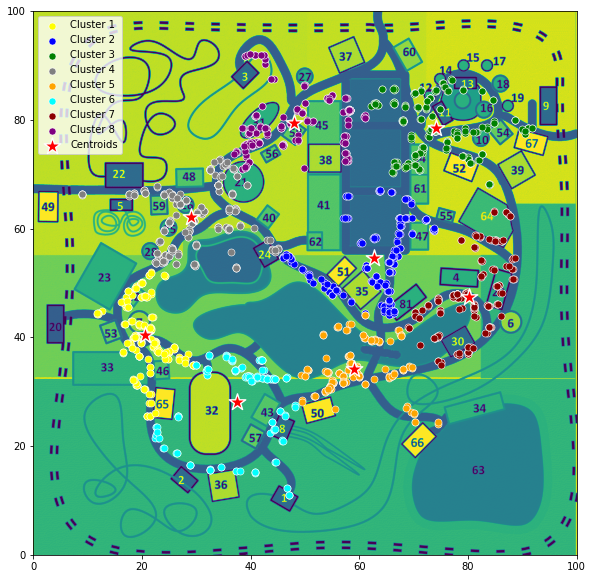

In [326]:
test = np.array(test1[['X','Y']])
plt.figure(figsize=(10,10))
implot = plt.imshow(im, extent=[0, 100, 0, 100])
sns.scatterplot(test[test_kmeans == 0, 0], test[test_kmeans == 0, 1], color = 'yellow', label = 'Cluster 1',s=50)
sns.scatterplot(test[test_kmeans == 1, 0], test[test_kmeans == 1, 1], color = 'blue', label = 'Cluster 2',s=50)
sns.scatterplot(test[test_kmeans == 2, 0], test[test_kmeans == 2, 1], color = 'green', label = 'Cluster 3',s=50)
sns.scatterplot(test[test_kmeans == 3, 0], test[test_kmeans == 3, 1], color = 'grey', label = 'Cluster 4',s=50)
sns.scatterplot(test[test_kmeans == 4, 0], test[test_kmeans == 4, 1], color = 'orange', label = 'Cluster 5',s=50)
sns.scatterplot(test[test_kmeans == 5, 0], test[test_kmeans == 5, 1], color = 'cyan', label = 'Cluster 6',s=50)
sns.scatterplot(test[test_kmeans == 6, 0], test[test_kmeans == 6, 1], color = 'darkred', label = 'Cluster 7',s=50)
sns.scatterplot(test[test_kmeans == 7, 0], test[test_kmeans == 7, 1], color = 'purple', label = 'Cluster 8',s=50)
sns.scatterplot(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], color = 'red', label = 'Centroids',s=300,marker='*')
plt.legend()
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-package

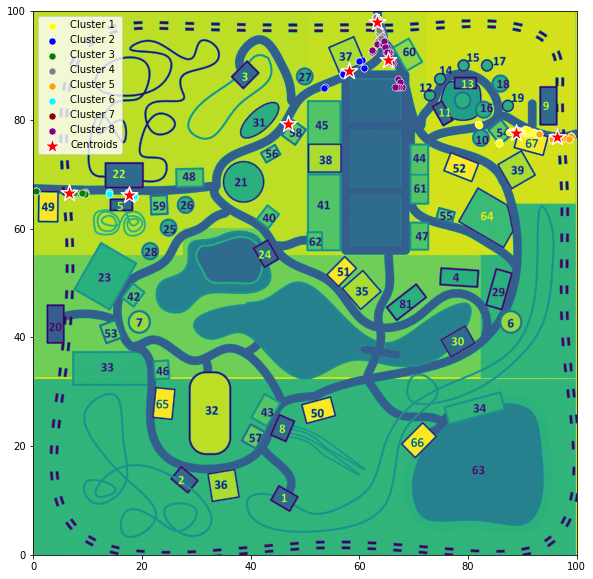

In [327]:
bucketFri=guestMoveFri_df.groupby([pd.Grouper(key='Timestamp', freq='5min'),'id']).agg({'X': 'mean', 'Y': 'mean'}).reset_index()
test1 = bucketFri[bucketFri['Timestamp']=='2014-06-06 08:00:00']
kmeans = KMeans(init = 'k-means++', random_state = 52637)
test_kmeans = kmeans.fit_predict(test1[['X','Y']])
test_kmeans
test = np.array(test1[['X','Y']])
plt.figure(figsize=(10,10))
implot = plt.imshow(im, extent=[0, 100, 0, 100])
sns.scatterplot(test[test_kmeans == 0, 0], test[test_kmeans == 0, 1], color = 'yellow', label = 'Cluster 1',s=50)
sns.scatterplot(test[test_kmeans == 1, 0], test[test_kmeans == 1, 1], color = 'blue', label = 'Cluster 2',s=50)
sns.scatterplot(test[test_kmeans == 2, 0], test[test_kmeans == 2, 1], color = 'green', label = 'Cluster 3',s=50)
sns.scatterplot(test[test_kmeans == 3, 0], test[test_kmeans == 3, 1], color = 'grey', label = 'Cluster 4',s=50)
sns.scatterplot(test[test_kmeans == 4, 0], test[test_kmeans == 4, 1], color = 'orange', label = 'Cluster 5',s=50)
sns.scatterplot(test[test_kmeans == 5, 0], test[test_kmeans == 5, 1], color = 'cyan', label = 'Cluster 6',s=50)
sns.scatterplot(test[test_kmeans == 6, 0], test[test_kmeans == 6, 1], color = 'darkred', label = 'Cluster 7',s=50)
sns.scatterplot(test[test_kmeans == 7, 0], test[test_kmeans == 7, 1], color = 'purple', label = 'Cluster 8',s=50)
sns.scatterplot(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], color = 'red', label = 'Centroids',s=300,marker='*')
plt.legend()
plt.show()

In [328]:
bucketFri=guestMoveFri_df.groupby([pd.Grouper(key='Timestamp', freq='5min'),'id']).agg({'X': 'mean', 'Y': 'mean'}).reset_index()
test2 = bucketFri[bucketFri['Timestamp']=='2014-06-06 08:00:00']
test2

,Timestamp,id,X,Y
0,2014-06-06 08:00:00,10371,63.181818,94.000000
1,2014-06-06 08:00:00,11269,63.333333,98.000000
2,2014-06-06 08:00:00,11311,60.050000,90.800000
3,2014-06-06 08:00:00,15712,63.500000,98.500000
4,2014-06-06 08:00:00,41879,64.272727,94.000000
...,...,...,...,...
168,2014-06-06 08:00:00,2007598,18.589744,66.025641
169,2014-06-06 08:00:00,2050303,63.000000,99.000000
170,2014-06-06 08:00:00,2061906,9.000000,66.578947
171,2014-06-06 08:00:00,2065364,63.000000,99.000000


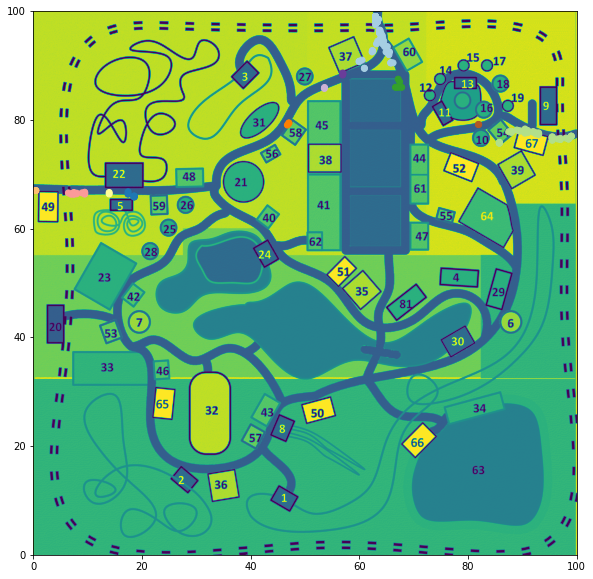

In [329]:
bucketFri=guestMoveFri_df.groupby([pd.Grouper(key='Timestamp', freq='5min'),'id']).agg({'X': 'mean', 'Y': 'mean'}).reset_index()
test2 = bucketFri[bucketFri['Timestamp']=='2014-06-06 08:00:00']
dbscan_test = DBSCAN(eps=3, min_samples=2).fit(test2[['X','Y']])
dbscan_test.labels_
test = np.array(test2[['X','Y']])
y_pred = dbscan_test.fit_predict(test2[['X','Y']])
plt.figure(figsize=(10,10))
implot = plt.imshow(im, extent=[0, 100, 0, 100])
plt.scatter(test[:,0], test[:,1],c=y_pred, cmap='Paired')

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-package

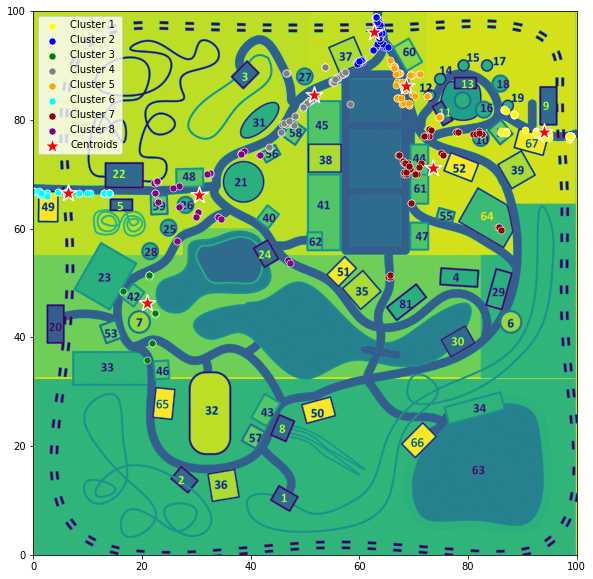

In [330]:
bucketFri=guestMoveFri_df.groupby([pd.Grouper(key='Timestamp', freq='5min'),'id']).agg({'X': 'mean', 'Y': 'mean'}).reset_index()
test1 = bucketFri[bucketFri['Timestamp']=='2014-06-06 08:05:00']
kmeans = KMeans(init = 'k-means++', random_state = 52637)
test_kmeans = kmeans.fit_predict(test1[['X','Y']])
test_kmeans
test = np.array(test1[['X','Y']])
plt.figure(figsize=(10,10))
implot = plt.imshow(im, extent=[0, 100, 0, 100])
sns.scatterplot(test[test_kmeans == 0, 0], test[test_kmeans == 0, 1], color = 'yellow', label = 'Cluster 1',s=50)
sns.scatterplot(test[test_kmeans == 1, 0], test[test_kmeans == 1, 1], color = 'blue', label = 'Cluster 2',s=50)
sns.scatterplot(test[test_kmeans == 2, 0], test[test_kmeans == 2, 1], color = 'green', label = 'Cluster 3',s=50)
sns.scatterplot(test[test_kmeans == 3, 0], test[test_kmeans == 3, 1], color = 'grey', label = 'Cluster 4',s=50)
sns.scatterplot(test[test_kmeans == 4, 0], test[test_kmeans == 4, 1], color = 'orange', label = 'Cluster 5',s=50)
sns.scatterplot(test[test_kmeans == 5, 0], test[test_kmeans == 5, 1], color = 'cyan', label = 'Cluster 6',s=50)
sns.scatterplot(test[test_kmeans == 6, 0], test[test_kmeans == 6, 1], color = 'darkred', label = 'Cluster 7',s=50)
sns.scatterplot(test[test_kmeans == 7, 0], test[test_kmeans == 7, 1], color = 'purple', label = 'Cluster 8',s=50)
sns.scatterplot(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], color = 'red', label = 'Centroids',s=300,marker='*')
plt.legend()
plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-package

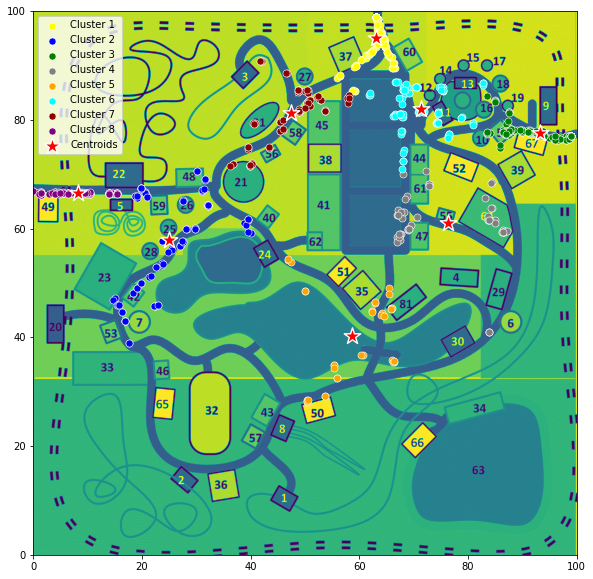

In [331]:
bucketFri=guestMoveFri_df.groupby([pd.Grouper(key='Timestamp', freq='5min'),'id']).agg({'X': 'mean', 'Y': 'mean'}).reset_index()
test1 = bucketFri[bucketFri['Timestamp']=='2014-06-06 08:10:00']
kmeans = KMeans(init = 'k-means++', random_state = 52637)
test_kmeans = kmeans.fit_predict(test1[['X','Y']])
test_kmeans
test = np.array(test1[['X','Y']])
plt.figure(figsize=(10,10))
implot = plt.imshow(im, extent=[0, 100, 0, 100])
sns.scatterplot(test[test_kmeans == 0, 0], test[test_kmeans == 0, 1], color = 'yellow', label = 'Cluster 1',s=50)
sns.scatterplot(test[test_kmeans == 1, 0], test[test_kmeans == 1, 1], color = 'blue', label = 'Cluster 2',s=50)
sns.scatterplot(test[test_kmeans == 2, 0], test[test_kmeans == 2, 1], color = 'green', label = 'Cluster 3',s=50)
sns.scatterplot(test[test_kmeans == 3, 0], test[test_kmeans == 3, 1], color = 'grey', label = 'Cluster 4',s=50)
sns.scatterplot(test[test_kmeans == 4, 0], test[test_kmeans == 4, 1], color = 'orange', label = 'Cluster 5',s=50)
sns.scatterplot(test[test_kmeans == 5, 0], test[test_kmeans == 5, 1], color = 'cyan', label = 'Cluster 6',s=50)
sns.scatterplot(test[test_kmeans == 6, 0], test[test_kmeans == 6, 1], color = 'darkred', label = 'Cluster 7',s=50)
sns.scatterplot(test[test_kmeans == 7, 0], test[test_kmeans == 7, 1], color = 'purple', label = 'Cluster 8',s=50)
sns.scatterplot(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], color = 'red', label = 'Centroids',s=300,marker='*')
plt.legend()
plt.show()

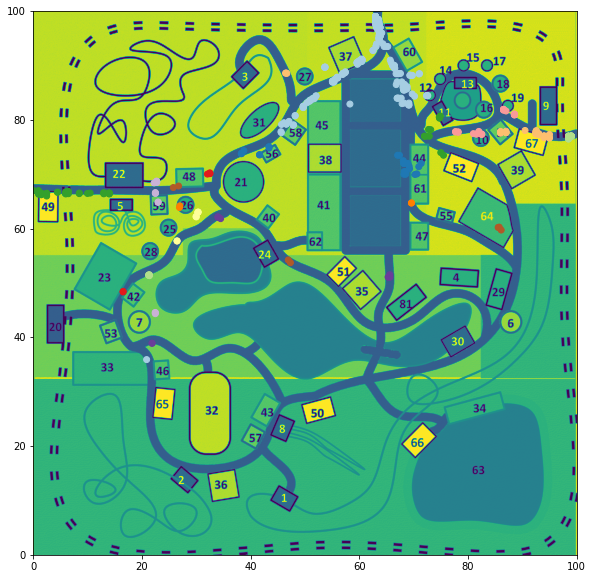

In [332]:
bucketFri=guestMoveFri_df.groupby([pd.Grouper(key='Timestamp', freq='5min'),'id']).agg({'X': 'mean', 'Y': 'mean'}).reset_index()
test2 = bucketFri[bucketFri['Timestamp']=='2014-06-06 08:05:00']
bscan_test = DBSCAN(eps=3, min_samples=2).fit(test2[['X','Y']])
dbscan_test.labels_
test = np.array(test2[['X','Y']])
y_pred = dbscan_test.fit_predict(test2[['X','Y']])
plt.figure(figsize=(10,10))
implot = plt.imshow(im, extent=[0, 100, 0, 100])
plt.scatter(test[:,0], test[:,1],c=y_pred, cmap='Paired')

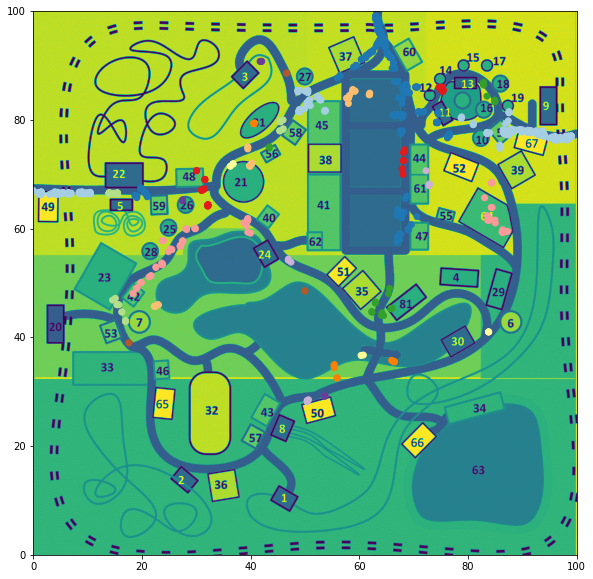

In [333]:
bucketFri=guestMoveFri_df.groupby([pd.Grouper(key='Timestamp', freq='5min'),'id']).agg({'X': 'mean', 'Y': 'mean'}).reset_index()
test2 = bucketFri[bucketFri['Timestamp']=='2014-06-06 08:10:00']
dbscan_test = DBSCAN(eps=3, min_samples=2).fit(test2[['X','Y']])
dbscan_test.labels_
test = np.array(test2[['X','Y']])
y_pred = dbscan_test.fit_predict(test2[['X','Y']])
plt.figure(figsize=(10,10))
implot = plt.imshow(im, extent=[0, 100, 0, 100])
plt.scatter(test[:,0], test[:,1],c=y_pred, cmap='Paired')

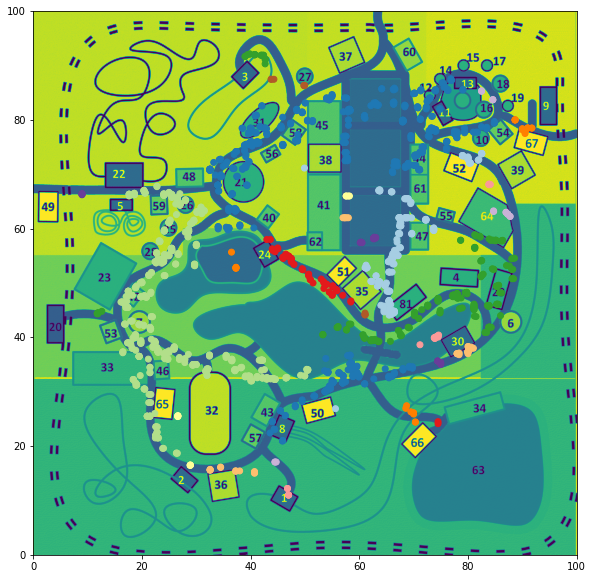

In [334]:
bucketFri=guestMoveFri_df.groupby([pd.Grouper(key='Timestamp', freq='5min'),'id']).agg({'X': 'mean', 'Y': 'mean'}).reset_index()
test2 = bucketFri[bucketFri['Timestamp']=='2014-06-06 12:00:00']
dbscan_test = DBSCAN(eps=3, min_samples=2).fit(test2[['X','Y']])
dbscan_test.labels_
test = np.array(test2[['X','Y']])
y_pred = dbscan_test.fit_predict(test2[['X','Y']])
plt.figure(figsize=(10,10))
implot = plt.imshow(im, extent=[0, 100, 0, 100])
plt.scatter(test[:,0], test[:,1],c=y_pred, cmap='Paired')

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-package

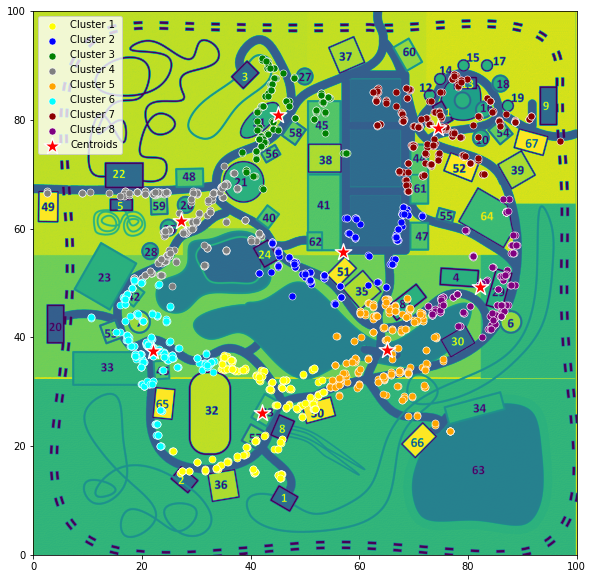

In [335]:
bucketFri=guestMoveFri_df.groupby([pd.Grouper(key='Timestamp', freq='5min'),'id']).agg({'X': 'mean', 'Y': 'mean'}).reset_index()
test1 = bucketFri[bucketFri['Timestamp']=='2014-06-06 9:30:00']
kmeans = KMeans(init = 'k-means++', random_state = 52637)
test_kmeans = kmeans.fit_predict(test1[['X','Y']])
test = np.array(test1[['X','Y']])
plt.figure(figsize=(10,10))
implot = plt.imshow(im, extent=[0, 100, 0, 100])
sns.scatterplot(test[test_kmeans == 0, 0], test[test_kmeans == 0, 1], color = 'yellow', label = 'Cluster 1',s=50)
sns.scatterplot(test[test_kmeans == 1, 0], test[test_kmeans == 1, 1], color = 'blue', label = 'Cluster 2',s=50)
sns.scatterplot(test[test_kmeans == 2, 0], test[test_kmeans == 2, 1], color = 'green', label = 'Cluster 3',s=50)
sns.scatterplot(test[test_kmeans == 3, 0], test[test_kmeans == 3, 1], color = 'grey', label = 'Cluster 4',s=50)
sns.scatterplot(test[test_kmeans == 4, 0], test[test_kmeans == 4, 1], color = 'orange', label = 'Cluster 5',s=50)
sns.scatterplot(test[test_kmeans == 5, 0], test[test_kmeans == 5, 1], color = 'cyan', label = 'Cluster 6',s=50)
sns.scatterplot(test[test_kmeans == 6, 0], test[test_kmeans == 6, 1], color = 'darkred', label = 'Cluster 7',s=50)
sns.scatterplot(test[test_kmeans == 7, 0], test[test_kmeans == 7, 1], color = 'purple', label = 'Cluster 8',s=50)
sns.scatterplot(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], color = 'red', label = 'Centroids',s=300,marker='*')
plt.legend()
plt.show()

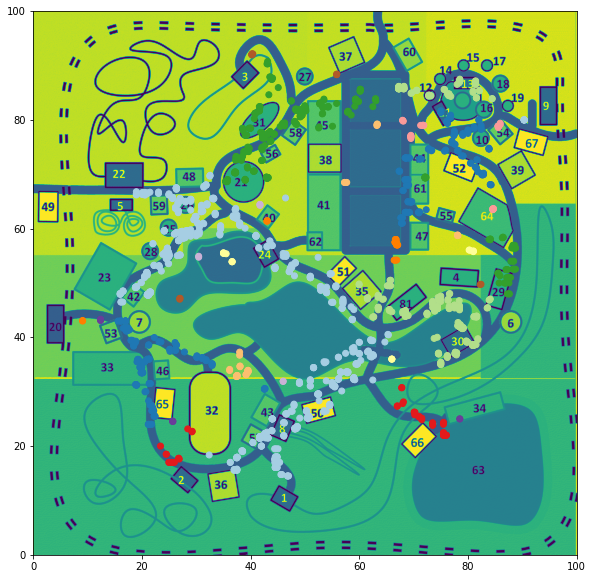

In [336]:
bucketFri=guestMoveFri_df.groupby([pd.Grouper(key='Timestamp', freq='5min'),'id']).agg({'X': 'mean', 'Y': 'mean'}).reset_index()
test2 = bucketFri[bucketFri['Timestamp']=='2014-06-06 10:00:00']
dbscan_test = DBSCAN(eps=3, min_samples=2).fit(test2[['X','Y']])
dbscan_test.labels_
test = np.array(test2[['X','Y']])
y_pred = dbscan_test.fit_predict(test2[['X','Y']])
plt.figure(figsize=(10,10))
implot = plt.imshow(im, extent=[0, 100, 0, 100])
plt.scatter(test[:,0], test[:,1],c=y_pred, cmap='Paired')

In [337]:
bucketFri=guestMoveFri_df.groupby([pd.Grouper(key='Timestamp', freq='5min'),'id']).agg({'X': 'mean', 'Y': 'mean'}).reset_index()
bucketSat=guestMoveSat_df.groupby([pd.Grouper(key='Timestamp', freq='5min'),'id']).agg({'X': 'mean', 'Y': 'mean'}).reset_index()
bucketSun=guestMoveSun_df.groupby([pd.Grouper(key='Timestamp', freq='5min'),'id']).agg({'X': 'mean', 'Y': 'mean'}).reset_index()

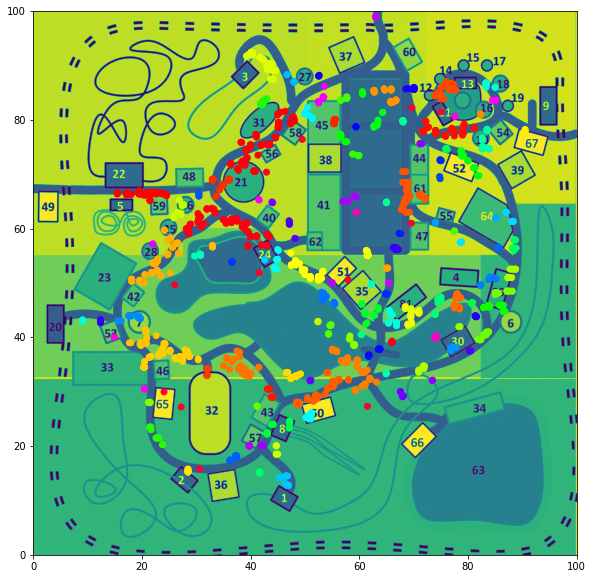

In [338]:
crowd = bucketFri[bucketFri['Timestamp']=='2014-06-06 14:00:00']
dbscan_test = DBSCAN(eps=2, min_samples=2).fit(crowd[['X','Y']])
dbscan_test.labels_
latlong = np.array(crowd[['X','Y']])
y_pred = dbscan_test.fit_predict(crowd[['X','Y']])
plt.figure(figsize=(10,10))
implot = plt.imshow(im, extent=[0, 100, 0, 100])
plt.scatter(latlong[:,0], latlong[:,1],c=y_pred, cmap='gist_rainbow')

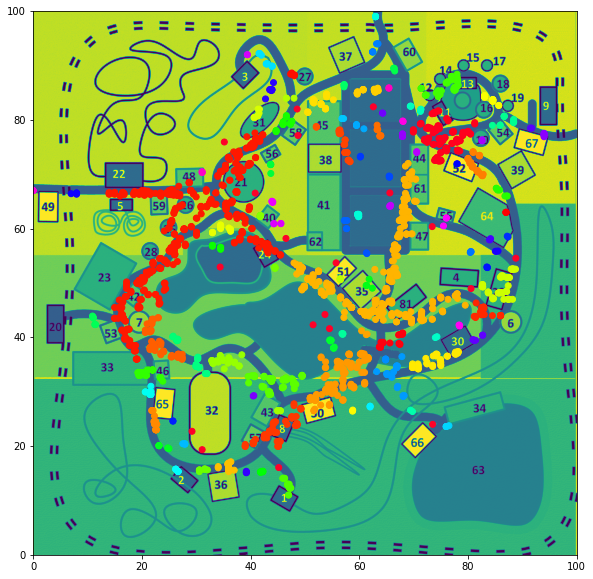

In [339]:
crowd = bucketSat[bucketSat['Timestamp']=='2014-06-07 14:00:00']
dbscan_test = DBSCAN(eps=2, min_samples=2).fit(crowd[['X','Y']])
dbscan_test.labels_
latlong = np.array(crowd[['X','Y']])
y_pred = dbscan_test.fit_predict(crowd[['X','Y']])
plt.figure(figsize=(10,10))
implot = plt.imshow(im, extent=[0, 100, 0, 100])
plt.scatter(latlong[:,0], latlong[:,1],c=y_pred, cmap='gist_rainbow')

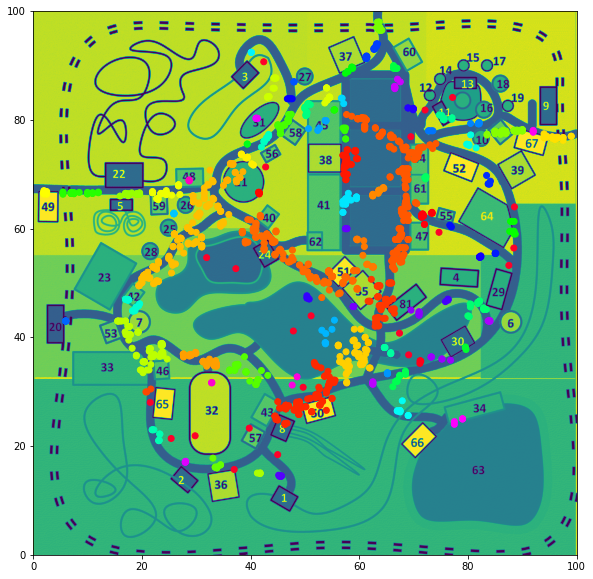

In [340]:
crowd = bucketSun[bucketSun['Timestamp']=='2014-06-08 20:45:00']
dbscan_test = DBSCAN(eps=2, min_samples=2).fit(crowd[['X','Y']])
dbscan_test.labels_
latlong = np.array(crowd[['X','Y']])
y_pred = dbscan_test.fit_predict(crowd[['X','Y']])
plt.figure(figsize=(10,10))
implot = plt.imshow(im, extent=[0, 100, 0, 100])
plt.scatter(latlong[:,0], latlong[:,1],c=y_pred, cmap='gist_rainbow')

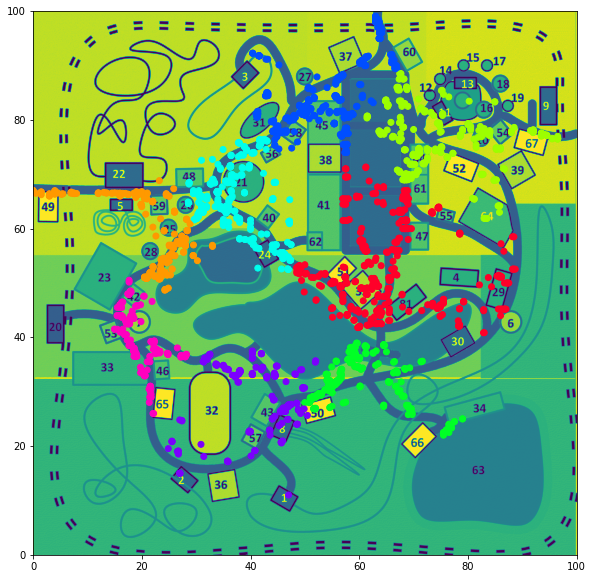

In [341]:
crowd = bucketSun[bucketSun['Timestamp']=='2014-06-08 20:30:00']
latlong = np.array(crowd[['X','Y']])
dbscan_test = AgglomerativeClustering(8).fit(latlong)
dbscan_test.labels_
latlong = np.array(crowd[['X','Y']])
y_pred = dbscan_test.fit_predict(crowd[['X','Y']])
plt.figure(figsize=(10,10))
implot = plt.imshow(im, extent=[0, 100, 0, 100])
plt.scatter(latlong[:,0], latlong[:,1],c=y_pred, cmap='gist_rainbow')

**Groups**


Characterize the attendance at the park on this weekend. Describe up to twelve different types of groups at the park on this weekend.

  How big is the group type?

  Where does this type of group like to go in the park?

  How common is this type of group?

  What are your other observations about this type of group?

  What can you infer about the group?
  
  If you were to make one improvement to the park to better meet this group’s needs, what would it be?



The Walkers - only checked into the park never went on any rides

How big is the group type?
Friday - 8
Saturday - 10
Sunday - 21

Where does this type of group like to go in the park?
They like to walkaround and not go on rides

How common is this type of group?
It's not that common

What are your other observations about this type of group?
Each person was only in the park for one day. No one in this group ever went near a trill ride.

What can you infer about the group?
They might be helping other guests enjoy the park as chaperone or assists someone who needs physical assistance

If you were to make one improvement to the park to better meet this group’s needs, what would it be?
If they are helping other guests enjoy the park offer a spacial day to come to the park to enjoy it with reduced lines

In [342]:
#guestMoveFri_df.groupby(['id', 'type']).agg('type'=='check-in').count()
groupA=guestMoveFri_df.loc[guestMoveFri_df['type'] == 'check-in'].groupby(['id']).size()
print(groupA[groupA==1])
groupB=guestMoveSat_df.loc[guestMoveSat_df['type'] == 'check-in'].groupby(['id']).size()
print(groupB[groupB==1])
groupC=guestMoveSun_df.loc[guestMoveSun_df['type'] == 'check-in'].groupby(['id']).size()
print(groupC[groupC==1])
#guestMoveFri_df.groupby(['Timestamp', 'type']).agg({'id':'count'}).reset_index().rename(columns={'id':'count'})

id
415491     1
439584     1
1081515    1
1283386    1
1307724    1
1763672    1
1781128    1
2049974    1
dtype: int64
id
334793     1
417205     1
626433     1
953838     1
1458915    1
1680161    1
1725365    1
1737703    1
1748887    1
2090763    1
dtype: int64
id
47441      1
159893     1
430595     1
500084     1
521750     1
644885     1
655378     1
921888     1
1080969    1
1149884    1
1217381    1
1269018    1
1563594    1
1600469    1
1601276    1
1629516    1
1658667    1
1711922    1
1781070    1
1787551    1
1935406    1
dtype: int64


                  Timestamp       id      type   X   Y
6043    2014-06-06 08:07:36  1283386  check-in  63  99
8086    2014-06-06 08:08:40  1283386  movement  63  98
8252    2014-06-06 08:08:45  1283386  movement  63  97
8428    2014-06-06 08:08:50  1283386  movement  63  96
8630    2014-06-06 08:08:55  1283386  movement  64  95
...                     ...      ...       ...  ..  ..
2374604 2014-06-06 13:11:50  1283386  movement  64  95
2375121 2014-06-06 13:11:55  1283386  movement  64  96
2375691 2014-06-06 13:12:00  1283386  movement  64  97
2376500 2014-06-06 13:12:05  1283386  movement  64  98
2377103 2014-06-06 13:12:10  1283386  movement  63  99

[586 rows x 5 columns]


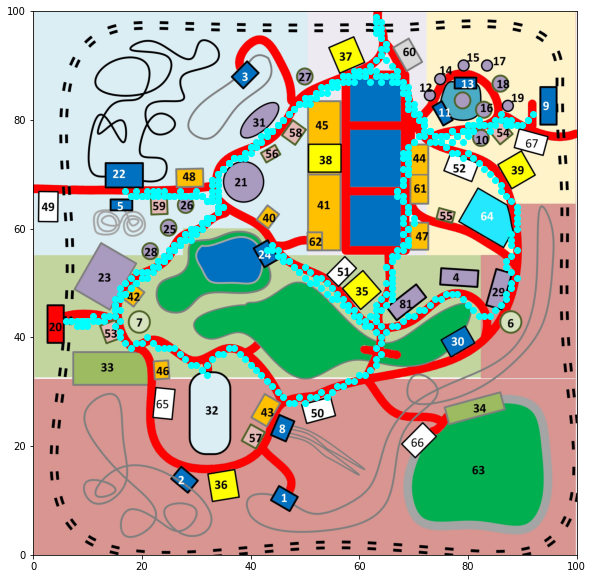

In [343]:
guest=guestMoveFri_df.loc[guestMoveFri_df['id'] == 1283386]#[guestMoveSun_df['type'] == 'check-in']
print(guest)
im2 = plt.imread('/content/dataroot/task1/Park Map.jpg')
plt.figure(figsize=(10,10))
implot = plt.imshow(im2, extent=[0, 100, 0, 100])
plt.scatter(guest['X'], guest['Y'], c='cyan')
plt.show()

                  Timestamp       id      type   X   Y
140906  2014-06-07 08:28:12  1725365  check-in  63  99
208079  2014-06-07 08:35:38  1725365  movement  63  98
208802  2014-06-07 08:35:42  1725365  movement  63  97
209524  2014-06-07 08:35:46  1725365  movement  64  96
210226  2014-06-07 08:35:50  1725365  movement  65  95
...                     ...      ...       ...  ..  ..
8872609 2014-06-07 22:11:49  1725365  movement  64  95
8873104 2014-06-07 22:11:53  1725365  movement  64  96
8873468 2014-06-07 22:11:57  1725365  movement  63  97
8873969 2014-06-07 22:12:01  1725365  movement  64  98
8874368 2014-06-07 22:12:05  1725365  movement  63  99

[1606 rows x 5 columns]


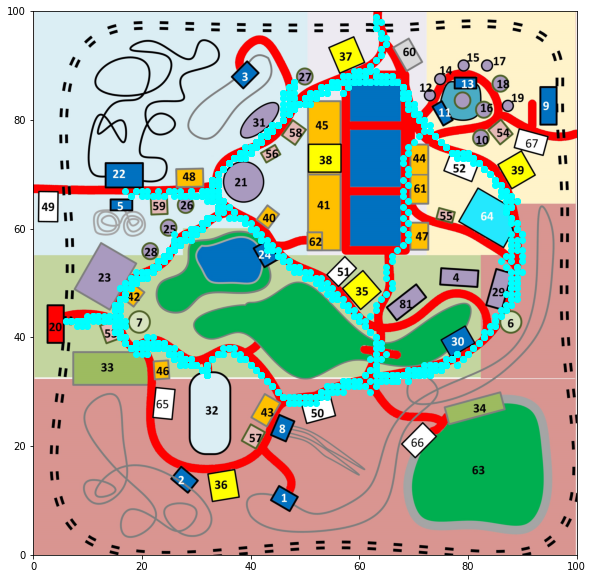

In [344]:
guest=guestMoveSat_df.loc[guestMoveSat_df['id'] == 1725365]#[guestMoveSun_df['type'] == 'check-in']
print(guest)
im2 = plt.imread('/content/dataroot/task1/Park Map.jpg')
plt.figure(figsize=(10,10))
implot = plt.imshow(im2, extent=[0, 100, 0, 100])
plt.scatter(guest['X'], guest['Y'], c='cyan')
plt.show()

                  Timestamp       id      type   X   Y
550394  2014-06-08 08:56:05  1149884  check-in  63  99
900631  2014-06-08 09:18:27  1149884  movement  64  98
902152  2014-06-08 09:18:33  1149884  movement  63  97
903597  2014-06-08 09:18:39  1149884  movement  64  96
905220  2014-06-08 09:18:45  1149884  movement  64  95
...                     ...      ...       ...  ..  ..
9918098 2014-06-08 20:35:53  1149884  movement  64  95
9919235 2014-06-08 20:35:59  1149884  movement  64  96
9920401 2014-06-08 20:36:05  1149884  movement  63  97
9921512 2014-06-08 20:36:11  1149884  movement  63  98
9922622 2014-06-08 20:36:17  1149884  movement  63  99

[1100 rows x 5 columns]


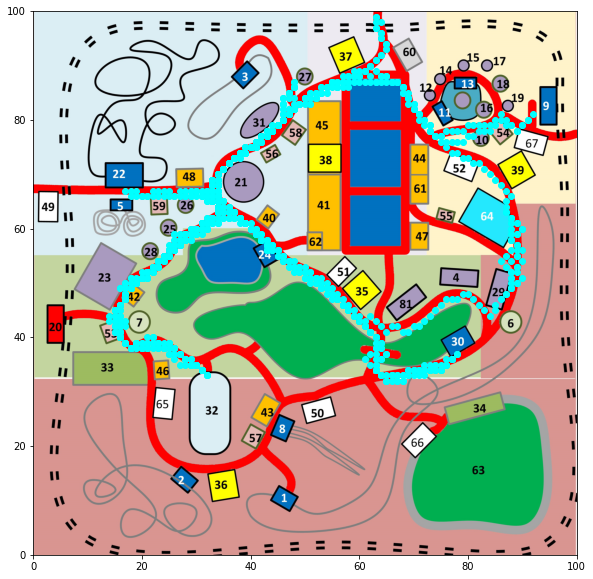

In [345]:
guest=guestMoveSun_df.loc[guestMoveSun_df['id'] == 1149884]#[guestMoveSun_df['type'] == 'check-in']
print(guest)
im2 = plt.imread('/content/dataroot/task1/Park Map.jpg')
plt.figure(figsize=(10,10))
implot = plt.imshow(im2, extent=[0, 100, 0, 100])
plt.scatter(guest['X'], guest['Y'], c='cyan')
plt.show()

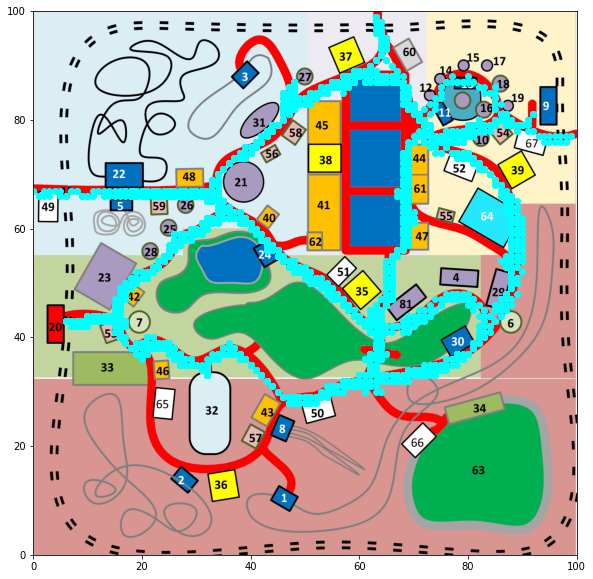

In [346]:
walkers=groupA[groupA==1]
walkers
x = []
y = []
for i in walkers.index:
  x.extend(guestMoveFri_df.loc[guestMoveFri_df['id'] == i]['X'])
  y.extend(guestMoveFri_df.loc[guestMoveFri_df['id'] == i]['Y'])
im2 = plt.imread('/content/dataroot/task1/Park Map.jpg')
plt.figure(figsize=(10,10))
implot = plt.imshow(im2, extent=[0, 100, 0, 100])
plt.scatter(x, y, c='cyan')
plt.show()

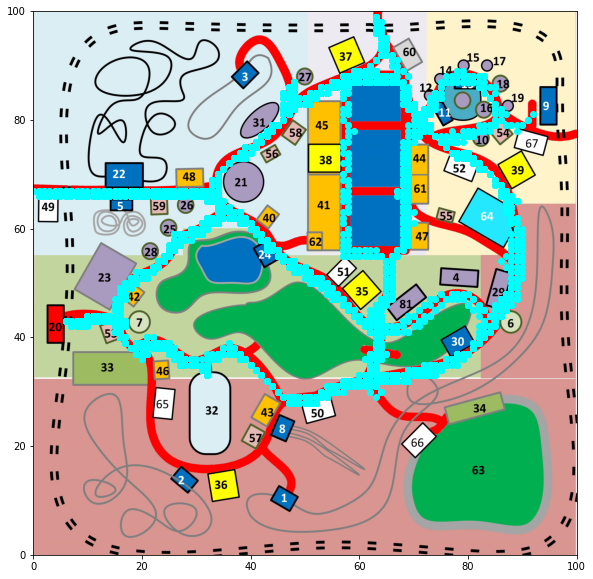

In [347]:
walkers=groupB[groupB==1]
walkers
x = []
y = []
for i in walkers.index:
  x.extend(guestMoveSat_df.loc[guestMoveSat_df['id'] == i]['X'])
  y.extend(guestMoveSat_df.loc[guestMoveSat_df['id'] == i]['Y'])
im2 = plt.imread('/content/dataroot/task1/Park Map.jpg')
plt.figure(figsize=(10,10))
implot = plt.imshow(im2, extent=[0, 100, 0, 100])
plt.scatter(x, y, c='cyan')
plt.show()

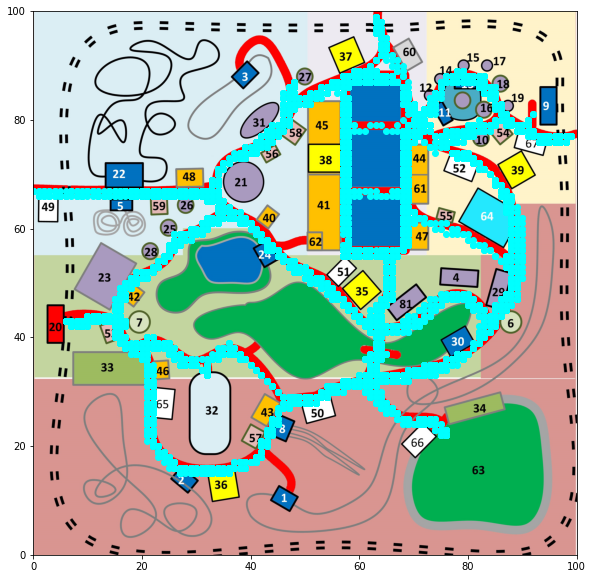

In [348]:
walkers=groupC[groupC==1]
walkers
x = []
y = []
for i in walkers.index:
  x.extend(guestMoveSun_df.loc[guestMoveSun_df['id'] == i]['X'])
  y.extend(guestMoveSun_df.loc[guestMoveSun_df['id'] == i]['Y'])
im2 = plt.imread('/content/dataroot/task1/Park Map.jpg')
plt.figure(figsize=(10,10))
implot = plt.imshow(im2, extent=[0, 100, 0, 100])
plt.scatter(x, y, c='cyan')
plt.show()

Scott Jones Super Fans - Went to the show all three days

How big is the group type? 9 people

Where does this type of group like to go in the park? They seem to like rides for everyone and trill rides

How common is this type of group? Not Common

What are your other observations about this type of group? They spend 9 to 11 hours in the park and spend out going on all the big trill rides over the 3 days

What can you infer about the group? They are big Scott Jones fans. Possibley could be casing the park and were in on the crime

If you were to make one improvement to the park to better meet this group’s needs, what would it be? If they are super fans more Scott Jones events if Scott Jones would be willing to return to the park

In [349]:
SJshowFri=guestMoveFri_df.loc[guestMoveFri_df['type'] == 'check-in'][guestMoveFri_df['X'] == 76][guestMoveFri_df['Y'] == 22]
SJshowSat=guestMoveSat_df.loc[guestMoveSat_df['type'] == 'check-in'][guestMoveSat_df['X'] == 76][guestMoveSat_df['Y'] == 22]
SJshowSun=guestMoveSun_df.loc[guestMoveSun_df['type'] == 'check-in'][guestMoveSun_df['X'] == 76][guestMoveSun_df['Y'] == 22]


SJshowFri = SJshowFri.drop(columns='Timestamp')
SJshowSat = SJshowSat.drop(columns='Timestamp')
SJshowSun = SJshowSun.drop(columns='Timestamp')

SuperFans = pd.merge(SJshowFri,SJshowSat, on=['id'])
print(SuperFans)
SuperFans = pd.merge(SuperFans,SJshowSun, on=['id'])
SuperFans = SuperFans.drop(columns=['type_x', 	'X_x', 	'Y_x', 	'type_y', 	'X_y', 	'Y_y'])
SuperFans

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


         id    type_x  X_x  Y_x    type_y  X_y  Y_y
0    174727  check-in   76   22  check-in   76   22
1    697057  check-in   76   22  check-in   76   22
2     60633  check-in   76   22  check-in   76   22
3   1865730  check-in   76   22  check-in   76   22
4   1346459  check-in   76   22  check-in   76   22
..      ...       ...  ...  ...       ...  ...  ...
71  1088488  check-in   76   22  check-in   76   22
72   938574  check-in   76   22  check-in   76   22
73   900405  check-in   76   22  check-in   76   22
74  1760129  check-in   76   22  check-in   76   22
75  1713869  check-in   76   22  check-in   76   22

[76 rows x 7 columns]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


,id,type,X,Y
0,1346459,check-in,76,22
1,1760383,check-in,76,22
2,89618,check-in,76,22
3,859038,check-in,76,22
4,1696241,check-in,76,22
5,885299,check-in,76,22
6,1784467,check-in,76,22
7,1537249,check-in,76,22
8,464830,check-in,76,22
9,13354,check-in,76,22


In [350]:
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 13354][guestMoveFri_df['type'] == 'check-in'])
print(guestMoveSat_df.loc[guestMoveSat_df['id'] == 13354][guestMoveSat_df['type'] == 'check-in'])
print(guestMoveSun_df.loc[guestMoveSun_df['id'] == 13354][guestMoveSun_df['type'] == 'check-in'])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


                  Timestamp     id      type   X   Y
187217  2014-06-06 08:43:04  13354  check-in   0  67
453166  2014-06-06 09:15:16  13354  check-in  42  37
629650  2014-06-06 09:37:02  13354  check-in  87  48
684363  2014-06-06 09:42:48  13354  check-in  69  44
845079  2014-06-06 10:01:24  13354  check-in  23  54
926795  2014-06-06 10:11:36  13354  check-in  42  37
1691153 2014-06-06 11:46:05  13354  check-in  45  24
1780175 2014-06-06 11:57:52  13354  check-in  16  66
1866762 2014-06-06 12:08:36  13354  check-in  73  79
1990282 2014-06-06 12:24:04  13354  check-in  16  49
2062196 2014-06-06 12:33:06  13354  check-in  32  33
2199694 2014-06-06 12:49:48  13354  check-in  78  48
2616517 2014-06-06 13:45:04  13354  check-in  17  43
2689416 2014-06-06 13:55:20  13354  check-in  45  24
2722836 2014-06-06 14:00:04  13354  check-in  32  33
3124945 2014-06-06 14:50:28  13354  check-in  76  22
4213089 2014-06-06 17:25:15  13354  check-in  42  37
4603983 2014-06-06 18:20:12  13354  check-in  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


                  Timestamp     id      type   X   Y
214187  2014-06-07 08:36:13  13354  check-in   0  67
350105  2014-06-07 08:48:30  13354  check-in  45  24
396604  2014-06-07 08:52:00  13354  check-in  47  11
596947  2014-06-07 09:06:44  13354  check-in  87  63
1452826 2014-06-07 10:12:16  13354  check-in  42  37
2146076 2014-06-07 11:12:22  13354  check-in  45  24
2693288 2014-06-07 11:58:16  13354  check-in  16  49
2818063 2014-06-07 12:09:00  13354  check-in  43  56
2939474 2014-06-07 12:20:32  13354  check-in  17  43
3724501 2014-06-07 13:26:08  13354  check-in  32  33
4168539 2014-06-07 14:04:14  13354  check-in  78  48
4667204 2014-06-07 14:47:02  13354  check-in  76  22
5446026 2014-06-07 16:06:01  13354  check-in  43  56
5658833 2014-06-07 16:24:16  13354  check-in  27  15
6443933 2014-06-07 17:38:29  13354  check-in  16  66
                  Timestamp     id      type   X   Y
180212  2014-06-08 08:27:30  13354  check-in   0  67
309827  2014-06-08 08:39:04  13354  check-in  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


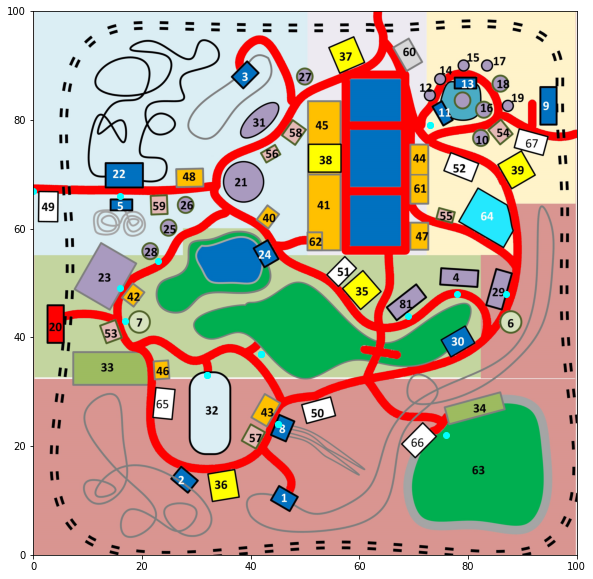

In [351]:
guest=guestMoveFri_df.loc[guestMoveFri_df['id'] == 13354][guestMoveFri_df['type'] == 'check-in']
#print(guest)
im2 = plt.imread('/content/dataroot/task1/Park Map.jpg')
plt.figure(figsize=(10,10))
implot = plt.imshow(im2, extent=[0, 100, 0, 100])
plt.scatter(guest['X'], guest['Y'], c='cyan')
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


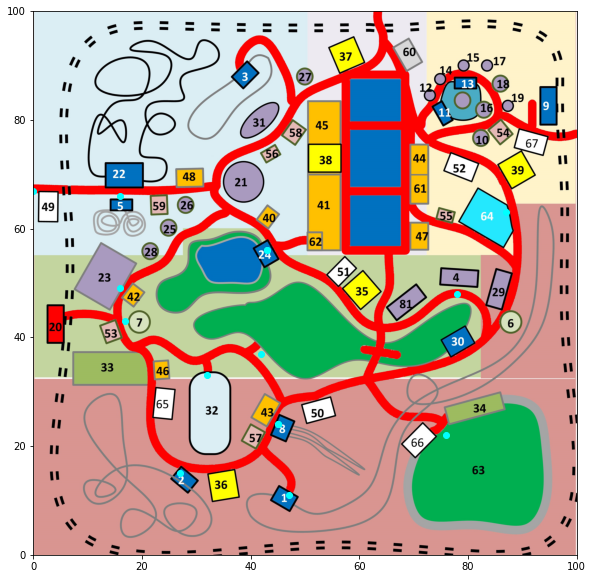

In [352]:
guest=guestMoveSat_df.loc[guestMoveSat_df['id'] == 13354][guestMoveSat_df['type'] == 'check-in']
#print(guest)
im2 = plt.imread('/content/dataroot/task1/Park Map.jpg')
plt.figure(figsize=(10,10))
implot = plt.imshow(im2, extent=[0, 100, 0, 100])
plt.scatter(guest['X'], guest['Y'], c='cyan')
plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


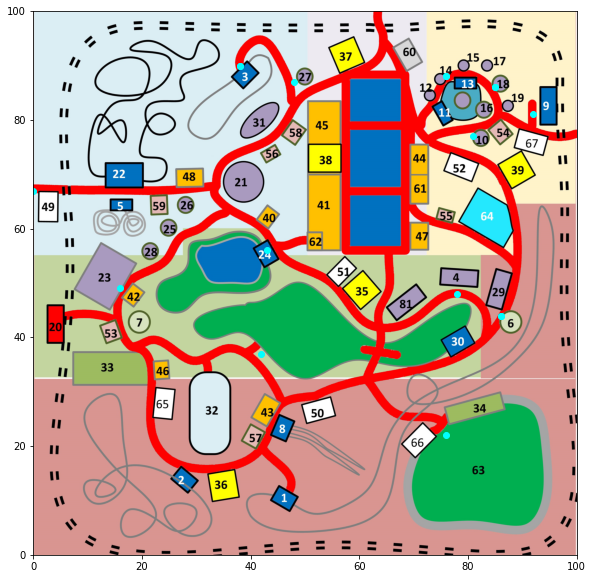

In [353]:
guest=guestMoveSun_df.loc[guestMoveSun_df['id'] == 13354][guestMoveSun_df['type'] == 'check-in']
#print(guest)
im2 = plt.imread('/content/dataroot/task1/Park Map.jpg')
plt.figure(figsize=(10,10))
implot = plt.imshow(im2, extent=[0, 100, 0, 100])
plt.scatter(guest['X'], guest['Y'], c='cyan')
plt.show()

In [354]:
SuperFans_table = pd.DataFrame()
for i in SuperFans['id']:
  SuperFans_table = SuperFans_table.append(guestMoveFri_df.loc[guestMoveFri_df['id'] == i][guestMoveFri_df['type'] == 'check-in'][guestMoveFri_df['X'] == 76][guestMoveFri_df['Y'] == 22], ignore_index=True)
  SuperFans_table = SuperFans_table.append(guestMoveSat_df.loc[guestMoveSat_df['id'] == i][guestMoveSat_df['type'] == 'check-in'][guestMoveSat_df['X'] == 76][guestMoveSat_df['Y'] == 22], ignore_index=True)
  SuperFans_table = SuperFans_table.append(guestMoveSun_df.loc[guestMoveSun_df['id'] == i][guestMoveSun_df['type'] == 'check-in'][guestMoveSun_df['X'] == 76][guestMoveSun_df['Y'] == 22], ignore_index=True)
#SuperFans_table = pd.DataFrame(SuperFans_table)
SuperFans_table

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removi

,Timestamp,id,type,X,Y
0,2014-06-06 09:36:33,1346459,check-in,76,22
1,2014-06-07 14:41:35,1346459,check-in,76,22
2,2014-06-08 09:43:15,1346459,check-in,76,22
3,2014-06-06 09:39:51,1760383,check-in,76,22
4,2014-06-07 09:45:32,1760383,check-in,76,22
5,2014-06-08 09:39:38,1760383,check-in,76,22
6,2014-06-06 09:42:44,89618,check-in,76,22
7,2014-06-07 09:53:21,89618,check-in,76,22
8,2014-06-08 09:45:58,89618,check-in,76,22
9,2014-06-06 09:45:12,859038,check-in,76,22


In [355]:
attraction_df['xy'] = list(zip(attraction_df['X'], attraction_df['Y']))
attraction_df

,Ride_ID,Name,Type,X,Y,xy
0,0,Entry Corridor North,Door,63,99,"(63, 99)"
1,82,Entry Corridor West,Door,0,67,"(0, 67)"
2,83,Entry Corridor East,Door,99,77,"(99, 77)"
3,12,Flying TyrAndrienkos,Kiddie,73,84,"(73, 84)"
4,14,Beelzebufo,Kiddie,76,88,"(76, 88)"
5,7,Firefall,Trill,17,43,"(17, 43)"
6,20,Scholtz Express,Everyone,6,43,"(6, 43)"
7,3,Auvilotops Express,Trill,38,90,"(38, 90)"
8,11,Sauroma Bumpers,Kiddie,73,79,"(73, 79)"
9,2,Galactosaurus Rage,Trill,27,15,"(27, 15)"


In [356]:
SuperFans_table = pd.DataFrame()
for i in SuperFans['id']:
  SuperFans_table = SuperFans_table.append(guestMoveFri_df.loc[guestMoveFri_df['id'] == i][guestMoveFri_df['type'] == 'check-in'], ignore_index=True)
  SuperFans_table = SuperFans_table.append(guestMoveSat_df.loc[guestMoveSat_df['id'] == i][guestMoveSat_df['type'] == 'check-in'], ignore_index=True)
  SuperFans_table = SuperFans_table.append(guestMoveSun_df.loc[guestMoveSun_df['id'] == i][guestMoveSun_df['type'] == 'check-in'], ignore_index=True)
SuperFans_table

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_l

,Timestamp,id,type,X,Y
0,2014-06-06 08:08:13,1346459,check-in,0,67
1,2014-06-06 08:33:41,1346459,check-in,32,33
2,2014-06-06 08:59:24,1346459,check-in,32,33
3,2014-06-06 09:15:05,1346459,check-in,27,15
4,2014-06-06 09:36:33,1346459,check-in,76,22
...,...,...,...,...,...
596,2014-06-08 15:39:16,13354,check-in,86,44
597,2014-06-08 15:52:18,13354,check-in,85,86
598,2014-06-08 16:04:36,13354,check-in,78,48
599,2014-06-08 17:13:20,13354,check-in,76,88


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


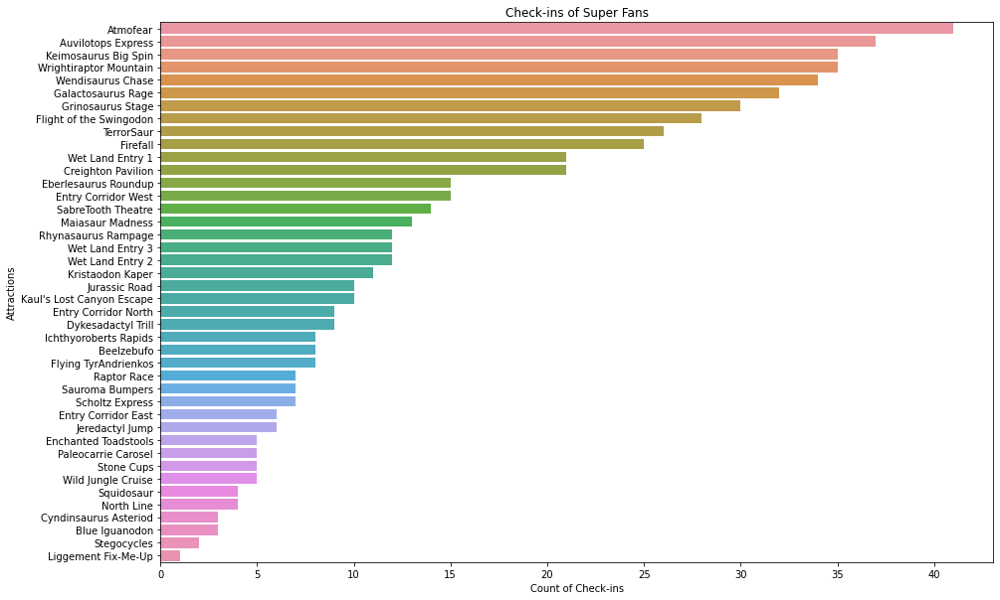

In [357]:
SuperFans_table['xy'] = list(zip(SuperFans_table['X'], SuperFans_table['Y']))
SuperFans_table_merge = pd.merge(SuperFans_table,attraction_df, on=['xy'])
SuperFans_count = SuperFans_table_merge.groupby(['Name'])['id'].count()
SuperFans_count
SuperFans_count=SuperFans_count.sort_values(ascending=False)
plt.figure(figsize=(15,10))
SuperFans_count=sns.barplot(SuperFans_count.values, SuperFans_count.index,)
SuperFans_count.set(xlabel='Count of Check-ins', ylabel = 'Attractions', title='Check-ins of Super Fans')
SuperFans_count

Randels the Vandals

 How big is the group type? 3 People

  Where does this type of group like to go in the park? They like rides for everyone and trill rides

  How common is this type of group? Not common

  What are your other observations about this type of group? They went back to the pavilion after the vandalism was discoverd

  What can you infer about the group? If they are not the vandles there were there when it happened
  
  If you were to make one improvement to the park to better meet this group’s needs, what would it be? Not get them in trouble

In [358]:
checkingSunCheckin = guestMoveSun_df.loc[(guestMoveSun_df['Timestamp'] > '2014-6-08 09:15:00') & (guestMoveSun_df['Timestamp'] <= '2014-6-08 09:30:00') & (guestMoveSun_df['type'] == 'check-in')]
checkingSunCheckin = pd.merge(attraction_df,checkingSunCheckin, on=['X', 'Y'])
checkingSunCheckin = checkingSunCheckin.groupby(['Name']).count()
checkingSunCheckin

,Ride_ID,Type,X,Y,xy,Timestamp,id,type
Name,,,,,,,,
Atmofear,193,193,193,193,193,193,193,193
Auvilotops Express,209,209,209,209,209,209,209,209
Beelzebufo,28,28,28,28,28,28,28,28
Blue Iguanodon,21,21,21,21,21,21,21,21
Creighton Pavilion,251,251,251,251,251,251,251,251
Cyndinsaurus Asteriod,35,35,35,35,35,35,35,35
Dykesadactyl Trill,58,58,58,58,58,58,58,58
Eberlesaurus Roundup,44,44,44,44,44,44,44,44
Enchanted Toadstools,27,27,27,27,27,27,27,27


In [359]:
checkingSunCheckin = guestMoveSun_df.loc[(guestMoveSun_df['Timestamp'] > '2014-6-08 09:30:00') & (guestMoveSun_df['Timestamp'] <= '2014-6-08 10:15:00') & (guestMoveSun_df['type'] == 'check-in')]
checkingSunCheckin = pd.merge(attraction_df,checkingSunCheckin, on=['X', 'Y'])
checkingSunCheckin = checkingSunCheckin.groupby(['Name']).count()
checkingSunCheckin

,Ride_ID,Type,X,Y,xy,Timestamp,id,type
Name,,,,,,,,
Atmofear,525,525,525,525,525,525,525,525
Auvilotops Express,487,487,487,487,487,487,487,487
Beelzebufo,148,148,148,148,148,148,148,148
Blue Iguanodon,110,110,110,110,110,110,110,110
Cyndinsaurus Asteriod,128,128,128,128,128,128,128,128
Dykesadactyl Trill,157,157,157,157,157,157,157,157
Eberlesaurus Roundup,114,114,114,114,114,114,114,114
Enchanted Toadstools,88,88,88,88,88,88,88,88
Entry Corridor East,62,62,62,62,62,62,62,62


What anomalies or unusual patterns do you see? Describe no more than 10 anomalies, and prioritize those unusual patterns that you think are most likely to be relevant to the crime.

The biggest anomaly that leads me to believe that the 3 vandals were Guest 1502920, 416790, and 461004 was their check-in times. They checked into the Creighton Pavilion around 9:00 and didn't have another entire in their movement or check-in until 11:30 right when the Pavilion was unlocked. Guest 1502920 checked in at the same time as guest 416790 and 461004, but then had another check-in at the Creighton Pavilion at 9:30 which I believe was him checking to make sure the Creighton Pavilion was locked then the three just waited for everyone else to leave then vandalized and stole Scott Jones medals. At 11:30 416790 and 461004 left out the entrance while 1502920 left out the exit. 

In [360]:
checkingSunCheckin = guestMoveSun_df.loc[(guestMoveSun_df['Timestamp'] > '2014-6-08 11:30:00') & (guestMoveSun_df['Timestamp'] <= '2014-6-08 11:30:10') & (guestMoveSun_df['type'] == 'check-in')]
checkingSunCheckin = pd.merge(attraction_df,checkingSunCheckin, on=['X', 'Y'])
checkingSunCheckin = checkingSunCheckin.groupby(['Name']).count()
checkingSunCheckin

,Ride_ID,Type,X,Y,xy,Timestamp,id,type
Name,,,,,,,,
Creighton Pavilion,4,4,4,4,4,4,4,4
Eberlesaurus Roundup,4,4,4,4,4,4,4,4
Firefall,1,1,1,1,1,1,1,1
Raptor Race,3,3,3,3,3,3,3,3
Wendisaurus Chase,1,1,1,1,1,1,1,1
Wrightiraptor Mountain,1,1,1,1,1,1,1,1


In [361]:
guestMoveSun_df.loc[(guestMoveSun_df['Timestamp'] > '2014-6-08 10:30:00') & (guestMoveSun_df['Timestamp'] <= '2014-6-08 10:35:00') & (guestMoveSun_df['X'] == 32) & (guestMoveSun_df['Y'] == 33)]# & (guestMoveSun_df['type'] == 'check-in')]

,Timestamp,id,type,X,Y
1907832,2014-06-08 10:30:09,1210589,movement,32,33
1907968,2014-06-08 10:30:09,485596,movement,32,33
1908044,2014-06-08 10:30:10,1167555,movement,32,33
1908062,2014-06-08 10:30:10,1301074,movement,32,33
1908107,2014-06-08 10:30:10,1775,movement,32,33
...,...,...,...,...,...
1969490,2014-06-08 10:34:53,1739440,movement,32,33
1969658,2014-06-08 10:34:54,1212050,movement,32,33
1969665,2014-06-08 10:34:54,128920,movement,32,33
1969800,2014-06-08 10:34:54,509358,movement,32,33


In [362]:
guestMoveSun_df.loc[(guestMoveSun_df['Timestamp'] > '2014-6-08 09:28:00') & (guestMoveSun_df['Timestamp'] <= '2014-6-08 09:45:10') & (guestMoveSun_df['type'] == 'check-in') & (guestMoveSun_df['X'] == 32) & (guestMoveSun_df['Y'] == 33)]

,Timestamp,id,type,X,Y
1045266,2014-06-08 09:28:18,195888,check-in,32,33
1045419,2014-06-08 09:28:19,145262,check-in,32,33
1045469,2014-06-08 09:28:19,182878,check-in,32,33
1045551,2014-06-08 09:28:19,696925,check-in,32,33
1046053,2014-06-08 09:28:21,764182,check-in,32,33
1046207,2014-06-08 09:28:22,184216,check-in,32,33
1046353,2014-06-08 09:28:23,1044611,check-in,32,33
1046370,2014-06-08 09:28:23,1189267,check-in,32,33
1046491,2014-06-08 09:28:23,2043831,check-in,32,33
1052525,2014-06-08 09:28:48,1016471,check-in,32,33


In [363]:
guestMoveSun_df.loc[(guestMoveSun_df['Timestamp'] > '2014-6-08 09:28:00') & (guestMoveSun_df['Timestamp'] <= '2014-6-08 09:50:10') & (guestMoveSun_df['type'] == 'movement') & (guestMoveSun_df['X'] == 32) & (guestMoveSun_df['Y'] == 34)] 

,Timestamp,id,type,X,Y
1042904,2014-06-08 09:28:09,1483705,movement,32,34
1042989,2014-06-08 09:28:09,2063022,movement,32,34
1043013,2014-06-08 09:28:09,392618,movement,32,34
1050732,2014-06-08 09:28:40,400052,movement,32,34
1054679,2014-06-08 09:28:57,1279558,movement,32,34
...,...,...,...,...,...
1375662,2014-06-08 09:49:07,718869,movement,32,34
1375939,2014-06-08 09:49:08,750540,movement,32,34
1376039,2014-06-08 09:49:09,1511028,movement,32,34
1379523,2014-06-08 09:49:22,981100,movement,32,34


In [364]:
guestMoveSun_df.loc[(guestMoveSun_df['Timestamp'] > '2014-6-08 09:01:50') & (guestMoveSun_df['Timestamp'] <= '2014-6-08 09:02:10') & (guestMoveSun_df['type'] == 'check-in') & (guestMoveSun_df['X'] == 32) & (guestMoveSun_df['Y'] == 33)]

,Timestamp,id,type,X,Y
644184,2014-06-08 09:01:53,1617284,check-in,32,33
645415,2014-06-08 09:01:57,461004,check-in,32,33
645547,2014-06-08 09:01:58,1502920,check-in,32,33
645691,2014-06-08 09:01:58,416790,check-in,32,33
646572,2014-06-08 09:02:02,1359205,check-in,32,33
646895,2014-06-08 09:02:03,2014925,check-in,32,33
647270,2014-06-08 09:02:04,22405,check-in,32,33


In [365]:
guestMoveSun_df.loc[(guestMoveSun_df['Timestamp'] > '2014-6-08 09:20:50') & (guestMoveSun_df['Timestamp'] <= '2014-6-08 09:45:10') & (guestMoveSun_df['type'] == 'check-in') & (guestMoveSun_df['X'] == 32) & (guestMoveSun_df['Y'] == 33)]

,Timestamp,id,type,X,Y
935716,2014-06-08 09:20:51,1278084,check-in,32,33
936157,2014-06-08 09:20:52,658367,check-in,32,33
936225,2014-06-08 09:20:53,1008448,check-in,32,33
936446,2014-06-08 09:20:53,510274,check-in,32,33
936685,2014-06-08 09:20:54,2037299,check-in,32,33
...,...,...,...,...,...
1066801,2014-06-08 09:29:49,244005,check-in,32,33
1066945,2014-06-08 09:29:50,1762673,check-in,32,33
1066951,2014-06-08 09:29:50,1808584,check-in,32,33
1066995,2014-06-08 09:29:50,487563,check-in,32,33


In [366]:
guestMoveSun_df.loc[(guestMoveSun_df['Timestamp'] > '2014-6-08 09:29:00') & (guestMoveSun_df['Timestamp'] <= '2014-6-08 09:50:10') &( guestMoveSun_df['id'] == 487563)]# & (guestMoveSun_df['X'] == 32) & (guestMoveSun_df['type'] == 'check-in') & (guestMoveSun_df['Y'] == 33)]

,Timestamp,id,type,X,Y
1056792,2014-06-08 09:29:05,487563,movement,24,38
1057864,2014-06-08 09:29:10,487563,movement,25,39
1059046,2014-06-08 09:29:15,487563,movement,26,38
1060254,2014-06-08 09:29:20,487563,movement,27,37
1061478,2014-06-08 09:29:25,487563,movement,28,36
1062628,2014-06-08 09:29:30,487563,movement,29,36
1063785,2014-06-08 09:29:35,487563,movement,30,35
1064871,2014-06-08 09:29:40,487563,movement,31,34
1065957,2014-06-08 09:29:45,487563,movement,32,33
1066995,2014-06-08 09:29:50,487563,check-in,32,33


In [367]:
guestMoveSun_df.loc[(guestMoveSun_df['Timestamp'] > '2014-6-08 11:30:00') & (guestMoveSun_df['Timestamp'] <= '2014-6-08 11:30:10') & (guestMoveSun_df['type'] == 'check-in') & (guestMoveSun_df['X'] == 32)]

,Timestamp,id,type,X,Y
2788863,2014-06-08 11:30:01,416790,check-in,32,33
2788870,2014-06-08 11:30:01,461004,check-in,32,33
2790211,2014-06-08 11:30:07,1919993,check-in,32,33
2790471,2014-06-08 11:30:08,281145,check-in,32,33


                   Timestamp      id      type   X   Y
236173   2014-06-08 08:33:03  416790  check-in  63  99
396556   2014-06-08 08:45:45  416790  movement  64  98
397958   2014-06-08 08:45:51  416790  movement  64  97
399438   2014-06-08 08:45:57  416790  movement  63  96
400760   2014-06-08 08:46:03  416790  movement  64  95
...                      ...     ...       ...  ..  ..
10481091 2014-06-08 21:39:37  416790  movement  65  95
10482047 2014-06-08 21:39:43  416790  movement  64  96
10482958 2014-06-08 21:39:49  416790  movement  63  97
10483855 2014-06-08 21:39:55  416790  movement  63  98
10484603 2014-06-08 21:40:01  416790  movement  63  99

[1292 rows x 5 columns]


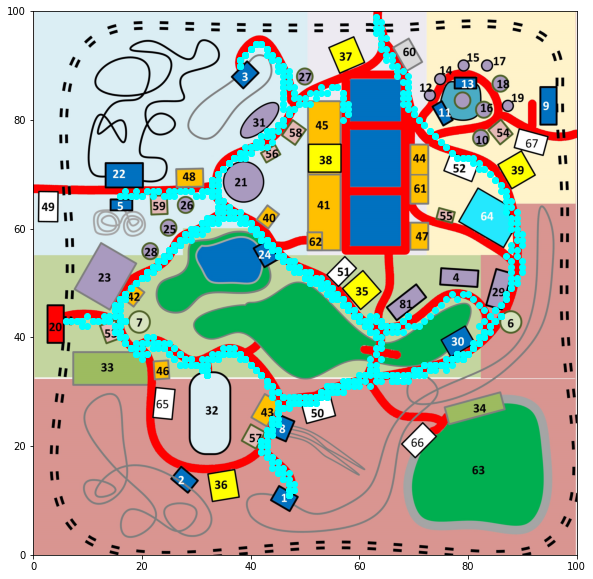

In [368]:
g416790=guestMoveSun_df.loc[guestMoveSun_df['id'] == 416790]#[guestMoveFri_df['type'] == 'check-in'])
print(g416790)
im2 = plt.imread('/content/dataroot/task1/Park Map.jpg')
plt.figure(figsize=(10,10))
implot = plt.imshow(im2, extent=[0, 100, 0, 100])
plt.scatter(g416790['X'], g416790['Y'], c='cyan')
plt.show()

                   Timestamp      id      type   X   Y
236177   2014-06-08 08:33:03  461004  check-in  63  99
395707   2014-06-08 08:45:41  461004  movement  63  98
397075   2014-06-08 08:45:47  461004  movement  64  97
398515   2014-06-08 08:45:53  461004  movement  64  96
399954   2014-06-08 08:45:59  461004  movement  64  95
...                      ...     ...       ...  ..  ..
10481094 2014-06-08 21:39:37  461004  movement  64  95
10482052 2014-06-08 21:39:43  461004  movement  64  96
10482962 2014-06-08 21:39:49  461004  movement  64  97
10483862 2014-06-08 21:39:55  461004  movement  64  98
10484606 2014-06-08 21:40:01  461004  movement  63  99

[1292 rows x 5 columns]


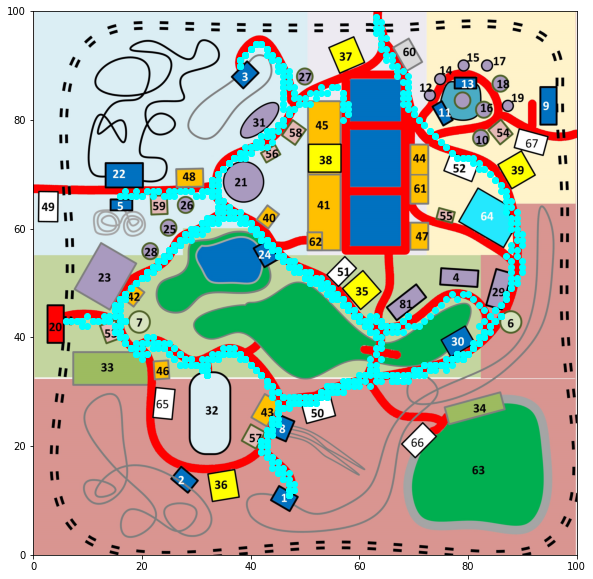

In [369]:
g461004=guestMoveSun_df.loc[guestMoveSun_df['id'] == 461004]#[guestMoveFri_df['type'] == 'check-in'])
print(g461004)
im2 = plt.imread('/content/dataroot/task1/Park Map.jpg')
plt.figure(figsize=(10,10))
implot = plt.imshow(im2, extent=[0, 100, 0, 100])
plt.scatter(g416790['X'], g416790['Y'], c='cyan')
plt.show()

                   Timestamp       id      type   X   Y
236122   2014-06-08 08:33:03  1502920  check-in  63  99
395973   2014-06-08 08:45:43  1502920  movement  64  98
397434   2014-06-08 08:45:49  1502920  movement  64  97
398879   2014-06-08 08:45:55  1502920  movement  64  96
400280   2014-06-08 08:46:01  1502920  movement  64  95
...                      ...      ...       ...  ..  ..
10481161 2014-06-08 21:39:38  1502920  movement  64  95
10482118 2014-06-08 21:39:44  1502920  movement  63  96
10483038 2014-06-08 21:39:50  1502920  movement  64  97
10483966 2014-06-08 21:39:56  1502920  movement  63  98
10484672 2014-06-08 21:40:02  1502920  movement  63  99

[1291 rows x 5 columns]


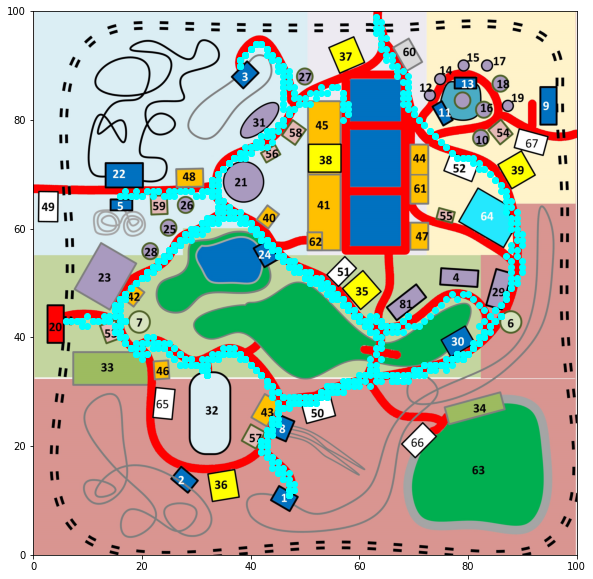

In [370]:
g1502920=guestMoveSun_df.loc[guestMoveSun_df['id'] == 1502920]#[guestMoveFri_df['type'] == 'check-in'])
print(g1502920)
im2 = plt.imread('/content/dataroot/task1/Park Map.jpg')
plt.figure(figsize=(10,10))
implot = plt.imshow(im2, extent=[0, 100, 0, 100])
plt.scatter(g416790['X'], g416790['Y'], c='cyan')
plt.show()

In [371]:
guestMoveSun_df.loc[(guestMoveSun_df['Timestamp'] > '2014-6-08 09:00:00') & (guestMoveSun_df['Timestamp'] <= '2014-6-08 11:31:01') & (guestMoveSun_df['id'] == 416790)]

,Timestamp,id,type,X,Y
613162,2014-06-08 09:00:05,416790,movement,48,29
614626,2014-06-08 09:00:11,416790,movement,47,29
616342,2014-06-08 09:00:17,416790,movement,46,29
617999,2014-06-08 09:00:23,416790,movement,45,30
619931,2014-06-08 09:00:29,416790,movement,44,31
621694,2014-06-08 09:00:35,416790,movement,43,32
623509,2014-06-08 09:00:41,416790,movement,42,33
625206,2014-06-08 09:00:47,416790,movement,41,34
627006,2014-06-08 09:00:53,416790,movement,40,35
628751,2014-06-08 09:00:59,416790,movement,39,36


In [372]:
guestMoveSun_df.loc[(guestMoveSun_df['Timestamp'] > '2014-6-08 09:00:00') & (guestMoveSun_df['Timestamp'] <= '2014-6-08 11:31:01') & (guestMoveSun_df['id'] == 461004)]

,Timestamp,id,type,X,Y
612858,2014-06-08 09:00:04,461004,movement,48,28
614399,2014-06-08 09:00:10,461004,movement,47,29
616044,2014-06-08 09:00:16,461004,movement,46,29
617726,2014-06-08 09:00:22,461004,movement,45,30
619543,2014-06-08 09:00:28,461004,movement,44,31
621354,2014-06-08 09:00:34,461004,movement,43,32
623189,2014-06-08 09:00:40,461004,movement,42,33
624945,2014-06-08 09:00:46,461004,movement,41,34
626661,2014-06-08 09:00:52,461004,movement,40,35
628412,2014-06-08 09:00:58,461004,movement,39,36


In [373]:
guestMoveSun_df.loc[(guestMoveSun_df['Timestamp'] > '2014-6-08 09:00:00') & (guestMoveSun_df['Timestamp'] <= '2014-6-08 11:31:01') & (guestMoveSun_df['id'] == 1502920)]

,Timestamp,id,type,X,Y
612653,2014-06-08 09:00:04,1502920,movement,48,29
614251,2014-06-08 09:00:10,1502920,movement,47,29
615843,2014-06-08 09:00:16,1502920,movement,46,29
617567,2014-06-08 09:00:22,1502920,movement,45,30
619337,2014-06-08 09:00:28,1502920,movement,44,31
621134,2014-06-08 09:00:34,1502920,movement,43,32
622963,2014-06-08 09:00:40,1502920,movement,42,33
624762,2014-06-08 09:00:46,1502920,movement,41,34
626448,2014-06-08 09:00:52,1502920,movement,40,35
628254,2014-06-08 09:00:58,1502920,movement,39,36


Went to see the Scott Jones Medals Every Day

In [374]:
susshowFri=guestMoveFri_df.loc[guestMoveFri_df['type'] == 'check-in'][guestMoveFri_df['X'] == 32][guestMoveFri_df['Y'] == 33]
susshowSat=guestMoveSat_df.loc[guestMoveSat_df['type'] == 'check-in'][guestMoveSat_df['X'] == 32][guestMoveSat_df['Y'] == 33]
susshowSun=guestMoveSun_df.loc[guestMoveSun_df['type'] == 'check-in'][guestMoveSun_df['X'] == 32][guestMoveSun_df['Y'] == 33]

susshowFri = susshowFri.drop(columns='Timestamp')
susshowSat = susshowSat.drop(columns='Timestamp')
susshowSun = susshowSun.drop(columns='Timestamp')

sus = pd.merge(susshowFri,susshowSat, on=['id'])
print(sus)
sus = pd.merge(sus,susshowSun, on=['id'])
sus = sus.drop(columns=['type_x', 	'X_x', 	'Y_x', 	'type_y', 	'X_y', 	'Y_y'])
sus=sus['id'].unique()
print(sus)
np.size(sus)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


           id    type_x  X_x  Y_x    type_y  X_y  Y_y
0      422300  check-in   32   33  check-in   32   33
1      422300  check-in   32   33  check-in   32   33
2      422300  check-in   32   33  check-in   32   33
3      839308  check-in   32   33  check-in   32   33
4      839308  check-in   32   33  check-in   32   33
...       ...       ...  ...  ...       ...  ...  ...
2441   923760  check-in   32   33  check-in   32   33
2442  1369240  check-in   32   33  check-in   32   33
2443  1369240  check-in   32   33  check-in   32   33
2444   854341  check-in   32   33  check-in   32   33
2445  1735326  check-in   32   33  check-in   32   33

[2446 rows x 7 columns]
[ 711301  346310 1182572  924388  617164 1254510 1346459 1011112  518180
   27343 1887790  434962  383458  947320   74616  779535  731443 1128580
  393107  583339  918738  560114 2028347  383251 1401128  848800  473436
 1107698 2067907 2047018   25792 1196426  127426  667963 1117699  496679
  245129  640904  273492 1432187 14

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


160

Each Ride Group

In [375]:
kiddie_df=attraction_df[attraction_df['Type']=='Kiddie']
kiddie_df

,Ride_ID,Name,Type,X,Y,xy
3,12,Flying TyrAndrienkos,Kiddie,73,84,"(73, 84)"
4,14,Beelzebufo,Kiddie,76,88,"(76, 88)"
8,11,Sauroma Bumpers,Kiddie,73,79,"(73, 79)"
11,19,Stone Cups,Kiddie,87,81,"(87, 81)"
12,15,Enchanted Toadstools,Kiddie,79,89,"(79, 89)"
15,17,Blue Iguanodon,Kiddie,83,88,"(83, 88)"
18,13,Cyndinsaurus Asteriod,Kiddie,79,87,"(79, 87)"
22,18,Wild Jungle Cruise,Kiddie,85,86,"(85, 86)"
25,9,North Line,Kiddie,92,81,"(92, 81)"
30,16,Stegocycles,Kiddie,82,80,"(82, 80)"


In [376]:
trill_df=attraction_df[attraction_df['Type']=='Trill']
trill_df

,Ride_ID,Name,Type,X,Y,xy
5,7,Firefall,Trill,17,43,"(17, 43)"
7,3,Auvilotops Express,Trill,38,90,"(38, 90)"
9,2,Galactosaurus Rage,Trill,27,15,"(27, 15)"
16,6,Keimosaurus Big Spin,Trill,86,44,"(86, 44)"
26,8,Atmofear,Trill,45,24,"(45, 24)"
27,81,Flight of the Swingodon,Trill,69,44,"(69, 44)"
28,4,TerrorSaur,Trill,78,48,"(78, 48)"
31,1,Wrightiraptor Mountain,Trill,47,11,"(47, 11)"
33,5,Wendisaurus Chase,Trill,16,66,"(16, 66)"


In [377]:
everyone_df=attraction_df[attraction_df['Type']=='Everyone']
everyone_df

,Ride_ID,Name,Type,X,Y,xy
6,20,Scholtz Express,Everyone,6,43,"(6, 43)"
10,31,Raptor Race,Everyone,43,78,"(43, 78)"
14,21,Paleocarrie Carosel,Everyone,34,68,"(34, 68)"
17,23,Rhynasaurus Rampage,Everyone,16,49,"(16, 49)"
20,27,Squidosaur,Everyone,48,87,"(48, 87)"
21,24,Kaul's Lost Canyon Escape,Everyone,43,56,"(43, 56)"
24,22,Jurassic Road,Everyone,17,67,"(17, 67)"
29,29,Dykesadactyl Trill,Everyone,87,48,"(87, 48)"
34,28,Eberlesaurus Roundup,Everyone,23,54,"(23, 54)"
36,26,Kristaodon Kaper,Everyone,28,66,"(28, 66)"


In [378]:
door_df=attraction_df[attraction_df['Type']=='Door']
door_df

,Ride_ID,Name,Type,X,Y,xy
0,0,Entry Corridor North,Door,63,99,"(63, 99)"
1,82,Entry Corridor West,Door,0,67,"(0, 67)"
2,83,Entry Corridor East,Door,99,77,"(99, 77)"


In [379]:
gate_df=attraction_df[attraction_df['Type']=='Gate']
gate_df

,Ride_ID,Name,Type,X,Y,xy
19,84,Wet Land Entry 2,Gate,60,37,"(60, 37)"
32,85,Wet Land Entry 3,Gate,67,37,"(67, 37)"
35,86,Wet Land Entry 1,Gate,42,37,"(42, 37)"


In [380]:
show_df=attraction_df[attraction_df['Type']=='Show']
show_df

,Ride_ID,Name,Type,X,Y,xy
13,32,Creighton Pavilion,Show,32,33,"(32, 33)"
23,64,SabreTooth Theatre,Show,87,63,"(87, 63)"
41,63,Grinosaurus Stage,Show,76,22,"(76, 22)"


5 Different Families

 How big is the group type? 2 - 8 people

  Where does this type of group like to go in the park? They ride all the rides from kiddie, rides for everyone, and trill

  How common is this type of group? Very common

  What are your other observations about this type of group? These groups spend about 8 - 12 hours in the park

  What can you infer about the group? This group has people from all ages 
  
  If you were to make one improvement to the park to better meet this group’s needs, what would it be? Meal plans freeding your family in an amusement park can cost almost as much as the price to get in

In [381]:
Beelzebufo = guestMoveFri_df.loc[guestMoveFri_df['type'] == 'check-in'][guestMoveFri_df['X'] != 32][guestMoveFri_df['Y'] != 33][guestMoveFri_df['Y'] != 63][guestMoveFri_df['Y'] != 22][guestMoveFri_df['X'] != 42][guestMoveFri_df['Y'] != 37][guestMoveFri_df['X'] != 67][guestMoveFri_df['X'] != 60][guestMoveFri_df['X'] != 26][guestMoveFri_df['Y'] != 59][guestMoveFri_df['X'] != 78][guestMoveFri_df['Y'] != 37][guestMoveFri_df['X'] != 28][guestMoveFri_df['Y'] != 66][guestMoveFri_df['X'] != 23][guestMoveFri_df['Y'] != 54][guestMoveFri_df['Y'] != 48][guestMoveFri_df['X'] != 43][guestMoveFri_df['Y'] != 56][guestMoveFri_df['X'] != 48][guestMoveFri_df['X'] != 34][guestMoveFri_df['Y'] != 68][guestMoveFri_df['Y'] != 78][guestMoveFri_df['X'] != 6][guestMoveFri_df['Y'] != 43][guestMoveFri_df['X'] != 16][guestMoveFri_df['Y'] != 66][guestMoveFri_df['X'] != 47][guestMoveFri_df['Y'] != 11][guestMoveFri_df['X'] != 78][guestMoveFri_df['Y'] != 48][guestMoveFri_df['X'] != 69][guestMoveFri_df['Y'] != 44][guestMoveFri_df['X'] != 45][guestMoveFri_df['Y'] != 24][guestMoveFri_df['X'] != 86][guestMoveFri_df['X'] != 27][guestMoveFri_df['Y'] != 15][guestMoveFri_df['X'] != 38][guestMoveFri_df['Y'] != 90][guestMoveFri_df['X'] != 17][guestMoveFri_df['Y'] != 43][guestMoveFri_df['X'] == 76][guestMoveFri_df['Y'] == 88]
StoneCups = guestMoveFri_df.loc[guestMoveFri_df['type'] == 'check-in'][guestMoveFri_df['X'] != 32][guestMoveFri_df['Y'] != 33][guestMoveFri_df['Y'] != 63][guestMoveFri_df['Y'] != 22][guestMoveFri_df['X'] != 42][guestMoveFri_df['Y'] != 37][guestMoveFri_df['X'] != 67][guestMoveFri_df['X'] != 60][guestMoveFri_df['X'] != 26][guestMoveFri_df['Y'] != 59][guestMoveFri_df['X'] != 78][guestMoveFri_df['Y'] != 37][guestMoveFri_df['X'] != 28][guestMoveFri_df['Y'] != 66][guestMoveFri_df['X'] != 23][guestMoveFri_df['Y'] != 54][guestMoveFri_df['Y'] != 48][guestMoveFri_df['X'] != 43][guestMoveFri_df['Y'] != 56][guestMoveFri_df['X'] != 48][guestMoveFri_df['X'] != 34][guestMoveFri_df['Y'] != 68][guestMoveFri_df['Y'] != 78][guestMoveFri_df['X'] != 6][guestMoveFri_df['Y'] != 43][guestMoveFri_df['X'] != 16][guestMoveFri_df['Y'] != 66][guestMoveFri_df['X'] != 47][guestMoveFri_df['Y'] != 11][guestMoveFri_df['X'] != 78][guestMoveFri_df['Y'] != 48][guestMoveFri_df['X'] != 69][guestMoveFri_df['Y'] != 44][guestMoveFri_df['X'] != 45][guestMoveFri_df['Y'] != 24][guestMoveFri_df['X'] != 86][guestMoveFri_df['X'] != 27][guestMoveFri_df['Y'] != 15][guestMoveFri_df['X'] != 38][guestMoveFri_df['Y'] != 90][guestMoveFri_df['X'] != 17][guestMoveFri_df['Y'] != 43][guestMoveFri_df['X'] == 87][guestMoveFri_df['Y'] == 81]
FlyingTyrAndrienkos = guestMoveFri_df.loc[guestMoveFri_df['type'] == 'check-in'][guestMoveFri_df['X'] != 32][guestMoveFri_df['Y'] != 33][guestMoveFri_df['Y'] != 63][guestMoveFri_df['Y'] != 22][guestMoveFri_df['X'] != 42][guestMoveFri_df['Y'] != 37][guestMoveFri_df['X'] != 67][guestMoveFri_df['X'] != 60][guestMoveFri_df['X'] != 26][guestMoveFri_df['Y'] != 59][guestMoveFri_df['X'] != 78][guestMoveFri_df['Y'] != 37][guestMoveFri_df['X'] != 28][guestMoveFri_df['Y'] != 66][guestMoveFri_df['X'] != 23][guestMoveFri_df['Y'] != 54][guestMoveFri_df['Y'] != 48][guestMoveFri_df['X'] != 43][guestMoveFri_df['Y'] != 56][guestMoveFri_df['X'] != 48][guestMoveFri_df['X'] != 34][guestMoveFri_df['Y'] != 68][guestMoveFri_df['Y'] != 78][guestMoveFri_df['X'] != 6][guestMoveFri_df['Y'] != 43][guestMoveFri_df['X'] != 16][guestMoveFri_df['Y'] != 66][guestMoveFri_df['X'] != 47][guestMoveFri_df['Y'] != 11][guestMoveFri_df['X'] != 78][guestMoveFri_df['Y'] != 48][guestMoveFri_df['X'] != 69][guestMoveFri_df['Y'] != 44][guestMoveFri_df['X'] != 45][guestMoveFri_df['Y'] != 24][guestMoveFri_df['X'] != 86][guestMoveFri_df['X'] != 27][guestMoveFri_df['Y'] != 15][guestMoveFri_df['X'] != 38][guestMoveFri_df['Y'] != 90][guestMoveFri_df['X'] != 17][guestMoveFri_df['Y'] != 43][guestMoveFri_df['X'] == 73][guestMoveFri_df['Y'] == 84]
SauromaBumpers = guestMoveFri_df.loc[guestMoveFri_df['type'] == 'check-in'][guestMoveFri_df['X'] != 32][guestMoveFri_df['Y'] != 33][guestMoveFri_df['Y'] != 63][guestMoveFri_df['Y'] != 22][guestMoveFri_df['X'] != 42][guestMoveFri_df['Y'] != 37][guestMoveFri_df['X'] != 67][guestMoveFri_df['X'] != 60][guestMoveFri_df['X'] != 26][guestMoveFri_df['Y'] != 59][guestMoveFri_df['X'] != 78][guestMoveFri_df['Y'] != 37][guestMoveFri_df['X'] != 28][guestMoveFri_df['Y'] != 66][guestMoveFri_df['X'] != 23][guestMoveFri_df['Y'] != 54][guestMoveFri_df['Y'] != 48][guestMoveFri_df['X'] != 43][guestMoveFri_df['Y'] != 56][guestMoveFri_df['X'] != 48][guestMoveFri_df['X'] != 34][guestMoveFri_df['Y'] != 68][guestMoveFri_df['Y'] != 78][guestMoveFri_df['X'] != 6][guestMoveFri_df['Y'] != 43][guestMoveFri_df['X'] != 16][guestMoveFri_df['Y'] != 66][guestMoveFri_df['X'] != 47][guestMoveFri_df['Y'] != 11][guestMoveFri_df['X'] != 78][guestMoveFri_df['Y'] != 48][guestMoveFri_df['X'] != 69][guestMoveFri_df['Y'] != 44][guestMoveFri_df['X'] != 45][guestMoveFri_df['Y'] != 24][guestMoveFri_df['X'] != 86][guestMoveFri_df['X'] != 27][guestMoveFri_df['Y'] != 15][guestMoveFri_df['X'] != 38][guestMoveFri_df['Y'] != 90][guestMoveFri_df['X'] != 17][guestMoveFri_df['Y'] != 43][guestMoveFri_df['X'] == 73][guestMoveFri_df['Y'] == 79]

Beelzebufo = Beelzebufo.drop(columns='Timestamp')
StoneCups = StoneCups.drop(columns='Timestamp')
FlyingTyrAndrienkos = FlyingTyrAndrienkos.drop(columns='Timestamp')
SauromaBumpers = SauromaBumpers.drop(columns='Timestamp')

test = pd.merge(Beelzebufo,StoneCups, on=['id'])
test = pd.merge(test,FlyingTyrAndrienkos, on=['id'])
test = pd.merge(test,SauromaBumpers, on=['id'])
test

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_l

,id,type_x,X_x,Y_x,type_y,X_y,Y_y,type_x,X_x,Y_x,type_y,X_y,Y_y
0,1203802,check-in,76,88,check-in,87,81,check-in,73,84,check-in,73,79
1,1626299,check-in,76,88,check-in,87,81,check-in,73,84,check-in,73,79
2,1182901,check-in,76,88,check-in,87,81,check-in,73,84,check-in,73,79
3,1808716,check-in,76,88,check-in,87,81,check-in,73,84,check-in,73,79
4,1773176,check-in,76,88,check-in,87,81,check-in,73,84,check-in,73,79
5,579897,check-in,76,88,check-in,87,81,check-in,73,84,check-in,73,79
6,135051,check-in,76,88,check-in,87,81,check-in,73,84,check-in,73,79
7,1134427,check-in,76,88,check-in,87,81,check-in,73,84,check-in,73,79
8,755524,check-in,76,88,check-in,87,81,check-in,73,84,check-in,73,79
9,619203,check-in,76,88,check-in,87,81,check-in,73,84,check-in,73,79


In [382]:
print('Family 1')
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 1203802][guestMoveFri_df['type'] == 'check-in'])
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 1626299][guestMoveFri_df['type'] == 'check-in'])
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 1182901][guestMoveFri_df['type'] == 'check-in'])
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 1808716][guestMoveFri_df['type'] == 'check-in'])
print('Family 2')
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 1773176][guestMoveFri_df['type'] == 'check-in'])
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 579897][guestMoveFri_df['type'] == 'check-in'])
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 135051][guestMoveFri_df['type'] == 'check-in'])
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 1134427][guestMoveFri_df['type'] == 'check-in'])
print('Family 3')
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 619203][guestMoveFri_df['type'] == 'check-in'])
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 1248270][guestMoveFri_df['type'] == 'check-in'])
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 1681027][guestMoveFri_df['type'] == 'check-in'])
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 220592][guestMoveFri_df['type'] == 'check-in'])
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 1908858][guestMoveFri_df['type'] == 'check-in'])
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 223773][guestMoveFri_df['type'] == 'check-in'])
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 755524][guestMoveFri_df['type'] == 'check-in'])
print('Family 4')
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 446167][guestMoveFri_df['type'] == 'check-in'])
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 1197899][guestMoveFri_df['type'] == 'check-in'])
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 1823310][guestMoveFri_df['type'] == 'check-in'])
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 185523][guestMoveFri_df['type'] == 'check-in'])
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 44403][guestMoveFri_df['type'] == 'check-in'])
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 1292929][guestMoveFri_df['type'] == 'check-in'])
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 1375289][guestMoveFri_df['type'] == 'check-in'])
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 1258290][guestMoveFri_df['type'] == 'check-in'])
print('Family 5')
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 1727579][guestMoveFri_df['type'] == 'check-in'])
print(guestMoveFri_df.loc[guestMoveFri_df['id'] == 1010817][guestMoveFri_df['type'] == 'check-in'])


Family 1


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


                  Timestamp       id      type   X   Y
252457  2014-06-06 08:51:17  1203802  check-in  63  99
286991  2014-06-06 08:55:19  1203802  check-in  76  88
394063  2014-06-06 09:07:48  1203802  check-in  43  56
498051  2014-06-06 09:20:56  1203802  check-in  45  24
584077  2014-06-06 09:31:52  1203802  check-in  16  66
1040279 2014-06-06 10:27:51  1203802  check-in  45  24
1408889 2014-06-06 11:12:46  1203802  check-in  69  44
1903038 2014-06-06 12:13:00  1203802  check-in  45  24
1988468 2014-06-06 12:23:49  1203802  check-in  73  79
2320483 2014-06-06 13:05:03  1203802  check-in  83  88
2362391 2014-06-06 13:10:12  1203802  check-in  87  81
2484210 2014-06-06 13:27:24  1203802  check-in  32  33
2700707 2014-06-06 13:56:58  1203802  check-in  79  89
2735555 2014-06-06 14:01:34  1203802  check-in  73  84
3042400 2014-06-06 14:40:36  1203802  check-in  76  22
3655295 2014-06-06 16:08:57  1203802  check-in  43  78
3743920 2014-06-06 16:20:02  1203802  check-in  67  37


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


                  Timestamp       id      type   X   Y
252458  2014-06-06 08:51:17  1626299  check-in  63  99
286992  2014-06-06 08:55:19  1626299  check-in  76  88
394065  2014-06-06 09:07:48  1626299  check-in  43  56
498052  2014-06-06 09:20:56  1626299  check-in  45  24
584078  2014-06-06 09:31:52  1626299  check-in  16  66
1040113 2014-06-06 10:27:49  1626299  check-in  45  24
1409119 2014-06-06 11:12:48  1626299  check-in  69  44
1903039 2014-06-06 12:13:00  1626299  check-in  45  24
1988467 2014-06-06 12:23:49  1626299  check-in  73  79
2320898 2014-06-06 13:05:05  1626299  check-in  83  88
2362390 2014-06-06 13:10:12  1626299  check-in  87  81
2484069 2014-06-06 13:27:23  1626299  check-in  32  33
2700706 2014-06-06 13:56:58  1626299  check-in  79  89
2735554 2014-06-06 14:01:34  1626299  check-in  73  84
3042399 2014-06-06 14:40:36  1626299  check-in  76  22
3655300 2014-06-06 16:08:57  1626299  check-in  43  78
3743921 2014-06-06 16:20:02  1626299  check-in  67  37


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.


                  Timestamp       id      type   X   Y
252455  2014-06-06 08:51:17  1182901  check-in  63  99
287131  2014-06-06 08:55:20  1182901  check-in  76  88
393952  2014-06-06 09:07:47  1182901  check-in  43  56
498049  2014-06-06 09:20:56  1182901  check-in  45  24
584240  2014-06-06 09:31:53  1182901  check-in  16  66
1040208 2014-06-06 10:27:50  1182901  check-in  45  24
1408995 2014-06-06 11:12:47  1182901  check-in  69  44
1903172 2014-06-06 12:13:01  1182901  check-in  45  24
1988335 2014-06-06 12:23:48  1182901  check-in  73  79
2320732 2014-06-06 13:05:04  1182901  check-in  83  88
2362518 2014-06-06 13:10:13  1182901  check-in  87  81
2484211 2014-06-06 13:27:24  1182901  check-in  32  33
2700575 2014-06-06 13:56:57  1182901  check-in  79  89
2735731 2014-06-06 14:01:35  1182901  check-in  73  84
3042512 2014-06-06 14:40:37  1182901  check-in  76  22
3655297 2014-06-06 16:08:57  1182901  check-in  43  78
3743996 2014-06-06 16:20:03  1182901  check-in  67  37


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """


                  Timestamp       id      type   X   Y
252456  2014-06-06 08:51:17  1808716  check-in  63  99
287132  2014-06-06 08:55:20  1808716  check-in  76  88
394064  2014-06-06 09:07:48  1808716  check-in  43  56
498050  2014-06-06 09:20:56  1808716  check-in  45  24
584358  2014-06-06 09:31:54  1808716  check-in  16  66
1040278 2014-06-06 10:27:51  1808716  check-in  45  24
1409118 2014-06-06 11:12:48  1808716  check-in  69  44
1903040 2014-06-06 12:13:00  1808716  check-in  45  24
1988188 2014-06-06 12:23:47  1808716  check-in  73  79
2320896 2014-06-06 13:05:05  1808716  check-in  83  88
2362517 2014-06-06 13:10:13  1808716  check-in  87  81
2484070 2014-06-06 13:27:23  1808716  check-in  32  33
2700708 2014-06-06 13:56:58  1808716  check-in  79  89
2735556 2014-06-06 14:01:34  1808716  check-in  73  84
3042681 2014-06-06 14:40:38  1808716  check-in  76  22
3655296 2014-06-06 16:08:57  1808716  check-in  43  78
3743922 2014-06-06 16:20:02  1808716  check-in  67  37
Family 2
 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


                  Timestamp      id      type   X   Y
89306   2014-06-06 08:27:13  579897  check-in   0  67
148097  2014-06-06 08:37:47  579897  check-in  86  44
220796  2014-06-06 08:47:23  579897  check-in  45  24
307691  2014-06-06 08:57:38  579897  check-in  16  66
458953  2014-06-06 09:16:00  579897  check-in  27  15
695198  2014-06-06 09:43:55  579897  check-in  76  88
755469  2014-06-06 09:50:30  579897  check-in  82  80
870413  2014-06-06 10:04:18  579897  check-in  47  11
965396  2014-06-06 10:17:04  579897  check-in  73  79
1161929 2014-06-06 10:44:04  579897  check-in  73  84
1272505 2014-06-06 10:59:21  579897  check-in   6  43
1526431 2014-06-06 11:26:55  579897  check-in  47  11
1642350 2014-06-06 11:40:26  579897  check-in  82  80
1731920 2014-06-06 11:51:05  579897  check-in  69  44
1852591 2014-06-06 12:06:42  579897  check-in  87  81
1954495 2014-06-06 12:19:35  579897  check-in  28  66
2024154 2014-06-06 12:28:37  579897  check-in  17  43
2164524 2014-06-06 12:45:34 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if __name__ == '__main__':


                  Timestamp      id      type   X   Y
89304   2014-06-06 08:27:13  135051  check-in   0  67
148343  2014-06-06 08:37:49  135051  check-in  86  44
221065  2014-06-06 08:47:25  135051  check-in  45  24
307690  2014-06-06 08:57:38  135051  check-in  16  66
458952  2014-06-06 09:16:00  135051  check-in  27  15
695199  2014-06-06 09:43:55  135051  check-in  76  88
755470  2014-06-06 09:50:30  135051  check-in  82  80
870411  2014-06-06 10:04:18  135051  check-in  47  11
965397  2014-06-06 10:17:04  135051  check-in  73  79
1162210 2014-06-06 10:44:06  135051  check-in  73  84
1272507 2014-06-06 10:59:21  135051  check-in   6  43
1526429 2014-06-06 11:26:55  135051  check-in  47  11
1642351 2014-06-06 11:40:26  135051  check-in  82  80
1732123 2014-06-06 11:51:07  135051  check-in  69  44
1852589 2014-06-06 12:06:42  135051  check-in  87  81
1954494 2014-06-06 12:19:35  135051  check-in  28  66
2024156 2014-06-06 12:28:37  135051  check-in  17  43
2164300 2014-06-06 12:45:33 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  if sys.path[0] == '':


                  Timestamp       id      type   X   Y
89305   2014-06-06 08:27:13  1134427  check-in   0  67
148210  2014-06-06 08:37:48  1134427  check-in  86  44
220938  2014-06-06 08:47:24  1134427  check-in  45  24
307828  2014-06-06 08:57:39  1134427  check-in  16  66
458813  2014-06-06 09:15:59  1134427  check-in  27  15
695386  2014-06-06 09:43:56  1134427  check-in  76  88
755468  2014-06-06 09:50:30  1134427  check-in  82  80
870326  2014-06-06 10:04:17  1134427  check-in  47  11
965539  2014-06-06 10:17:05  1134427  check-in  73  79
1162098 2014-06-06 10:44:05  1134427  check-in  73  84
1272610 2014-06-06 10:59:22  1134427  check-in   6  43
1526333 2014-06-06 11:26:54  1134427  check-in  47  11
1642520 2014-06-06 11:40:27  1134427  check-in  82  80
1731996 2014-06-06 11:51:06  1134427  check-in  69  44
1852459 2014-06-06 12:06:41  1134427  check-in  87  81
1954595 2014-06-06 12:19:36  1134427  check-in  28  66
2024314 2014-06-06 12:28:38  1134427  check-in  17  43
2164299 20

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:13: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  del sys.path[0]


                  Timestamp       id      type   X   Y
14063   2014-06-06 08:11:07  1248270  check-in   0  67
46221   2014-06-06 08:18:20  1248270  check-in  48  87
102691  2014-06-06 08:29:57  1248270  check-in  67  37
993303  2014-06-06 10:21:14  1248270  check-in  38  90
1054745 2014-06-06 10:30:00  1248270  check-in  76  88
1120768 2014-06-06 10:38:52  1248270  check-in  38  90
1208544 2014-06-06 10:50:37  1248270  check-in  78  48
1375655 2014-06-06 11:09:01  1248270  check-in  86  44
1503523 2014-06-06 11:24:04  1248270  check-in  38  90
1580467 2014-06-06 11:33:14  1248270  check-in  16  66
1671688 2014-06-06 11:43:42  1248270  check-in  17  43
2025078 2014-06-06 12:28:44  1248270  check-in  16  66
2691087 2014-06-06 13:55:34  1248270  check-in  32  33
2953994 2014-06-06 14:30:08  1248270  check-in  87  81
3011547 2014-06-06 14:37:04  1248270  check-in  79  87
3073255 2014-06-06 14:44:02  1248270  check-in  92  81
3358089 2014-06-06 15:26:20  1248270  check-in  38  90
3443286 20

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


                  Timestamp       id      type   X   Y
14059   2014-06-06 08:11:07  1681027  check-in   0  67
46224   2014-06-06 08:18:20  1681027  check-in  48  87
102692  2014-06-06 08:29:57  1681027  check-in  67  37
993604  2014-06-06 10:21:16  1681027  check-in  38  90
1054746 2014-06-06 10:30:00  1681027  check-in  76  88
1120769 2014-06-06 10:38:52  1681027  check-in  38  90
1208543 2014-06-06 10:50:37  1681027  check-in  78  48
1375829 2014-06-06 11:09:02  1681027  check-in  86  44
1503170 2014-06-06 11:24:02  1681027  check-in  38  90
1580466 2014-06-06 11:33:14  1681027  check-in  16  66
1671431 2014-06-06 11:43:40  1681027  check-in  17  43
2025077 2014-06-06 12:28:44  1681027  check-in  16  66
2690771 2014-06-06 13:55:32  1681027  check-in  32  33
2954082 2014-06-06 14:30:09  1681027  check-in  87  81
3011549 2014-06-06 14:37:04  1681027  check-in  79  87
3073254 2014-06-06 14:44:02  1681027  check-in  92  81
3358273 2014-06-06 15:26:22  1681027  check-in  38  90
3443287 20

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


                  Timestamp       id      type   X   Y
14058   2014-06-06 08:11:07  1908858  check-in   0  67
46225   2014-06-06 08:18:20  1908858  check-in  48  87
102782  2014-06-06 08:29:58  1908858  check-in  67  37
993304  2014-06-06 10:21:14  1908858  check-in  38  90
1054846 2014-06-06 10:30:01  1908858  check-in  76  88
1120466 2014-06-06 10:38:50  1908858  check-in  38  90
1208545 2014-06-06 10:50:37  1908858  check-in  78  48
1375654 2014-06-06 11:09:01  1908858  check-in  86  44
1503526 2014-06-06 11:24:04  1908858  check-in  38  90
1580465 2014-06-06 11:33:14  1908858  check-in  16  66
1671429 2014-06-06 11:43:40  1908858  check-in  17  43
2025079 2014-06-06 12:28:44  1908858  check-in  16  66
2690768 2014-06-06 13:55:32  1908858  check-in  32  33
2954232 2014-06-06 14:30:10  1908858  check-in  87  81
3011548 2014-06-06 14:37:04  1908858  check-in  79  87
3073257 2014-06-06 14:44:02  1908858  check-in  92  81
3358271 2014-06-06 15:26:22  1908858  check-in  38  90
3443345 20

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:17: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


                  Timestamp      id      type   X   Y
14036   2014-06-06 08:11:07  223773  check-in   0  67
46219   2014-06-06 08:18:20  223773  check-in  48  87
102629  2014-06-06 08:29:56  223773  check-in  67  37
993603  2014-06-06 10:21:16  223773  check-in  38  90
1054913 2014-06-06 10:30:02  223773  check-in  76  88
1120772 2014-06-06 10:38:52  223773  check-in  38  90
1208542 2014-06-06 10:50:37  223773  check-in  78  48
1375917 2014-06-06 11:09:03  223773  check-in  86  44
1503171 2014-06-06 11:24:02  223773  check-in  38  90
1580823 2014-06-06 11:33:16  223773  check-in  16  66
1671430 2014-06-06 11:43:40  223773  check-in  17  43
2025080 2014-06-06 12:28:44  223773  check-in  16  66
2691086 2014-06-06 13:55:34  223773  check-in  32  33
2954233 2014-06-06 14:30:10  223773  check-in  87  81
3011546 2014-06-06 14:37:04  223773  check-in  79  87
3073375 2014-06-06 14:44:03  223773  check-in  92  81
3358269 2014-06-06 15:26:22  223773  check-in  38  90
3443289 2014-06-06 15:39:42 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


                  Timestamp      id      type   X   Y
14083   2014-06-06 08:11:07  755524  check-in   0  67
46220   2014-06-06 08:18:20  755524  check-in  48  87
102781  2014-06-06 08:29:58  755524  check-in  67  37
993606  2014-06-06 10:21:16  755524  check-in  38  90
1054743 2014-06-06 10:30:00  755524  check-in  76  88
1120770 2014-06-06 10:38:52  755524  check-in  38  90
1208540 2014-06-06 10:50:37  755524  check-in  78  48
1375916 2014-06-06 11:09:03  755524  check-in  86  44
1503524 2014-06-06 11:24:04  755524  check-in  38  90
1580464 2014-06-06 11:33:14  755524  check-in  16  66
1671432 2014-06-06 11:43:40  755524  check-in  17  43
2025076 2014-06-06 12:28:44  755524  check-in  16  66
2690769 2014-06-06 13:55:32  755524  check-in  32  33
2954083 2014-06-06 14:30:09  755524  check-in  87  81
3011550 2014-06-06 14:37:04  755524  check-in  79  87
3073253 2014-06-06 14:44:02  755524  check-in  92  81
3358270 2014-06-06 15:26:22  755524  check-in  38  90
3443288 2014-06-06 15:39:42 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


                  Timestamp      id      type   X   Y
169837  2014-06-06 08:40:47  446167  check-in  63  99
367672  2014-06-06 09:04:24  446167  check-in  69  44
469363  2014-06-06 09:17:21  446167  check-in  16  49
598849  2014-06-06 09:33:37  446167  check-in  86  44
641082  2014-06-06 09:38:17  446167  check-in  86  44
788618  2014-06-06 09:54:36  446167  check-in  16  49
866197  2014-06-06 10:03:48  446167  check-in  43  78
934591  2014-06-06 10:12:42  446167  check-in  38  90
1189675 2014-06-06 10:47:53  446167  check-in  82  80
1281592 2014-06-06 11:00:28  446167  check-in  23  54
1624280 2014-06-06 11:38:19  446167  check-in  76  88
1853061 2014-06-06 12:06:46  446167  check-in  73  79
1938743 2014-06-06 12:17:32  446167  check-in  85  86
2355574 2014-06-06 13:09:13  446167  check-in  16  66
2711657 2014-06-06 13:58:27  446167  check-in  27  15
2730341 2014-06-06 14:00:58  446167  check-in  27  15
2846538 2014-06-06 14:15:42  446167  check-in  87  63
3255390 2014-06-06 15:10:24 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:21: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


                  Timestamp       id      type   X   Y
169860  2014-06-06 08:40:47  1197899  check-in  63  99
367676  2014-06-06 09:04:24  1197899  check-in  69  44
469496  2014-06-06 09:17:22  1197899  check-in  16  49
598754  2014-06-06 09:33:36  1197899  check-in  86  44
641078  2014-06-06 09:38:17  1197899  check-in  86  44
788620  2014-06-06 09:54:36  1197899  check-in  16  49
866194  2014-06-06 10:03:48  1197899  check-in  43  78
934594  2014-06-06 10:12:42  1197899  check-in  38  90
1189678 2014-06-06 10:47:53  1197899  check-in  82  80
1281590 2014-06-06 11:00:28  1197899  check-in  23  54
1624281 2014-06-06 11:38:19  1197899  check-in  76  88
1853059 2014-06-06 12:06:46  1197899  check-in  73  79
1938740 2014-06-06 12:17:32  1197899  check-in  85  86
2355576 2014-06-06 13:09:13  1197899  check-in  16  66
2712064 2014-06-06 13:58:29  1197899  check-in  27  15
2730500 2014-06-06 14:00:59  1197899  check-in  27  15
2846539 2014-06-06 14:15:42  1197899  check-in  87  63
3255567 20

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:22: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


                  Timestamp       id      type   X   Y
169824  2014-06-06 08:40:47  1823310  check-in  63  99
367795  2014-06-06 09:04:25  1823310  check-in  69  44
469365  2014-06-06 09:17:21  1823310  check-in  16  49
598755  2014-06-06 09:33:36  1823310  check-in  86  44
641077  2014-06-06 09:38:17  1823310  check-in  86  44
788731  2014-06-06 09:54:37  1823310  check-in  16  49
866199  2014-06-06 10:03:48  1823310  check-in  43  78
934709  2014-06-06 10:12:43  1823310  check-in  38  90
1189549 2014-06-06 10:47:52  1823310  check-in  82  80
1281591 2014-06-06 11:00:28  1823310  check-in  23  54
1624421 2014-06-06 11:38:20  1823310  check-in  76  88
1853056 2014-06-06 12:06:46  1823310  check-in  73  79
1938858 2014-06-06 12:17:33  1823310  check-in  85  86
2355474 2014-06-06 13:09:12  1823310  check-in  16  66
2711854 2014-06-06 13:58:28  1823310  check-in  27  15
2730501 2014-06-06 14:00:59  1823310  check-in  27  15
2846610 2014-06-06 14:15:43  1823310  check-in  87  63
3255499 20

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:23: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


                  Timestamp      id      type   X   Y
169844  2014-06-06 08:40:47  185523  check-in  63  99
367796  2014-06-06 09:04:25  185523  check-in  69  44
469493  2014-06-06 09:17:22  185523  check-in  16  49
598852  2014-06-06 09:33:37  185523  check-in  86  44
641081  2014-06-06 09:38:17  185523  check-in  86  44
788617  2014-06-06 09:54:36  185523  check-in  16  49
866195  2014-06-06 10:03:48  185523  check-in  43  78
934595  2014-06-06 10:12:42  185523  check-in  38  90
1189677 2014-06-06 10:47:53  185523  check-in  82  80
1281589 2014-06-06 11:00:28  185523  check-in  23  54
1624583 2014-06-06 11:38:21  185523  check-in  76  88
1852940 2014-06-06 12:06:45  185523  check-in  73  79
1938738 2014-06-06 12:17:32  185523  check-in  85  86
2355577 2014-06-06 13:09:13  185523  check-in  16  66
2711654 2014-06-06 13:58:27  185523  check-in  27  15
2730499 2014-06-06 14:00:59  185523  check-in  27  15
2846540 2014-06-06 14:15:42  185523  check-in  87  63
3255392 2014-06-06 15:10:24 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


                  Timestamp     id      type   X   Y
169819  2014-06-06 08:40:47  44403  check-in  63  99
367671  2014-06-06 09:04:24  44403  check-in  69  44
469272  2014-06-06 09:17:20  44403  check-in  16  49
598592  2014-06-06 09:33:35  44403  check-in  86  44
641076  2014-06-06 09:38:17  44403  check-in  86  44
788850  2014-06-06 09:54:38  44403  check-in  16  49
866196  2014-06-06 10:03:48  44403  check-in  43  78
934597  2014-06-06 10:12:42  44403  check-in  38  90
1189401 2014-06-06 10:47:51  44403  check-in  82  80
1281588 2014-06-06 11:00:28  44403  check-in  23  54
1624584 2014-06-06 11:38:21  44403  check-in  76  88
1853060 2014-06-06 12:06:46  44403  check-in  73  79
1938739 2014-06-06 12:17:32  44403  check-in  85  86
2355392 2014-06-06 13:09:11  44403  check-in  16  66
2711653 2014-06-06 13:58:27  44403  check-in  27  15
2730676 2014-06-06 14:01:00  44403  check-in  27  15
2846723 2014-06-06 14:15:44  44403  check-in  87  63
3255566 2014-06-06 15:10:26  44403  check-in  

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:25: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


                  Timestamp       id      type   X   Y
169827  2014-06-06 08:40:47  1292929  check-in  63  99
367674  2014-06-06 09:04:24  1292929  check-in  69  44
469273  2014-06-06 09:17:20  1292929  check-in  16  49
598756  2014-06-06 09:33:36  1292929  check-in  86  44
641200  2014-06-06 09:38:18  1292929  check-in  86  44
788621  2014-06-06 09:54:36  1292929  check-in  16  49
866198  2014-06-06 10:03:48  1292929  check-in  43  78
934593  2014-06-06 10:12:42  1292929  check-in  38  90
1189400 2014-06-06 10:47:51  1292929  check-in  82  80
1281595 2014-06-06 11:00:28  1292929  check-in  23  54
1624585 2014-06-06 11:38:21  1292929  check-in  76  88
1853062 2014-06-06 12:06:46  1292929  check-in  73  79
1938741 2014-06-06 12:17:32  1292929  check-in  85  86
2355578 2014-06-06 13:09:13  1292929  check-in  16  66
2712065 2014-06-06 13:58:29  1292929  check-in  27  15
2730677 2014-06-06 14:01:00  1292929  check-in  27  15
2846542 2014-06-06 14:15:42  1292929  check-in  87  63
3255568 20

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


                  Timestamp       id      type   X   Y
169823  2014-06-06 08:40:47  1375289  check-in  63  99
367673  2014-06-06 09:04:24  1375289  check-in  69  44
469494  2014-06-06 09:17:22  1375289  check-in  16  49
598851  2014-06-06 09:33:37  1375289  check-in  86  44
641079  2014-06-06 09:38:17  1375289  check-in  86  44
788616  2014-06-06 09:54:36  1375289  check-in  16  49
866200  2014-06-06 10:03:48  1375289  check-in  43  78
934592  2014-06-06 10:12:42  1375289  check-in  38  90
1189676 2014-06-06 10:47:53  1375289  check-in  82  80
1281594 2014-06-06 11:00:28  1375289  check-in  23  54
1624586 2014-06-06 11:38:21  1375289  check-in  76  88
1853058 2014-06-06 12:06:46  1375289  check-in  73  79
1938742 2014-06-06 12:17:32  1375289  check-in  85  86
2355575 2014-06-06 13:09:13  1375289  check-in  16  66
2711655 2014-06-06 13:58:27  1375289  check-in  27  15
2730502 2014-06-06 14:00:59  1375289  check-in  27  15
2846543 2014-06-06 14:15:42  1375289  check-in  87  63
3255391 20

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:27: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


                  Timestamp       id      type   X   Y
169818  2014-06-06 08:40:47  1258290  check-in  63  99
367675  2014-06-06 09:04:24  1258290  check-in  69  44
469495  2014-06-06 09:17:22  1258290  check-in  16  49
598850  2014-06-06 09:33:37  1258290  check-in  86  44
641080  2014-06-06 09:38:17  1258290  check-in  86  44
788619  2014-06-06 09:54:36  1258290  check-in  16  49
866049  2014-06-06 10:03:47  1258290  check-in  43  78
934596  2014-06-06 10:12:42  1258290  check-in  38  90
1189674 2014-06-06 10:47:53  1258290  check-in  82  80
1281593 2014-06-06 11:00:28  1258290  check-in  23  54
1624587 2014-06-06 11:38:21  1258290  check-in  76  88
1853057 2014-06-06 12:06:46  1258290  check-in  73  79
1939077 2014-06-06 12:17:34  1258290  check-in  85  86
2355391 2014-06-06 13:09:11  1258290  check-in  16  66
2711656 2014-06-06 13:58:27  1258290  check-in  27  15
2730503 2014-06-06 14:00:59  1258290  check-in  27  15
2846544 2014-06-06 14:15:42  1258290  check-in  87  63
3255565 20

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


                  Timestamp       id      type   X   Y
53171   2014-06-06 08:19:36  1727579  check-in  63  99
111368  2014-06-06 08:31:29  1727579  check-in  45  24
157233  2014-06-06 08:39:09  1727579  check-in  86  44
278431  2014-06-06 08:54:18  1727579  check-in  27  15
687621  2014-06-06 09:43:08  1727579  check-in  76  22
1578653 2014-06-06 11:33:00  1727579  check-in  47  11
1627688 2014-06-06 11:38:41  1727579  check-in  45  24
2212400 2014-06-06 12:51:32  1727579  check-in  87  81
2266743 2014-06-06 12:58:43  1727579  check-in  76  88
2389209 2014-06-06 13:13:41  1727579  check-in  73  84
2725170 2014-06-06 14:00:22  1727579  check-in  73  79
2875055 2014-06-06 14:19:38  1727579  check-in  17  43
3009238 2014-06-06 14:36:48  1727579  check-in  86  44
3124357 2014-06-06 14:50:23  1727579  check-in  47  11
3158983 2014-06-06 14:55:52  1727579  check-in  45  24
3218506 2014-06-06 15:04:45  1727579  check-in  27  15
3308994 2014-06-06 15:18:41  1727579  check-in  38  90
3526613 20

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


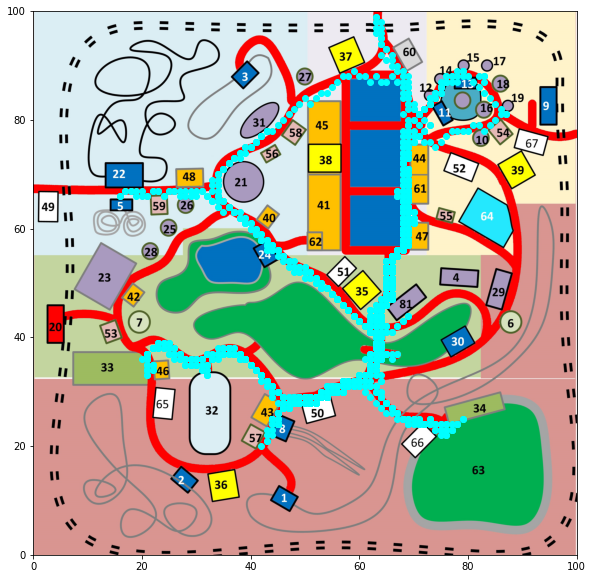

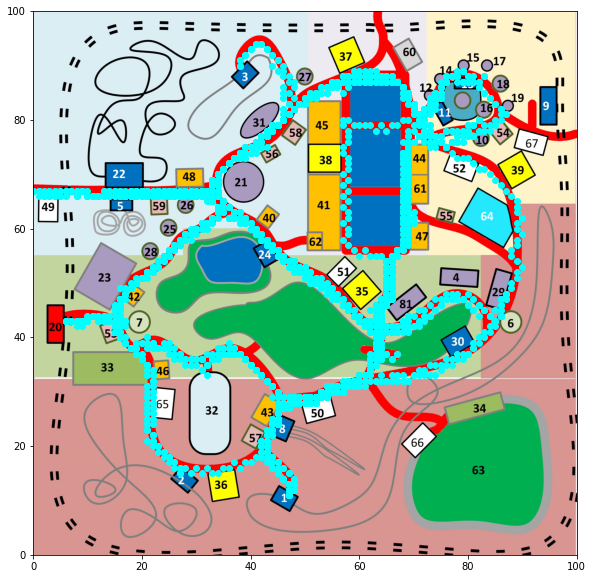

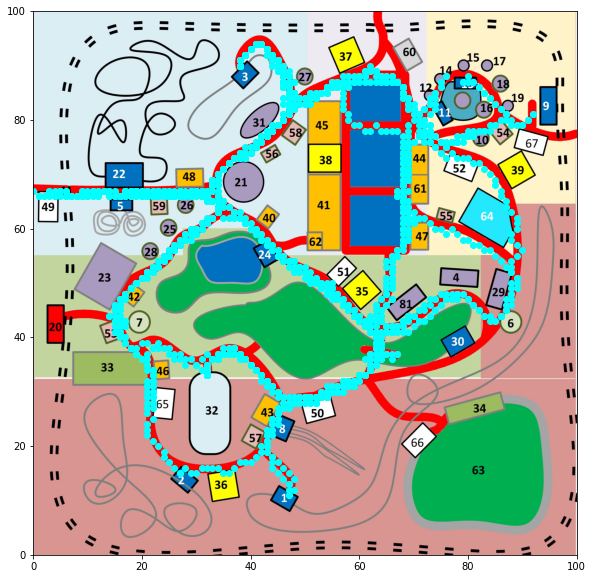

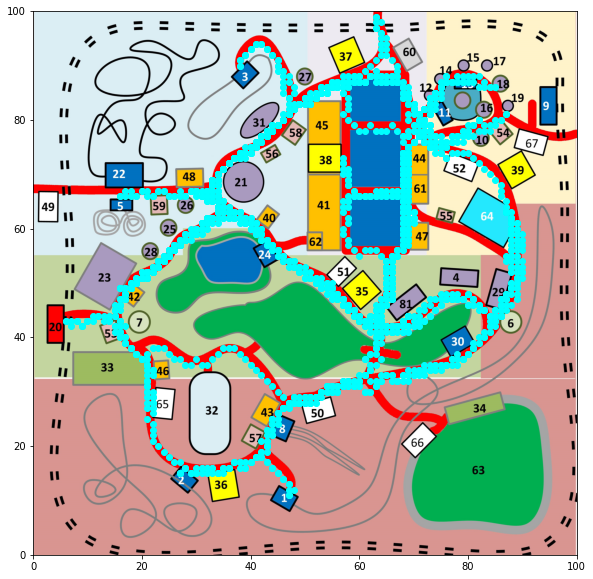

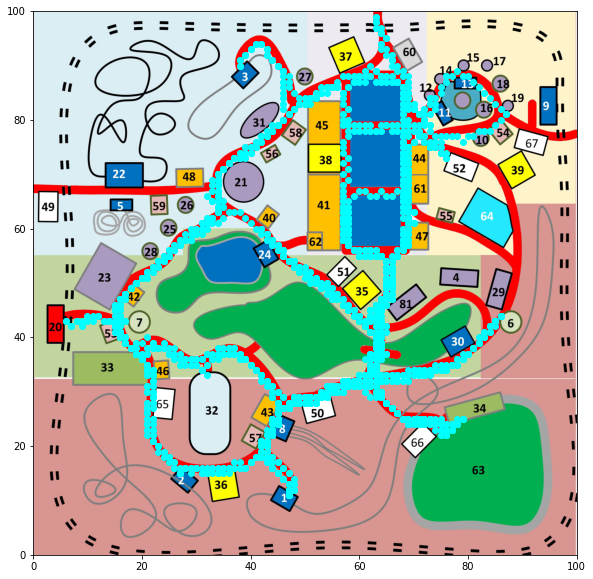

In [383]:
family1 = guestMoveFri_df.loc[guestMoveFri_df['id'] == 1203802]#[guestMoveFri_df['type'] == 'check-in']
im2 = plt.imread('/content/dataroot/task1/Park Map.jpg')
plt.figure(figsize=(10,10))
implot = plt.imshow(im2, extent=[0, 100, 0, 100])
plt.scatter(family1['X'], family1['Y'], c='cyan')
plt.show()
family2 = guestMoveFri_df.loc[guestMoveFri_df['id'] == 1773176]#[guestMoveFri_df['type'] == 'check-in']
im2 = plt.imread('/content/dataroot/task1/Park Map.jpg')
plt.figure(figsize=(10,10))
implot = plt.imshow(im2, extent=[0, 100, 0, 100])
plt.scatter(family2['X'], family2['Y'], c='cyan')
plt.show()
family3 = guestMoveFri_df.loc[guestMoveFri_df['id'] == 619203]#[guestMoveFri_df['type'] == 'check-in']
im2 = plt.imread('/content/dataroot/task1/Park Map.jpg')
plt.figure(figsize=(10,10))
implot = plt.imshow(im2, extent=[0, 100, 0, 100])
plt.scatter(family3['X'], family3['Y'], c='cyan')
plt.show()
family4 = guestMoveFri_df.loc[guestMoveFri_df['id'] == 446167]#[guestMoveFri_df['type'] == 'check-in']
im2 = plt.imread('/content/dataroot/task1/Park Map.jpg')
plt.figure(figsize=(10,10))
implot = plt.imshow(im2, extent=[0, 100, 0, 100])
plt.scatter(family4['X'], family4['Y'], c='cyan')
plt.show()
family5 = guestMoveFri_df.loc[guestMoveFri_df['id'] == 1727579]#[guestMoveFri_df['type'] == 'check-in']
im2 = plt.imread('/content/dataroot/task1/Park Map.jpg')
plt.figure(figsize=(10,10))
implot = plt.imshow(im2, extent=[0, 100, 0, 100])
plt.scatter(family5['X'], family5['Y'], c='cyan')
plt.show()

They Got On The Train And One Never Got Off

 How big is the group type? 5 People

  Where does this type of group like to go in the park? They only came to the park to ride the Scholtz Express

  How common is this type of group? Not common

  What are your other observations about this type of group? One of them never got off the ride

  What can you infer about the group? Only logical reason is they fell off the ride and now haunt it... or their phone died or was dropped on the ride they are most likly season pass holders since they went to the park to ride one ride and then left
  
  If you were to make one improvement to the park to better meet this group’s needs, what would it be? Charging stations

                  Timestamp      id      type   X   Y
3676968 2014-06-06 16:11:36  657863  check-in  63  99
3682916 2014-06-06 16:12:21  657863  movement  63  98
3683987 2014-06-06 16:12:29  657863  movement  64  97
3685116 2014-06-06 16:12:37  657863  movement  64  96
3686258 2014-06-06 16:12:45  657863  movement  65  95
...                     ...     ...       ...  ..  ..
5854386 2014-06-06 21:52:42  657863  movement   9  42
5854709 2014-06-06 21:52:50  657863  movement   8  43
5855012 2014-06-06 21:52:58  657863  movement   7  43
5855352 2014-06-06 21:53:06  657863  movement   6  43
5855618 2014-06-06 21:53:11  657863  check-in   6  43

[149 rows x 5 columns]


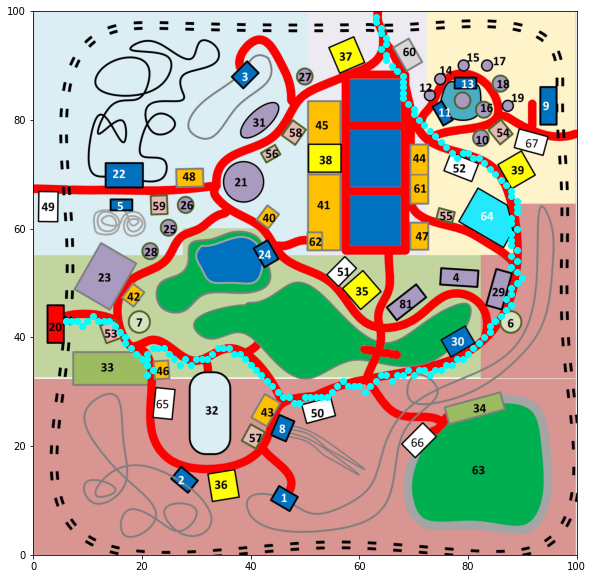

In [384]:
guest=guestMoveFri_df.loc[guestMoveFri_df['id'] == 657863]#[guestMoveFri_df['type'] == 'check-in']
print(guest)
im2 = plt.imread('/content/dataroot/task1/Park Map.jpg')
plt.figure(figsize=(10,10))
implot = plt.imshow(im2, extent=[0, 100, 0, 100])
plt.scatter(guest['X'], guest['Y'], c='cyan')
plt.show()

What anomalies or unusual patterns do you see? Describe no more than 10 anomalies, and prioritize those unusual patterns that you think are most likely to be relevant to the crime.

He just disappears. This has nothing to do with the crime as it happened on Friday, but it is an issue with using an app at an amusement park phones die, have to be put in lockers dropped. The iPhone 12 just lets you say no to apps sharing information. Also kids or people without get temp devices from the park that seems expensive. I would suggest changing to a rubber wearble wrist band that can send all the location data you need and let guest make groups they can use their phone to find their party.

                  Timestamp       id      type   X   Y
3676969 2014-06-06 16:11:36  1412235  check-in  63  99
3682459 2014-06-06 16:12:17  1412235  movement  64  98
3683441 2014-06-06 16:12:25  1412235  movement  63  97
3684573 2014-06-06 16:12:33  1412235  movement  64  96
3685685 2014-06-06 16:12:41  1412235  movement  65  95
...                     ...      ...       ...  ..  ..
5952082 2014-06-06 22:28:32  1412235  movement  65  95
5952405 2014-06-06 22:28:39  1412235  movement  64  96
5952728 2014-06-06 22:28:46  1412235  movement  63  97
5953061 2014-06-06 22:28:53  1412235  movement  64  98
5953361 2014-06-06 22:29:00  1412235  movement  63  99

[222 rows x 5 columns]


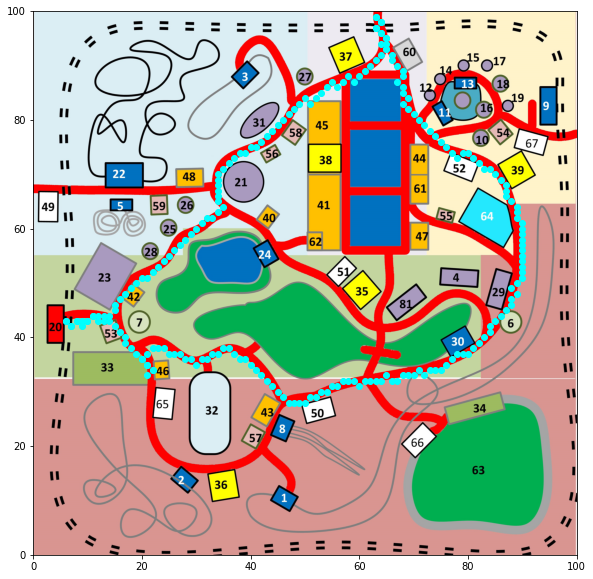

In [385]:
guest=guestMoveFri_df.loc[guestMoveFri_df['id'] == 1412235]#[guestMoveFri_df['type'] == 'check-in']
print(guest)
plt.figure(figsize=(10,10))
implot = plt.imshow(im2, extent=[0, 100, 0, 100])
plt.scatter(guest['X'], guest['Y'], c='cyan')
plt.show()

                  Timestamp      id      type   X   Y
3676967 2014-06-06 16:11:36  103006  check-in  63  99
3682595 2014-06-06 16:12:19  103006  movement  63  98
3683688 2014-06-06 16:12:27  103006  movement  63  97
3684855 2014-06-06 16:12:35  103006  movement  64  96
3685928 2014-06-06 16:12:43  103006  movement  64  95
...                     ...     ...       ...  ..  ..
5952087 2014-06-06 22:28:32  103006  movement  65  95
5952423 2014-06-06 22:28:39  103006  movement  64  96
5952731 2014-06-06 22:28:46  103006  movement  63  97
5953045 2014-06-06 22:28:53  103006  movement  64  98
5953377 2014-06-06 22:29:00  103006  movement  63  99

[222 rows x 5 columns]


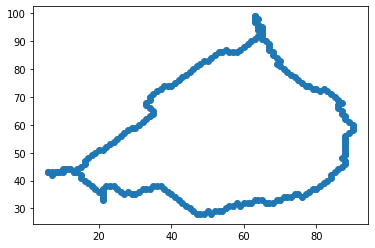

In [386]:
guest=guestMoveFri_df.loc[guestMoveFri_df['id'] == 103006]#[guestMoveFri_df['type'] == 'check-in']
print(guest)
plt.scatter(guest['X'], guest['Y'])
plt.show()

                  Timestamp      id      type   X   Y
3676970 2014-06-06 16:11:36  313073  check-in  63  99
3682502 2014-06-06 16:12:18  313073  movement  64  98
3683584 2014-06-06 16:12:26  313073  movement  64  97
3684768 2014-06-06 16:12:34  313073  movement  64  96
3685861 2014-06-06 16:12:42  313073  movement  65  95
...                     ...     ...       ...  ..  ..
5952075 2014-06-06 22:28:32  313073  movement  65  95
5952398 2014-06-06 22:28:39  313073  movement  64  96
5952704 2014-06-06 22:28:46  313073  movement  64  97
5953036 2014-06-06 22:28:53  313073  movement  63  98
5953396 2014-06-06 22:29:00  313073  movement  63  99

[222 rows x 5 columns]


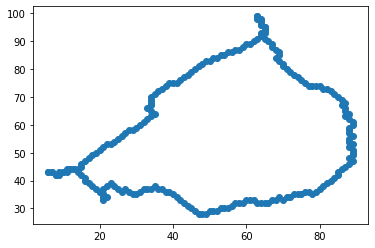

In [387]:
guest=guestMoveFri_df.loc[guestMoveFri_df['id'] == 313073]#[guestMoveFri_df['type'] == 'check-in']
print(guest)
plt.scatter(guest['X'], guest['Y'])
plt.show()

                  Timestamp       id      type   X   Y
3676966 2014-06-06 16:11:36  1937834  check-in  63  99
3682486 2014-06-06 16:12:18  1937834  movement  63  98
3683639 2014-06-06 16:12:26  1937834  movement  63  97
3684701 2014-06-06 16:12:34  1937834  movement  64  96
3685834 2014-06-06 16:12:42  1937834  movement  65  95
...                     ...      ...       ...  ..  ..
5952080 2014-06-06 22:28:32  1937834  movement  64  95
5952394 2014-06-06 22:28:39  1937834  movement  63  96
5952729 2014-06-06 22:28:46  1937834  movement  63  97
5953032 2014-06-06 22:28:53  1937834  movement  64  98
5953395 2014-06-06 22:29:00  1937834  movement  63  99

[222 rows x 5 columns]


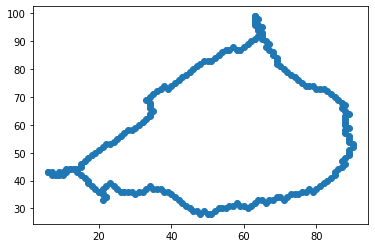

In [388]:
guest=guestMoveFri_df.loc[guestMoveFri_df['id'] == 1937834]#[guestMoveFri_df['type'] == 'check-in']
print(guest)
plt.scatter(guest['X'], guest['Y'])
plt.show()

Scott Jones Group

 How big is the group type? 8 People

  Where does this type of group like to go in the park? They came in the same entrance walked the same path everyday to Scott Jones show twice a day except Sunday when the afternoon show was cancelled

  How common is this type of group? Not common

  What are your other observations about this type of group? They took a very long route around the park

  What can you infer about the group? Scott Jones is either one of these 8 people or he has 8 people with him at all times when in public
  
  If you were to make one improvement to the park to better meet this group’s needs, what would it be? Have them take a quicker route to the stage


id
103006     2
313073     2
521750     2
644885     2
657863     2
1080969    2
1412235    2
1600469    2
1629516    2
1781070    2
1787551    2
1935406    2
1937834    2
dtype: int64
id
521750     2
644885     2
1080969    2
1392457    2
1600469    2
1629516    2
1723510    2
1781070    2
1787551    2
1935406    2
dtype: int64
id
122838     2
970913     2
1340222    2
1473321    2
1476464    2
dtype: int64
                  Timestamp       id      type   X   Y
207535  2014-06-06 08:45:40  1600469  check-in  99  77
212774  2014-06-06 08:46:22  1600469  movement  98  77
213421  2014-06-06 08:46:27  1600469  movement  97  77
214078  2014-06-06 08:46:32  1600469  movement  96  77
214818  2014-06-06 08:46:37  1600469  movement  95  77
...                     ...      ...       ...  ..  ..
4134367 2014-06-06 17:13:49  1600469  movement  95  76
4135599 2014-06-06 17:14:00  1600469  movement  96  77
4136811 2014-06-06 17:14:11  1600469  movement  97  77
4138030 2014-06-06 17:14:22  1600469  

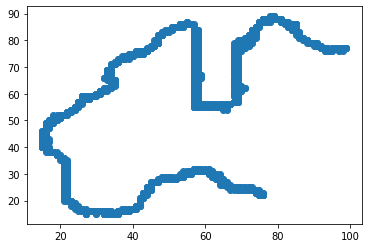

In [389]:
groupA2=guestMoveFri_df.loc[guestMoveFri_df['type'] == 'check-in'].groupby(['id']).size()
print(groupA2[groupA2==2])
groupA2=guestMoveSat_df.loc[guestMoveSat_df['type'] == 'check-in'].groupby(['id']).size()
print(groupA2[groupA2==2])
groupA2=guestMoveSun_df.loc[guestMoveSun_df['type'] == 'check-in'].groupby(['id']).size()
print(groupA2[groupA2==2])
guest=guestMoveFri_df.loc[guestMoveFri_df['id'] == 1600469]#[guestMoveFri_df['type'] == 'check-in']
print(guest)
plt.scatter(guest['X'], guest['Y'])
plt.show()

                  Timestamp       id      type   X   Y
393549  2014-06-08 08:45:32  1935406  check-in  99  77
401780  2014-06-08 08:46:07  1935406  movement  98  77
402912  2014-06-08 08:46:12  1935406  movement  97  77
404134  2014-06-08 08:46:17  1935406  movement  96  77
405230  2014-06-08 08:46:22  1935406  movement  95  77
...                     ...      ...       ...  ..  ..
3431810 2014-06-08 12:13:21  1935406  movement  95  77
3434447 2014-06-08 12:13:32  1935406  movement  96  76
3437173 2014-06-08 12:13:43  1935406  movement  97  77
3439865 2014-06-08 12:13:54  1935406  movement  98  76
3442624 2014-06-08 12:14:05  1935406  movement  99  77

[575 rows x 5 columns]


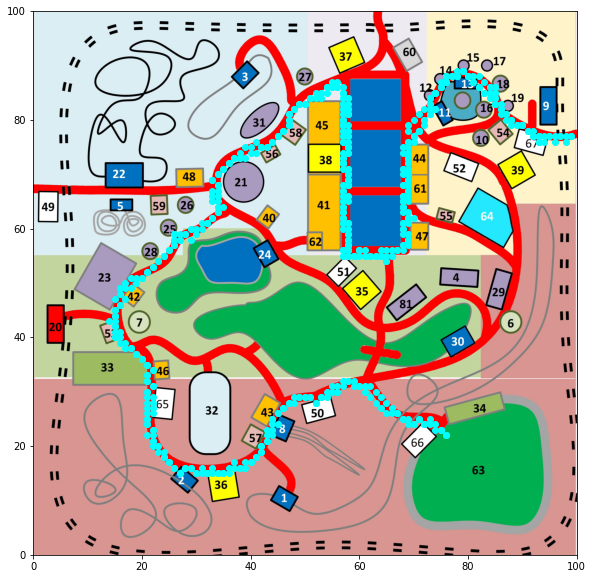

In [390]:
guest=guestMoveSun_df.loc[guestMoveSun_df['id'] == 1935406]#[guestMoveFri_df['type'] == 'check-in']
print(guest)
plt.figure(figsize=(10,10))
implot = plt.imshow(im2, extent=[0, 100, 0, 100])
plt.scatter(guest['X'], guest['Y'], c='cyan')
plt.show()

                  Timestamp       id      type   X   Y
393493  2014-06-08 08:45:32  1600469  check-in  99  77
401732  2014-06-08 08:46:07  1600469  movement  98  77
402865  2014-06-08 08:46:12  1600469  movement  97  77
404088  2014-06-08 08:46:17  1600469  movement  96  77
405177  2014-06-08 08:46:22  1600469  movement  95  77
...                     ...      ...       ...  ..  ..
3431774 2014-06-08 12:13:21  1600469  movement  95  77
3434398 2014-06-08 12:13:32  1600469  movement  96  77
3437134 2014-06-08 12:13:43  1600469  movement  97  76
3439828 2014-06-08 12:13:54  1600469  movement  98  76
3442564 2014-06-08 12:14:05  1600469  movement  99  77

[764 rows x 5 columns]


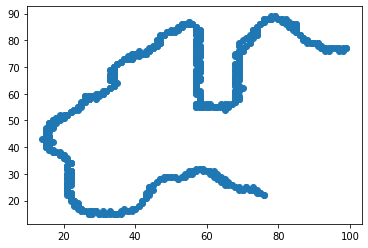

In [391]:
guest=guestMoveSun_df.loc[guestMoveSun_df['id'] == 1600469]#[guestMoveFri_df['type'] == 'check-in']
print(guest)
plt.scatter(guest['X'], guest['Y'])
plt.show()

                  Timestamp       id      type   X   Y
393498  2014-06-08 08:45:32  1629516  check-in  99  77
401739  2014-06-08 08:46:07  1629516  movement  98  77
402872  2014-06-08 08:46:12  1629516  movement  97  77
404095  2014-06-08 08:46:17  1629516  movement  96  77
405181  2014-06-08 08:46:22  1629516  movement  95  77
...                     ...      ...       ...  ..  ..
3434192 2014-06-08 12:13:31  1629516  movement  95  76
3436959 2014-06-08 12:13:42  1629516  movement  96  77
3439563 2014-06-08 12:13:53  1629516  movement  97  76
3442143 2014-06-08 12:14:04  1629516  movement  98  77
3444745 2014-06-08 12:14:15  1629516  movement  99  77

[938 rows x 5 columns]


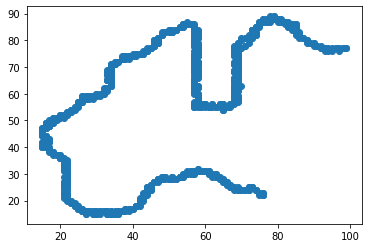

In [392]:
guest=guestMoveSun_df.loc[guestMoveSun_df['id'] == 1629516]#[guestMoveFri_df['type'] == 'check-in']
print(guest)
plt.scatter(guest['X'], guest['Y'])
plt.show()

                  Timestamp      id      type   X   Y
393596  2014-06-08 08:45:32  521750  check-in  99  77
401837  2014-06-08 08:46:07  521750  movement  98  77
402962  2014-06-08 08:46:12  521750  movement  97  77
404189  2014-06-08 08:46:17  521750  movement  96  77
405279  2014-06-08 08:46:22  521750  movement  95  77
...                     ...     ...       ...  ..  ..
3437224 2014-06-08 12:13:43  521750  movement  95  77
3439929 2014-06-08 12:13:54  521750  movement  96  76
3442725 2014-06-08 12:14:05  521750  movement  97  76
3445153 2014-06-08 12:14:16  521750  movement  98  76
3447574 2014-06-08 12:14:27  521750  movement  99  77

[943 rows x 5 columns]


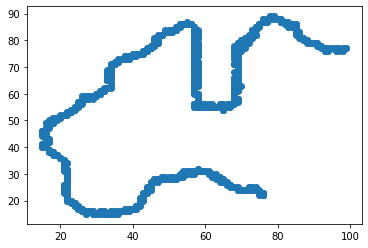

In [393]:
guest=guestMoveSun_df.loc[guestMoveSun_df['id'] == 521750]#[guestMoveFri_df['type'] == 'check-in']
print(guest)
plt.scatter(guest['X'], guest['Y'])
plt.show()

                  Timestamp      id      type   X   Y
393616  2014-06-08 08:45:32  644885  check-in  99  77
401855  2014-06-08 08:46:07  644885  movement  98  77
402980  2014-06-08 08:46:12  644885  movement  97  77
404211  2014-06-08 08:46:17  644885  movement  96  77
405294  2014-06-08 08:46:22  644885  movement  95  77
...                     ...     ...       ...  ..  ..
3434535 2014-06-08 12:13:32  644885  movement  95  76
3437243 2014-06-08 12:13:43  644885  movement  96  76
3439948 2014-06-08 12:13:54  644885  movement  97  77
3442745 2014-06-08 12:14:05  644885  movement  98  77
3445179 2014-06-08 12:14:16  644885  movement  99  77

[937 rows x 5 columns]


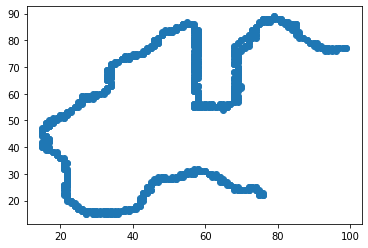

In [394]:
guest=guestMoveSun_df.loc[guestMoveSun_df['id'] == 644885]#[guestMoveSat_df['type'] == 'check-in']
print(guest)
plt.scatter(guest['X'], guest['Y'])
plt.show()

                  Timestamp       id      type   X   Y
393526  2014-06-08 08:45:32  1781070  check-in  99  77
401762  2014-06-08 08:46:07  1781070  movement  98  77
402896  2014-06-08 08:46:12  1781070  movement  97  77
404118  2014-06-08 08:46:17  1781070  movement  96  77
405205  2014-06-08 08:46:22  1781070  movement  95  77
...                     ...      ...       ...  ..  ..
3432056 2014-06-08 12:13:22  1781070  movement  95  77
3434704 2014-06-08 12:13:33  1781070  movement  96  77
3437396 2014-06-08 12:13:44  1781070  movement  97  76
3440115 2014-06-08 12:13:55  1781070  movement  98  76
3442888 2014-06-08 12:14:06  1781070  movement  99  77

[567 rows x 5 columns]


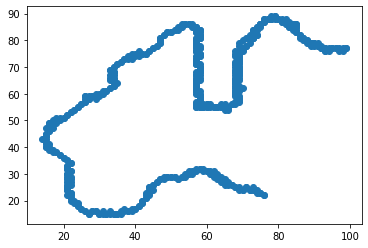

In [395]:
guest=guestMoveSun_df.loc[guestMoveSun_df['id'] == 1781070]#[guestMoveFri_df['type'] == 'check-in']
print(guest)
plt.scatter(guest['X'], guest['Y'])
plt.show()

                  Timestamp       id      type   X   Y
393527  2014-06-08 08:45:32  1787551  check-in  99  77
396240  2014-06-08 08:45:44  1787551  movement  98  76
398915  2014-06-08 08:45:55  1787551  movement  97  76
401565  2014-06-08 08:46:06  1787551  movement  96  77
404120  2014-06-08 08:46:17  1787551  movement  95  77
...                     ...      ...       ...  ..  ..
3431589 2014-06-08 12:13:20  1787551  movement  95  76
3434214 2014-06-08 12:13:31  1787551  movement  96  77
3436972 2014-06-08 12:13:42  1787551  movement  97  77
3439587 2014-06-08 12:13:53  1787551  movement  98  76
3442192 2014-06-08 12:14:04  1787551  movement  99  77

[479 rows x 5 columns]


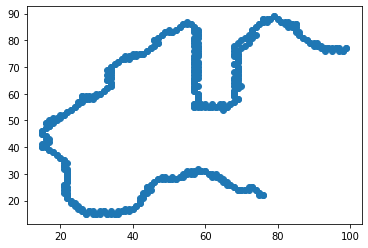

In [396]:
guest=guestMoveSun_df.loc[guestMoveSun_df['id'] == 1787551]#[guestMoveFri_df['type'] == 'check-in']
print(guest)
plt.scatter(guest['X'], guest['Y'])
plt.show()

                  Timestamp       id      type   X   Y
393412  2014-06-08 08:45:32  1080969  check-in  99  77
401673  2014-06-08 08:46:07  1080969  movement  98  77
402809  2014-06-08 08:46:12  1080969  movement  97  77
404026  2014-06-08 08:46:17  1080969  movement  96  77
405097  2014-06-08 08:46:22  1080969  movement  95  77
...                     ...      ...       ...  ..  ..
3431733 2014-06-08 12:13:21  1080969  movement  95  76
3434322 2014-06-08 12:13:32  1080969  movement  96  77
3437079 2014-06-08 12:13:43  1080969  movement  97  76
3439765 2014-06-08 12:13:54  1080969  movement  98  76
3442452 2014-06-08 12:14:05  1080969  movement  99  77

[619 rows x 5 columns]


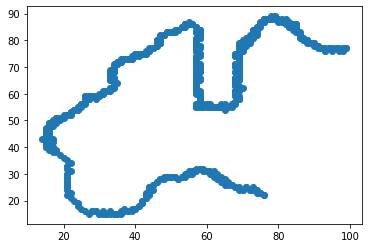

In [397]:
guest=guestMoveSun_df.loc[guestMoveSun_df['id'] == 1080969]#[guestMoveFri_df['type'] == 'check-in']
print(guest)
plt.scatter(guest['X'], guest['Y'])
plt.show()

Not Fans of Scott Jones didn't go to a single show

 How big is the group type? 169 People

  Where does this type of group like to go in the park? This group like trill rides the most and then rides for everyone

  How common is this type of group? Not common

  What are your other observations about this type of group? Over 3 days this group managed to ride every ride in the park

  What can you infer about the group? Probably tourists, fans of a rival team, or Americans
  
  If you were to make one improvement to the park to better meet this group’s needs, what would it be? Find a different special guest that they might want to see

In [398]:
friCheckin = guestMoveFri_df[guestMoveFri_df['type'] == 'check-in']
friCheckinIDs = friCheckin.loc[guestMoveFri_df['type'] == 'check-in'][guestMoveFri_df['X'] == 76][guestMoveFri_df['Y'] == 22]['id']
friCheckinIDs = friCheckinIDs.append(friCheckin.loc[guestMoveFri_df['type'] == 'check-in'][guestMoveFri_df['X'] == 32][guestMoveFri_df['Y'] == 33]['id'])
friCheckinIDs = list(set(friCheckinIDs))
print(len(friCheckinIDs))

indexNames = []
for i in friCheckinIDs:
  indexNames.extend(friCheckin[(friCheckin['id'] == i)].index)
notFansFri = friCheckin.drop(indexNames)
notFansFri = notFansFri['id'].unique()
print(len(notFansFri))

satCheckin = guestMoveSat_df[guestMoveSat_df['type'] == 'check-in']
satCheckinIDs = satCheckin.loc[guestMoveSat_df['type'] == 'check-in'][guestMoveSat_df['X'] == 76][guestMoveSat_df['Y'] == 22]['id']
satCheckinIDs = satCheckinIDs.append(satCheckin.loc[guestMoveSat_df['type'] == 'check-in'][guestMoveSat_df['X'] == 32][guestMoveSat_df['Y'] == 33]['id'])
satCheckinIDs = list(set(satCheckinIDs))
print(len(satCheckinIDs))

indexNames = []
for i in satCheckinIDs:
  indexNames.extend(satCheckin[(satCheckin['id'] == i)].index)
notFansSat = satCheckin.drop(indexNames)
notFansSat = notFansSat['id'].unique()
print(len(notFansSat))

sunCheckin = guestMoveSun_df[guestMoveSun_df['type'] == 'check-in']
sunCheckinIDs = sunCheckin.loc[guestMoveSun_df['type'] == 'check-in'][guestMoveSun_df['X'] == 76][guestMoveSun_df['Y'] == 22]['id']
sunCheckinIDs = sunCheckinIDs.append(sunCheckin.loc[guestMoveSun_df['type'] == 'check-in'][guestMoveSun_df['X'] == 32][guestMoveSun_df['Y'] == 33]['id'])
sunCheckinIDs = list(set(sunCheckinIDs))
print(len(sunCheckinIDs))

indexNames = []
for i in sunCheckinIDs:
  indexNames.extend(sunCheckin[(sunCheckin['id'] == i)].index)
notFansSun = sunCheckin.drop(indexNames)
notFansSun = notFansSun['id'].unique()
print(len(notFansSun))

notFans = list(set.intersection(*map(set, [notFansFri, notFansSat, notFansSun])))
print(len(notFans))
notFans

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until


2695
862


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  app.launch_new_instance()


4568
1842


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:28: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:29: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


2168
5401
169


[205315,
 1576452,
 1406469,
 1981451,
 1809420,
 571405,
 278036,
 1898006,
 521750,
 73245,
 1382429,
 454701,
 1935406,
 442925,
 1330734,
 1243186,
 1705011,
 180277,
 1585206,
 1491001,
 1723967,
 1534016,
 2046019,
 1834564,
 1976906,
 1562186,
 1492555,
 1994315,
 499275,
 1337430,
 1843798,
 1789535,
 1162853,
 1089132,
 476784,
 558196,
 399477,
 1380475,
 697469,
 1210500,
 169093,
 674952,
 1080969,
 353418,
 1237644,
 714380,
 1603218,
 73365,
 832662,
 231065,
 886431,
 2056864,
 77985,
 1787551,
 272033,
 1936551,
 398504,
 494252,
 1901230,
 998575,
 1358002,
 2095284,
 609983,
 1523396,
 1695941,
 1635527,
 73415,
 1905354,
 96972,
 720589,
 1124046,
 1618639,
 1314513,
 253140,
 1352405,
 1424087,
 1134821,
 1559270,
 1549032,
 680685,
 1060589,
 1829621,
 1187061,
 187130,
 1828090,
 1667325,
 737536,
 1269504,
 1152260,
 1243914,
 1751308,
 1202957,
 1125646,
 612108,
 956179,
 644885,
 204057,
 1074970,
 702236,
 1308960,
 560932,
 240423,
 672552,
 291624,
 1119534

In [399]:
# attraction_df['xy'] = list(zip(attraction_df['X'], attraction_df['Y']))
# attraction_df

In [400]:
notFans_table = pd.DataFrame()
for i in notFans:
  notFans_table = notFans_table.append(guestMoveFri_df.loc[guestMoveFri_df['id'] == i][guestMoveFri_df['type'] == 'check-in'], ignore_index=True)
  notFans_table = notFans_table.append(guestMoveSat_df.loc[guestMoveSat_df['id'] == i][guestMoveSat_df['type'] == 'check-in'], ignore_index=True)
  notFans_table = notFans_table.append(guestMoveSun_df.loc[guestMoveSun_df['id'] == i][guestMoveSun_df['type'] == 'check-in'], ignore_index=True)
notFans_table

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_l

,Timestamp,id,type,X,Y
0,2014-06-06 08:06:23,205315,check-in,63,99
1,2014-06-06 08:09:19,205315,check-in,73,79
2,2014-06-06 08:19:42,205315,check-in,86,44
3,2014-06-06 08:29:48,205315,check-in,73,84
4,2014-06-06 09:05:54,205315,check-in,47,11
...,...,...,...,...,...
7383,2014-06-08 15:39:10,1190398,check-in,67,37
7384,2014-06-08 16:02:26,1190398,check-in,48,87
7385,2014-06-08 17:52:58,1190398,check-in,83,88
7386,2014-06-08 18:36:20,1190398,check-in,27,15


In [401]:
notFans_table['xy'] = list(zip(notFans_table['X'], notFans_table['Y']))
notFans_table_merge = pd.merge(notFans_table,attraction_df, on=['xy'])
#notFans_table_merge
notFans_count = notFans_table_merge.groupby(['Name'])['id'].count()
notFans_count

Name
Atmofear                     442
Auvilotops Express           411
Beelzebufo                   116
Blue Iguanodon                78
Cyndinsaurus Asteriod         96
Dykesadactyl Trill           108
Eberlesaurus Roundup         135
Enchanted Toadstools          83
Entry Corridor East          151
Entry Corridor North         276
Entry Corridor West           96
Firefall                     407
Flight of the Swingodon      405
Flying TyrAndrienkos         121
Galactosaurus Rage           347
Ichthyoroberts Rapids        142
Jeredactyl Jump               91
Jurassic Road                117
Kaul's Lost Canyon Escape    134
Keimosaurus Big Spin         437
Kristaodon Kaper             112
Liggement Fix-Me-Up            9
Maiasaur Madness             143
North Line                    81
Paleocarrie Carosel           98
Raptor Race                   95
Rhynasaurus Rampage          117
SabreTooth Theatre           228
Sauroma Bumpers               98
Scholtz Express              103
Squid

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


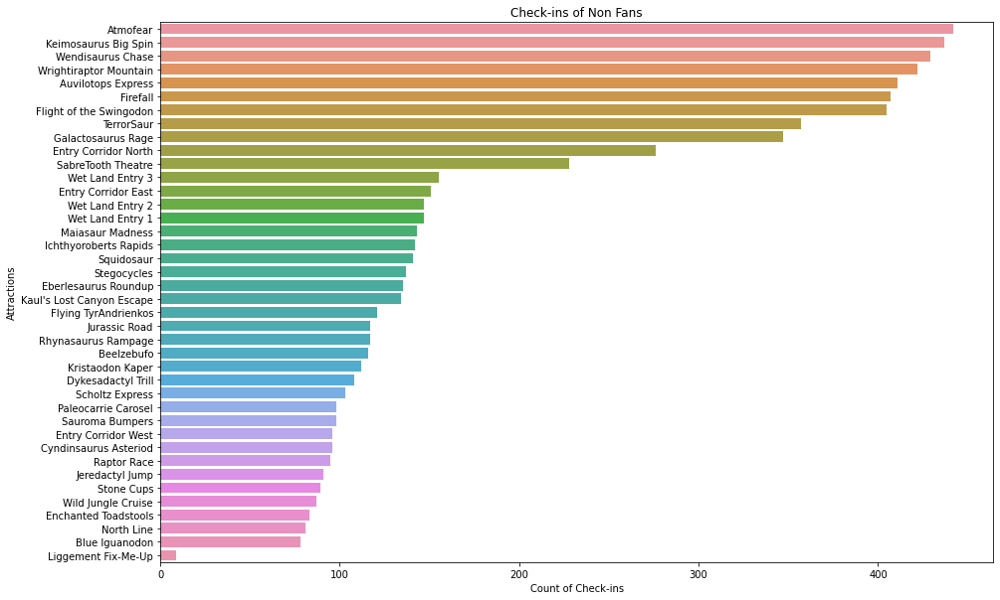

In [402]:
notFans_count=notFans_count.sort_values(ascending=False)
plt.figure(figsize=(15,10))
NotFans_plot=sns.barplot(notFans_count.values, notFans_count.index,)
NotFans_plot.set(xlabel='Count of Check-ins', ylabel = 'Attractions', title='Check-ins of Non Fans')
NotFans_plot

All Dayers

 How big is the group type? 7 People

  Where does this type of group like to go in the park? Rides for everyone and some trill rides

  How common is this type of group? Not common

  What are your other observations about this type of group? While other groups did stay from open to close this group got into the park in the first 30 minutes and left well after closing they didn't go on Wrightraptor Mountian the biggest roller coaster in the park

  What can you infer about the group? Chafing, wanted to get the most out of their money
  
  If you were to make one improvement to the park to better meet this group’s needs, what would it be? First aid station should have sunscreen $12 refillable cup can be refilled with water

In [403]:
openCheckinFri = guestMoveFri_df.loc[(guestMoveFri_df['Timestamp'] >= '2014-6-08 08:00:00') & (guestMoveFri_df['Timestamp'] <= '2014-6-08 08:31:00') & (guestMoveFri_df['type'] == 'check-in')]['id'].unique()
closeCheckOutFri = guestMoveFri_df.loc[(guestMoveFri_df['Timestamp'] > '2014-6-08 23:00:00')]['id'].unique()
allDayGuestsFri = np.intersect1d(openCheckinFri,closeCheckOutFri)
print(allDayGuestsFri)

openCheckinSat = guestMoveSat_df.loc[(guestMoveSat_df['Timestamp'] >= '2014-6-08 08:00:00') & (guestMoveSat_df['Timestamp'] <= '2014-6-08 08:31:00') & (guestMoveSat_df['type'] == 'check-in')]['id'].unique()
closeCheckOutSat = guestMoveSat_df.loc[(guestMoveSat_df['Timestamp'] > '2014-6-08 23:00:00')]['id'].unique()
allDayGuestsSat = np.intersect1d(openCheckinSat,closeCheckOutSat)
print(allDayGuestsSat)

openCheckinSun = guestMoveSun_df.loc[(guestMoveSun_df['Timestamp'] >= '2014-6-08 08:00:00') & (guestMoveSun_df['Timestamp'] <= '2014-6-08 08:31:00') & (guestMoveSun_df['type'] == 'check-in')]['id'].unique()
closeCheckOutSun = guestMoveSun_df.loc[(guestMoveSun_df['Timestamp'] > '2014-6-08 23:00:00')]['id'].unique()
allDayGuestsSun = np.intersect1d(openCheckinSun,closeCheckOutSun)
print(allDayGuestsSun)

[]
[]
[ 618887  644080  768020 1679104 1741587 1807223 2065050]


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


                   Timestamp      id      type   X   Y
78395    2014-06-08 08:16:19  618887  check-in  63  99
166727   2014-06-08 08:26:07  618887  check-in  79  87
615682   2014-06-08 09:00:15  618887  check-in  38  90
810090   2014-06-08 09:12:23  618887  check-in  92  81
1352581  2014-06-08 09:47:37  618887  check-in  34  68
1558071  2014-06-08 10:02:25  618887  check-in  17  43
2334979  2014-06-08 11:02:21  618887  check-in  76  88
2600633  2014-06-08 11:18:01  618887  check-in  17  43
3609483  2014-06-08 12:25:03  618887  check-in  16  66
5807687  2014-06-08 14:53:34  618887  check-in  86  44
6018221  2014-06-08 15:07:43  618887  check-in  27  15
6158968  2014-06-08 15:18:48  618887  check-in  43  78
6518821  2014-06-08 15:46:38  618887  check-in  17  67
6701901  2014-06-08 16:00:25  618887  check-in  78  37
7169159  2014-06-08 16:36:08  618887  check-in  45  24
7299170  2014-06-08 16:46:39  618887  check-in  81  77
7567645  2014-06-08 17:09:07  618887  check-in   6  43
8182697  2

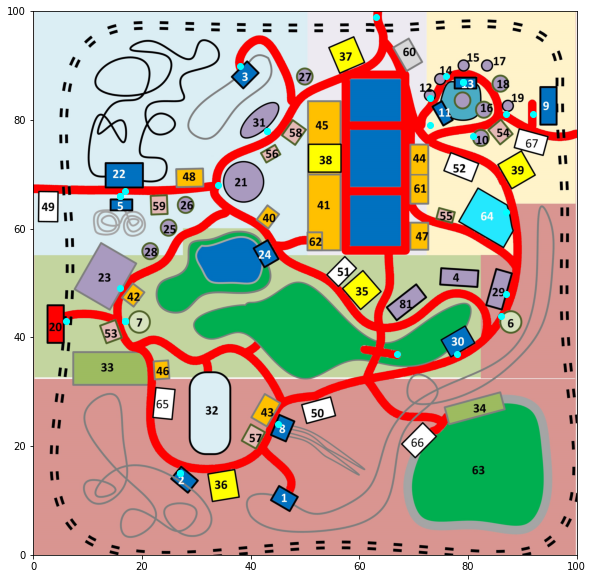

In [404]:
guest=guestMoveSun_df.loc[guestMoveSun_df['id'] == 618887][guestMoveSun_df['type'] == 'check-in']
print(guest)
plt.figure(figsize=(10,10))
implot = plt.imshow(im2, extent=[0, 100, 0, 100])
plt.scatter(guest['X'], guest['Y'], c='cyan')
plt.show()

                   Timestamp      id      type   X   Y
78397    2014-06-08 08:16:19  644080  check-in  63  99
136884   2014-06-08 08:22:59  644080  movement  64  98
137990   2014-06-08 08:23:06  644080  movement  64  97
139044   2014-06-08 08:23:13  644080  movement  64  96
140138   2014-06-08 08:23:20  644080  movement  64  95
...                      ...     ...       ...  ..  ..
10893769 2014-06-08 23:04:16  644080  movement  64  95
10893950 2014-06-08 23:04:23  644080  movement  63  96
10894154 2014-06-08 23:04:30  644080  movement  64  97
10894355 2014-06-08 23:04:37  644080  movement  64  98
10894515 2014-06-08 23:04:44  644080  movement  63  99

[2160 rows x 5 columns]


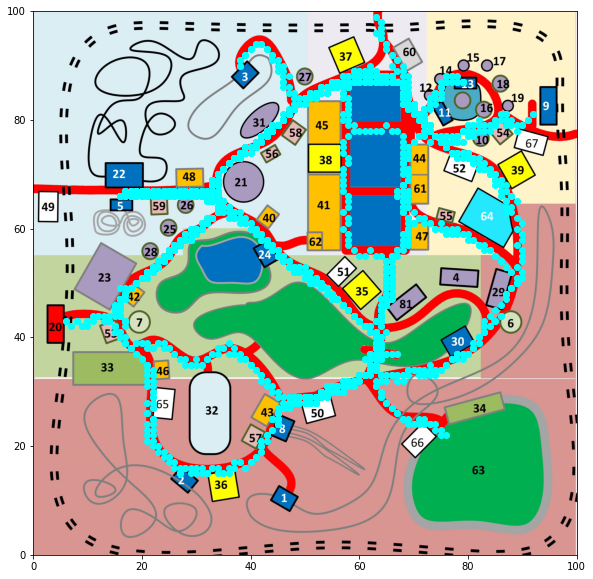

In [405]:
guest=guestMoveSun_df.loc[guestMoveSun_df['id'] == 644080]#[guestMoveSun_df['type'] == 'check-in']
print(guest)
plt.figure(figsize=(10,10))
implot = plt.imshow(im2, extent=[0, 100, 0, 100])
plt.scatter(guest['X'], guest['Y'], c='cyan')
plt.show()

                   Timestamp      id      type   X   Y
78415    2014-06-08 08:16:19  768020  check-in  63  99
166892   2014-06-08 08:26:08  768020  check-in  79  87
616096   2014-06-08 09:00:16  768020  check-in  38  90
810409   2014-06-08 09:12:24  768020  check-in  92  81
1352852  2014-06-08 09:47:38  768020  check-in  34  68
1558238  2014-06-08 10:02:26  768020  check-in  17  43
2335369  2014-06-08 11:02:22  768020  check-in  76  88
2600857  2014-06-08 11:18:02  768020  check-in  17  43
3609819  2014-06-08 12:25:04  768020  check-in  16  66
5807354  2014-06-08 14:53:33  768020  check-in  86  44
6018074  2014-06-08 15:07:42  768020  check-in  27  15
6159244  2014-06-08 15:18:49  768020  check-in  43  78
6519053  2014-06-08 15:46:39  768020  check-in  17  67
6701632  2014-06-08 16:00:24  768020  check-in  78  37
7168985  2014-06-08 16:36:07  768020  check-in  45  24
7299184  2014-06-08 16:46:39  768020  check-in  81  77
7567656  2014-06-08 17:09:07  768020  check-in   6  43
8182467  2

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


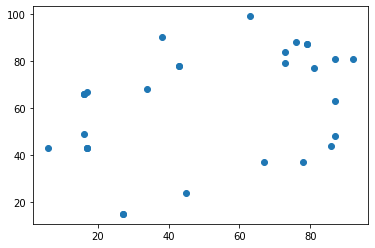

In [406]:
guest=guestMoveSun_df.loc[guestMoveSun_df['id'] == 768020][guestMoveSun_df['type'] == 'check-in']
print(guest)
plt.scatter(guest['X'], guest['Y'])
plt.show()

                   Timestamp       id      type   X   Y
78309    2014-06-08 08:16:19  1679104  check-in  63  99
166675   2014-06-08 08:26:07  1679104  check-in  79  87
615887   2014-06-08 09:00:16  1679104  check-in  38  90
810247   2014-06-08 09:12:24  1679104  check-in  92  81
1352253  2014-06-08 09:47:36  1679104  check-in  34  68
1558168  2014-06-08 10:02:26  1679104  check-in  17  43
2334376  2014-06-08 11:02:20  1679104  check-in  76  88
2600741  2014-06-08 11:18:02  1679104  check-in  17  43
3609400  2014-06-08 12:25:03  1679104  check-in  16  66
5807851  2014-06-08 14:53:35  1679104  check-in  86  44
6017947  2014-06-08 15:07:42  1679104  check-in  27  15
6158886  2014-06-08 15:18:48  1679104  check-in  43  78
6518936  2014-06-08 15:46:39  1679104  check-in  17  67
6701505  2014-06-08 16:00:24  1679104  check-in  78  37
7169286  2014-06-08 16:36:09  1679104  check-in  45  24
7299071  2014-06-08 16:46:39  1679104  check-in  81  77
7567576  2014-06-08 17:09:07  1679104  check-in 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


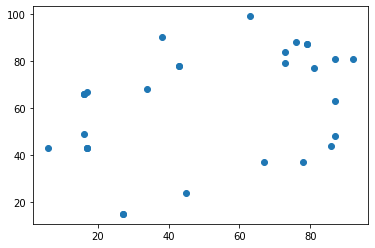

In [407]:
guest=guestMoveSun_df.loc[guestMoveSun_df['id'] == 1679104][guestMoveSun_df['type'] == 'check-in']
print(guest)
plt.scatter(guest['X'], guest['Y'])
plt.show()

                   Timestamp       id      type   X   Y
78314    2014-06-08 08:16:19  1741587  check-in  63  99
166821   2014-06-08 08:26:08  1741587  check-in  79  87
615903   2014-06-08 09:00:16  1741587  check-in  38  90
809712   2014-06-08 09:12:22  1741587  check-in  92  81
1352728  2014-06-08 09:47:38  1741587  check-in  34  68
1558172  2014-06-08 10:02:26  1741587  check-in  17  43
2334399  2014-06-08 11:02:20  1741587  check-in  76  88
2600750  2014-06-08 11:18:02  1741587  check-in  17  43
3609661  2014-06-08 12:25:04  1741587  check-in  16  66
5807212  2014-06-08 14:53:33  1741587  check-in  86  44
6018348  2014-06-08 15:07:44  1741587  check-in  27  15
6158891  2014-06-08 15:18:48  1741587  check-in  43  78
6518942  2014-06-08 15:46:39  1741587  check-in  17  67
6702049  2014-06-08 16:00:26  1741587  check-in  78  37
7169300  2014-06-08 16:36:09  1741587  check-in  45  24
7299077  2014-06-08 16:46:39  1741587  check-in  81  77
7567584  2014-06-08 17:09:07  1741587  check-in 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


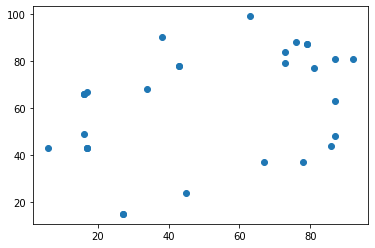

In [408]:
guest=guestMoveSun_df.loc[guestMoveSun_df['id'] == 1741587][guestMoveSun_df['type'] == 'check-in']
print(guest)
plt.scatter(guest['X'], guest['Y'])
plt.show()

                   Timestamp       id      type   X   Y
78324    2014-06-08 08:16:19  1807223  check-in  63  99
166825   2014-06-08 08:26:08  1807223  check-in  79  87
615269   2014-06-08 09:00:14  1807223  check-in  38  90
810274   2014-06-08 09:12:24  1807223  check-in  92  81
1352269  2014-06-08 09:47:36  1807223  check-in  34  68
1558178  2014-06-08 10:02:26  1807223  check-in  17  43
2335215  2014-06-08 11:02:22  1807223  check-in  76  88
2600344  2014-06-08 11:18:00  1807223  check-in  17  43
3609418  2014-06-08 12:25:03  1807223  check-in  16  66
5807222  2014-06-08 14:53:33  1807223  check-in  86  44
6018353  2014-06-08 15:07:44  1807223  check-in  27  15
6159145  2014-06-08 15:18:49  1807223  check-in  43  78
6518950  2014-06-08 15:46:39  1807223  check-in  17  67
6701527  2014-06-08 16:00:24  1807223  check-in  78  37
7168913  2014-06-08 16:36:07  1807223  check-in  45  24
7299088  2014-06-08 16:46:39  1807223  check-in  81  77
7567589  2014-06-08 17:09:07  1807223  check-in 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


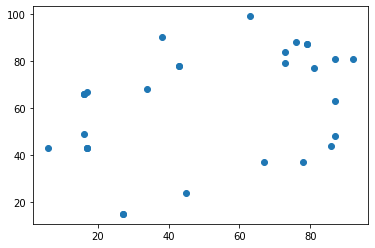

In [409]:
guest=guestMoveSun_df.loc[guestMoveSun_df['id'] == 1807223][guestMoveSun_df['type'] == 'check-in']
print(guest)
plt.scatter(guest['X'], guest['Y'])
plt.show()

                   Timestamp       id      type   X   Y
78351    2014-06-08 08:16:19  2065050  check-in  63  99
166569   2014-06-08 08:26:06  2065050  check-in  79  87
615310   2014-06-08 09:00:14  2065050  check-in  38  90
810316   2014-06-08 09:12:24  2065050  check-in  92  81
1352772  2014-06-08 09:47:38  2065050  check-in  34  68
1558198  2014-06-08 10:02:26  2065050  check-in  17  43
2335268  2014-06-08 11:02:22  2065050  check-in  76  88
2600387  2014-06-08 11:18:00  2065050  check-in  17  43
3609443  2014-06-08 12:25:03  2065050  check-in  16  66
5807264  2014-06-08 14:53:33  2065050  check-in  86  44
6018000  2014-06-08 15:07:42  2065050  check-in  27  15
6158932  2014-06-08 15:18:48  2065050  check-in  43  78
6518983  2014-06-08 15:46:39  2065050  check-in  17  67
6702100  2014-06-08 16:00:26  2065050  check-in  78  37
7168932  2014-06-08 16:36:07  2065050  check-in  45  24
7299113  2014-06-08 16:46:39  2065050  check-in  81  77
7567608  2014-06-08 17:09:07  2065050  check-in 

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """Entry point for launching an IPython kernel.


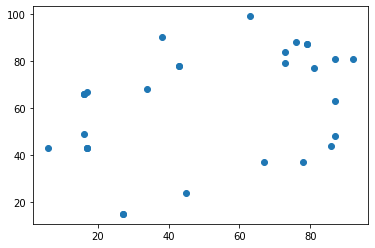

In [410]:
guest=guestMoveSun_df.loc[guestMoveSun_df['id'] == 2065050][guestMoveSun_df['type'] == 'check-in']
print(guest)
plt.scatter(guest['X'], guest['Y'])
plt.show()